# Airline Passenger Satisfaction - Model

### Ad 1. Split dataset

#### Algorithm

In [283]:
from numpy.random import RandomState
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%store -r data

In [284]:
class Splitter:
    def __init__(self, dataset, split=0.2):
        self.__df = dataset.drop(['ind'], axis=1) # pd.read_csv(fileName, sep=',')
        self.__train = self.__df.sample(frac=1-split, random_state=RandomState())
        
    def dataset_X(self):
        return self.__df.drop(columns=['satisfaction'])
    
    def dataset_y(self):
        return self.__df['satisfaction']
        
    def train_data(self):
        return self.__train
    
    def test_data(self):
        return self.__df.loc[~self.__df.index.isin(self.__train.index)]
    
    def __train_X_data(self):
        tmp_df = self.__train
        return tmp_df.drop(columns=['satisfaction'])
    
    def __train_Y_data(self):
        return self.__train['satisfaction']
    
    def __test_X_data(self):
        tmp_df = self.__df.loc[~self.__df.index.isin(self.__train.index)]
        return tmp_df.drop(columns=['satisfaction'])
    
    def __test_Y_data(self):
        return self.__df.loc[~self.__df.index.isin(self.__train.index)]['satisfaction']
    
    def split_train_test(self):
        return self.__train_X_data(), self.__train_Y_data(), self.__test_X_data(), self.__test_Y_data()

In [285]:
sp = Splitter(data)

train_shape = sp.train_data().shape
test_shape = sp.test_data().shape
train_x, train_y, test_x, test_y = sp.split_train_test()

#### Result of split

In [286]:
total = train_shape[0] + test_shape[0]
print('Train dataset percent: ' + str(train_shape[0]/total * 100) + ', and test dataset percent: ' + str(test_shape[0]/total * 100))

Train dataset percent: 80.0, and test dataset percent: 20.0


### Ad 2. Classificators

In [287]:
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from sklearn.naive_bayes import GaussianNB

##### Accurace & F1-score

In [288]:
def accurace(confusion_matrix):
    return (confusion_matrix[0][0] + confusion_matrix[1][1]) / (confusion_matrix[0][0] + confusion_matrix[0][1] + confusion_matrix[1][0] + confusion_matrix[1][1])
    
def f1score(confusion_matrix):
    cls1 = (2 * confusion_matrix[0][0])/(2 * confusion_matrix[0][0] + confusion_matrix[1][0] + confusion_matrix[0][1])
    cls2 = (2 * confusion_matrix[1][1])/(2 * confusion_matrix[1][1] + confusion_matrix[1][0] + confusion_matrix[0][1])
    return (cls1 + cls2) / 2

## 5 Classifiers

In [289]:
classifier_list = {
    'SVC': SVC(),
    'DecisionTreeClassifier': DecisionTreeClassifier(),
    'QuadraticDiscriminantAnalysis': QuadraticDiscriminantAnalysis(),
    'GradientBoostingClassifier': GradientBoostingClassifier(),
    'Naive Gaussian': GaussianNB()
}


In [290]:
def run_classifier(classifier_list, key, x_train, y_train, x_test, y_test):
    print('[INFO] Classifier: '+ key)
    classifier_list[key].fit(x_train, y_train)
    y_pred = classifier_list[key].predict(x_test)
    return confusion_matrix(y_test, y_pred)

In [291]:
def calc_classifier_stats(clf_conf, key):
    tmp = []
    tmp.append(key)
    tmp.append(accurace(clf_conf[key]))
    tmp.append(f1score(clf_conf[key]))
    return tmp

In [292]:
def draw_confusion_matrix(classifier_list, key, x_test, y_test):
    disp = plot_confusion_matrix(classifier_list[key], x_test, y_test)
    disp.ax_.set_title('Classifier '+ key)
    plt.show()

In [293]:
def show_stats(summary):
    df = pd.DataFrame(summary, columns=['Classifier', 'Accurace', 'F1 Score'], index=None)
    print(df.to_string(index=None))

[INFO] Classifier: SVC


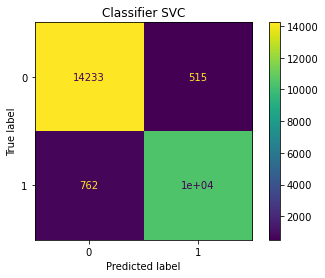

['SVC', 0.9508392362180474, 0.949783157996121]
[INFO] Classifier: DecisionTreeClassifier


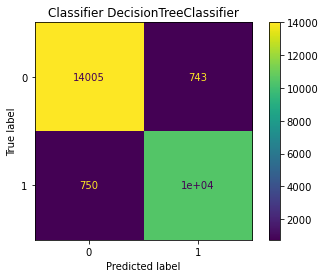

['DecisionTreeClassifier', 0.9425238681860179, 0.941444336802967]
[INFO] Classifier: QuadraticDiscriminantAnalysis


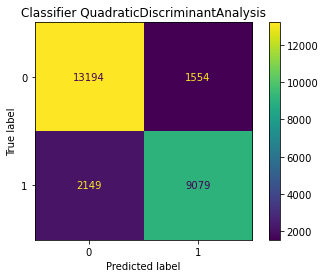

['QuadraticDiscriminantAnalysis', 0.8574453341546042, 0.8537757701202073]
[INFO] Classifier: GradientBoostingClassifier


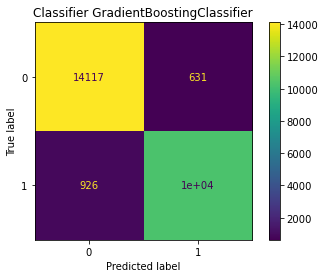

['GradientBoostingClassifier', 0.9400600554357869, 0.9387386655256884]
[INFO] Classifier: Naive Gaussian


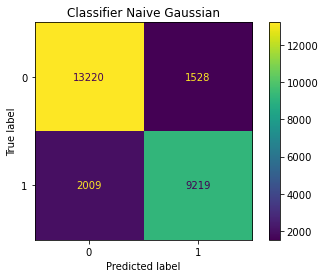

['Naive Gaussian', 0.8638358484755159, 0.8605269546242562]


In [12]:
clf_conf = {}
summary = []
for key in classifier_list:
    clf_conf[key] = run_classifier(classifier_list, key, train_x, train_y, test_x, test_y)
    stats = calc_classifier_stats(clf_conf, key)
    summary.append(stats)
    draw_confusion_matrix(classifier_list, key, test_x, test_y)
    print(stats)


In [13]:
show_stats(summary)

                    Classifier  Accurace  F1 Score
                           SVC  0.950839  0.949783
        DecisionTreeClassifier  0.942524  0.941444
 QuadraticDiscriminantAnalysis  0.857445  0.853776
    GradientBoostingClassifier  0.940060  0.938739
                Naive Gaussian  0.863836  0.860527


#### SVC boundry plot

In [295]:
def make_meshgrid(x, y, h=.02):
    """Create a mesh of points to plot in

    Parameters
    ----------
    x: data to base x-axis meshgrid on
    y: data to base y-axis meshgrid on
    h: stepsize for meshgrid, optional

    Returns
    -------
    xx, yy : ndarray
    """
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    return xx, yy

In [296]:
def plot_contours(ax, clf, xx, yy, **params):
    """Plot the decision boundaries for a classifier.

    Parameters
    ----------
    ax: matplotlib axes object
    clf: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    params: dictionary of params to pass to contourf, optional
    """
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out

In [297]:
from sklearn import svm, datasets
def plot_decision_boundaries(X, y, clf, title="Boundaries Graph"):
    plt.figure(figsize=(20,10))
    fig, ax = plt.subplots()
#     plt.subplots_adjust(wspace=0.4, hspace=0.4)

    X0, X1 = X[:, 0], X[:, 1]
    xx, yy = make_meshgrid(X0, X1)
    
    plot_contours(ax, clf, xx, yy, cmap=plt.cm.coolwarm, alpha=0.8)
    ax.scatter(X0, X1, c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xlabel('Sepal length')
    ax.set_ylabel('Sepal width')
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(title)
    plt.show()

In [298]:
def calc_decision_boundaries(X, y, clf):
    # we create an instance of SVM and fit out data. We do not scale our
    # data since we want to plot the support vectors
    clf.fit(X, y)
    return (X, y, clf)

<Figure size 1440x720 with 0 Axes>

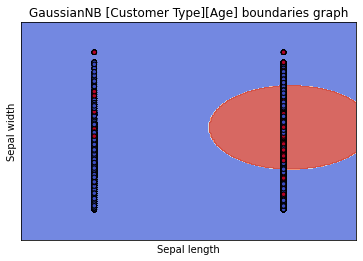

<Figure size 1440x720 with 0 Axes>

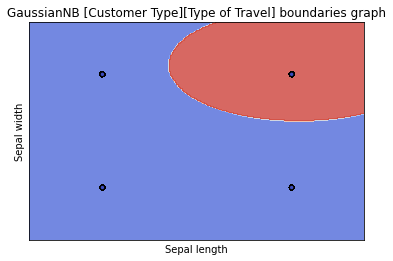

<Figure size 1440x720 with 0 Axes>

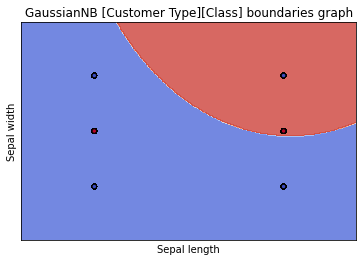

<Figure size 1440x720 with 0 Axes>

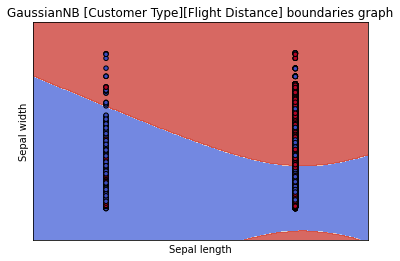

<Figure size 1440x720 with 0 Axes>

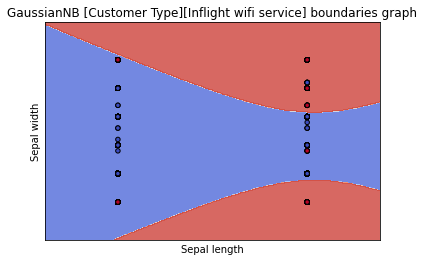

<Figure size 1440x720 with 0 Axes>

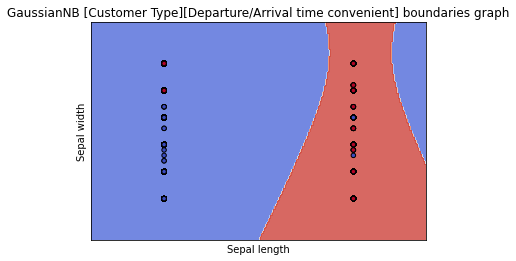

<Figure size 1440x720 with 0 Axes>

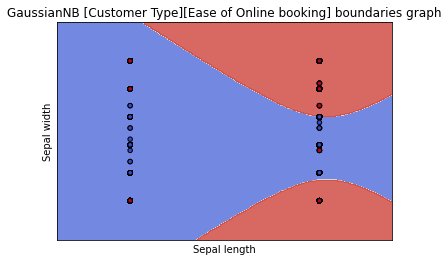

<Figure size 1440x720 with 0 Axes>

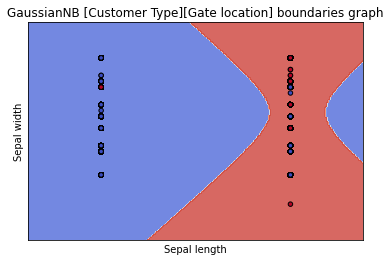

<Figure size 1440x720 with 0 Axes>

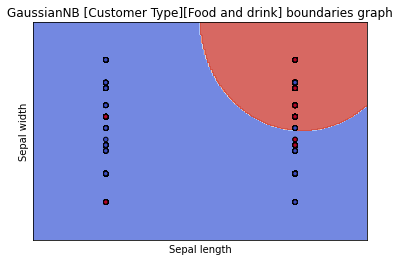

<Figure size 1440x720 with 0 Axes>

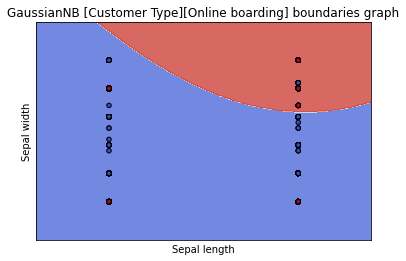

<Figure size 1440x720 with 0 Axes>

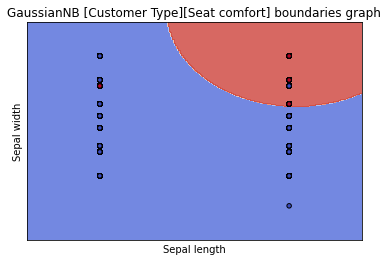

<Figure size 1440x720 with 0 Axes>

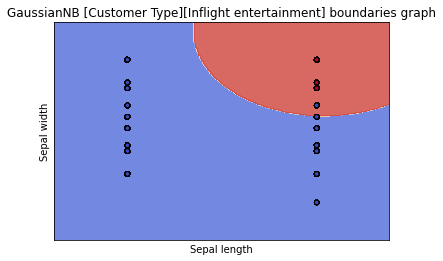

<Figure size 1440x720 with 0 Axes>

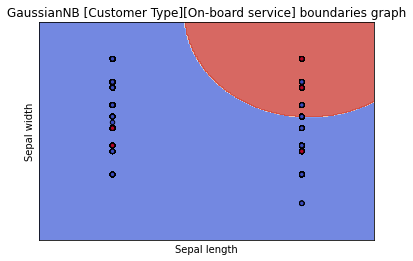

<Figure size 1440x720 with 0 Axes>

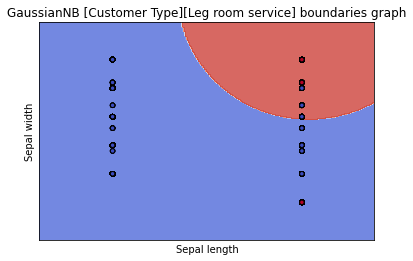

<Figure size 1440x720 with 0 Axes>

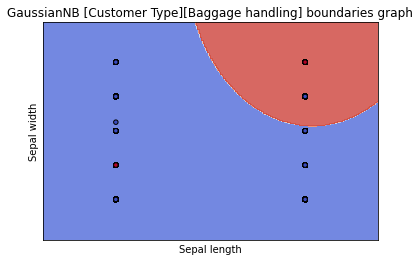

<Figure size 1440x720 with 0 Axes>

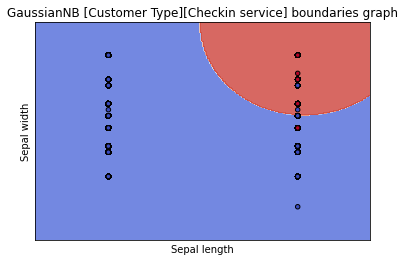

<Figure size 1440x720 with 0 Axes>

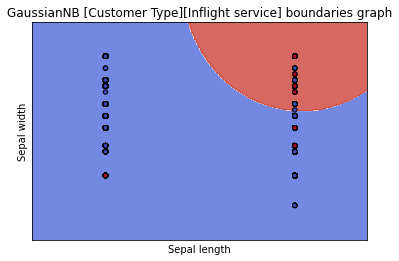

<Figure size 1440x720 with 0 Axes>

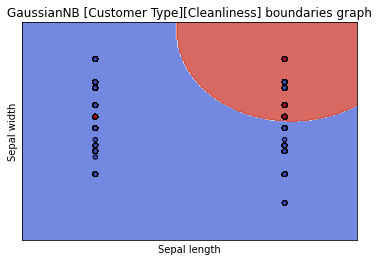

<Figure size 1440x720 with 0 Axes>

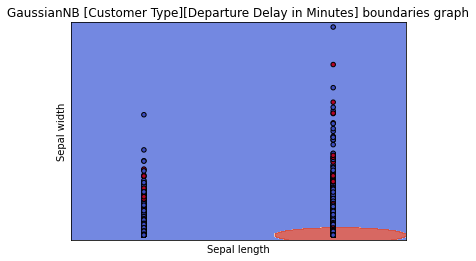

<Figure size 1440x720 with 0 Axes>

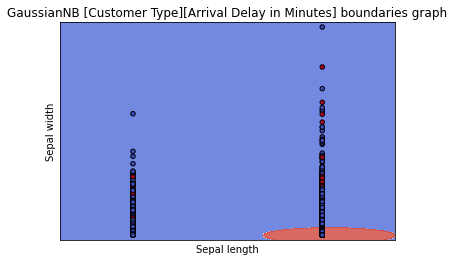

<Figure size 1440x720 with 0 Axes>

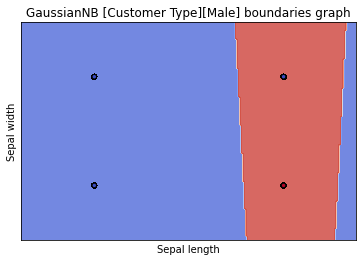

<Figure size 1440x720 with 0 Axes>

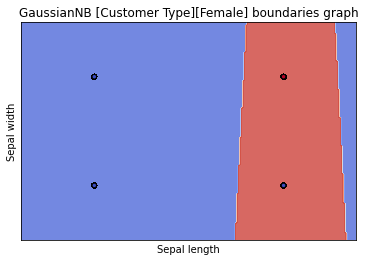

<Figure size 1440x720 with 0 Axes>

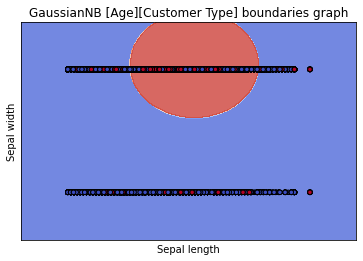

<Figure size 1440x720 with 0 Axes>

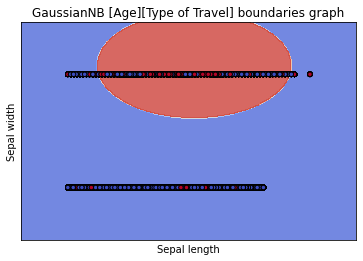

<Figure size 1440x720 with 0 Axes>

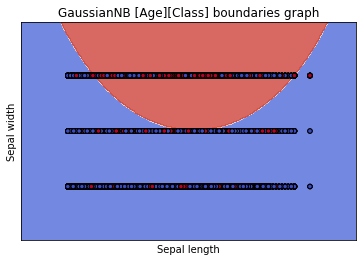

<Figure size 1440x720 with 0 Axes>

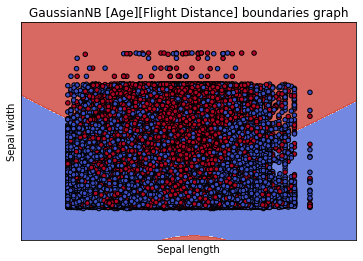

<Figure size 1440x720 with 0 Axes>

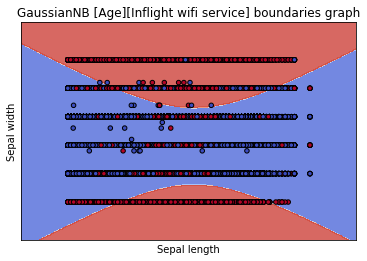

<Figure size 1440x720 with 0 Axes>

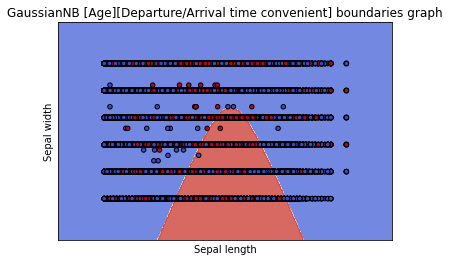

<Figure size 1440x720 with 0 Axes>

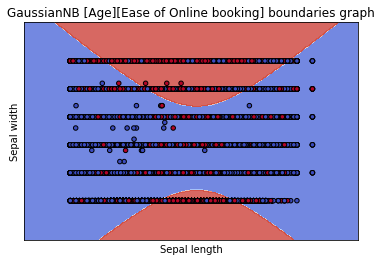

<Figure size 1440x720 with 0 Axes>

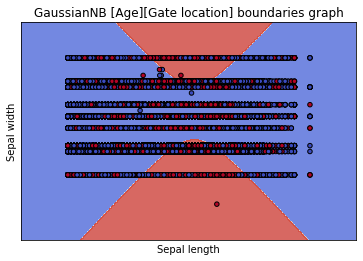

<Figure size 1440x720 with 0 Axes>

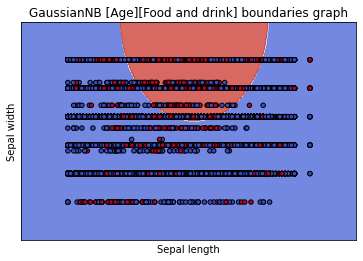

<Figure size 1440x720 with 0 Axes>

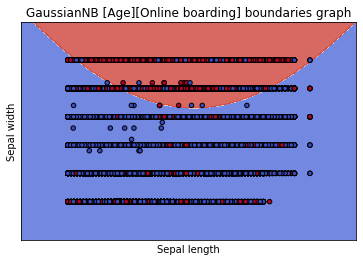

<Figure size 1440x720 with 0 Axes>

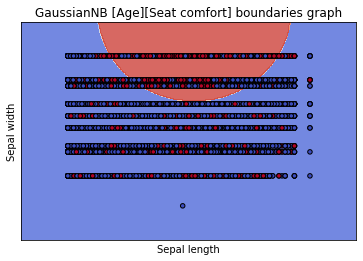

<Figure size 1440x720 with 0 Axes>

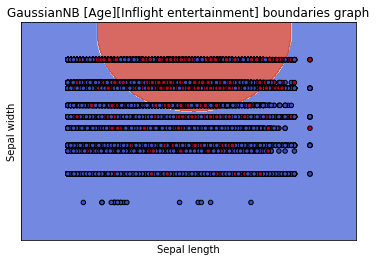

<Figure size 1440x720 with 0 Axes>

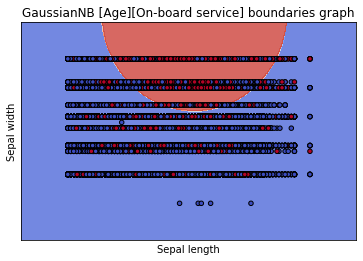

<Figure size 1440x720 with 0 Axes>

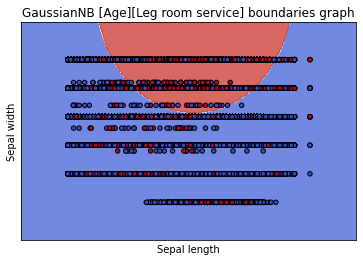

<Figure size 1440x720 with 0 Axes>

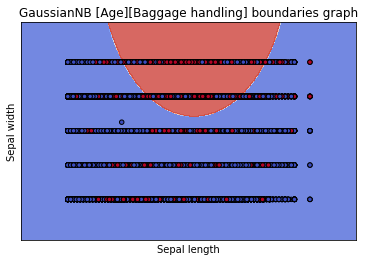

<Figure size 1440x720 with 0 Axes>

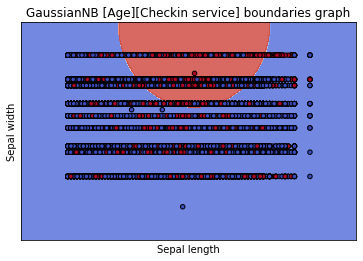

<Figure size 1440x720 with 0 Axes>

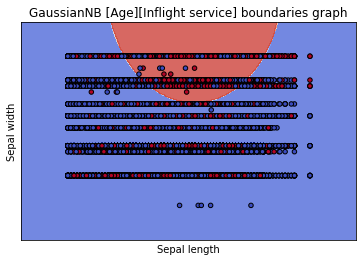

<Figure size 1440x720 with 0 Axes>

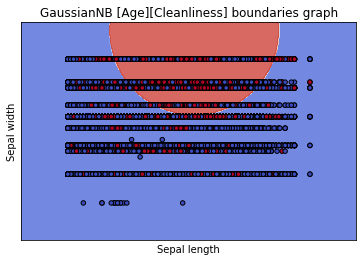

<Figure size 1440x720 with 0 Axes>

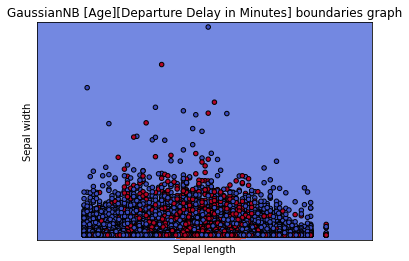

<Figure size 1440x720 with 0 Axes>

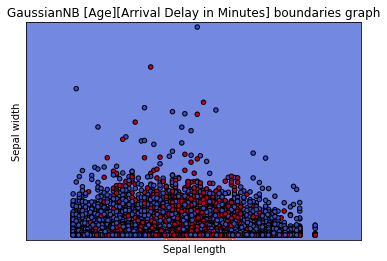

<Figure size 1440x720 with 0 Axes>

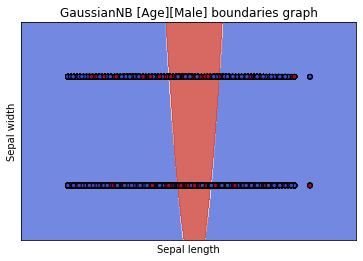

<Figure size 1440x720 with 0 Axes>

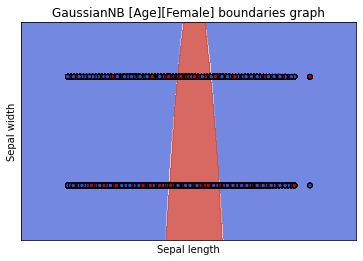

<Figure size 1440x720 with 0 Axes>

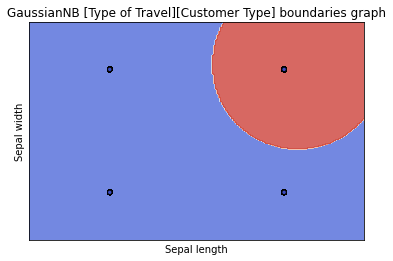

<Figure size 1440x720 with 0 Axes>

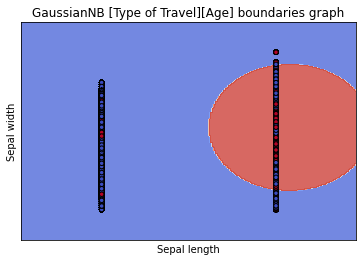

<Figure size 1440x720 with 0 Axes>

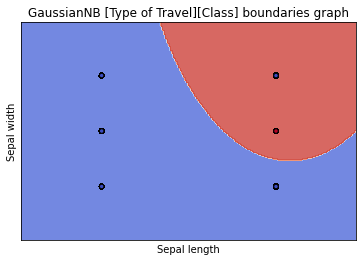

<Figure size 1440x720 with 0 Axes>

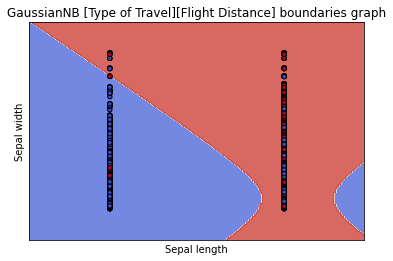

<Figure size 1440x720 with 0 Axes>

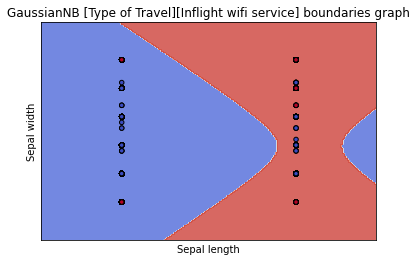

<Figure size 1440x720 with 0 Axes>

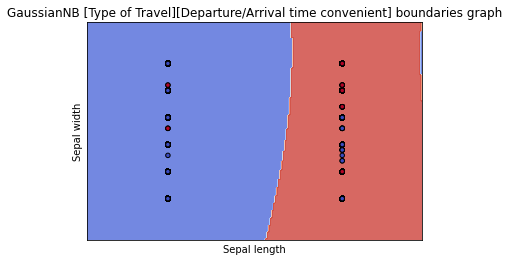

<Figure size 1440x720 with 0 Axes>

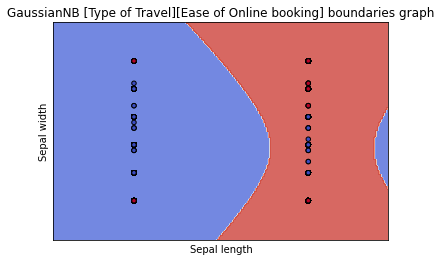

<Figure size 1440x720 with 0 Axes>

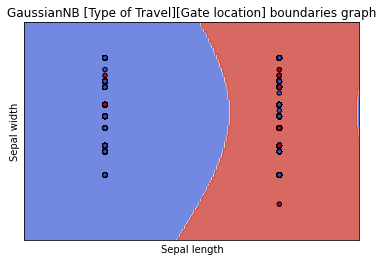

<Figure size 1440x720 with 0 Axes>

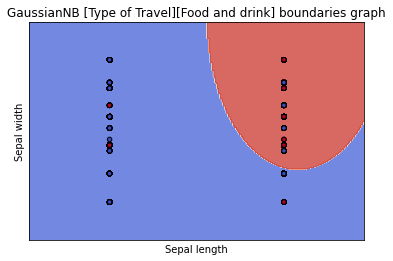

<Figure size 1440x720 with 0 Axes>

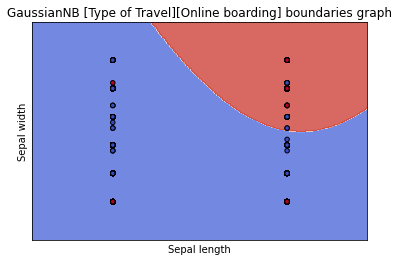

<Figure size 1440x720 with 0 Axes>

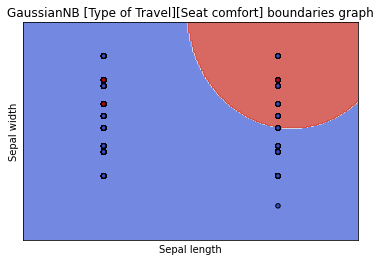

<Figure size 1440x720 with 0 Axes>

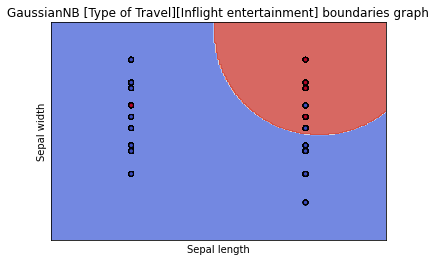

<Figure size 1440x720 with 0 Axes>

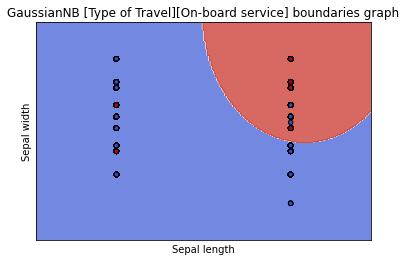

<Figure size 1440x720 with 0 Axes>

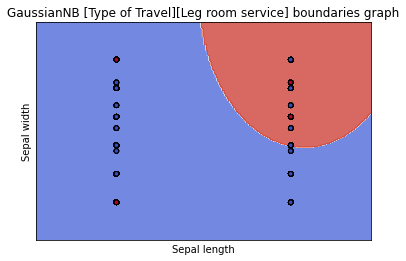

<Figure size 1440x720 with 0 Axes>

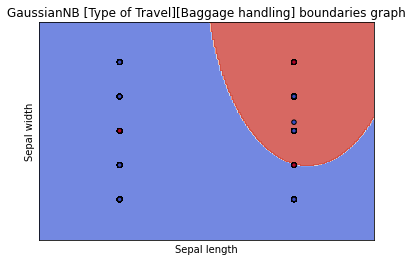

<Figure size 1440x720 with 0 Axes>

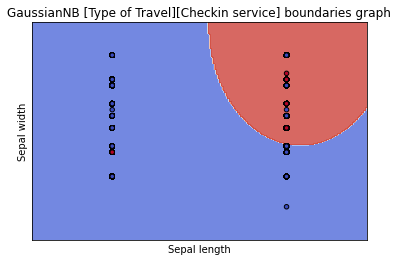

<Figure size 1440x720 with 0 Axes>

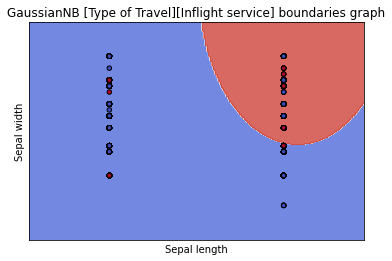

<Figure size 1440x720 with 0 Axes>

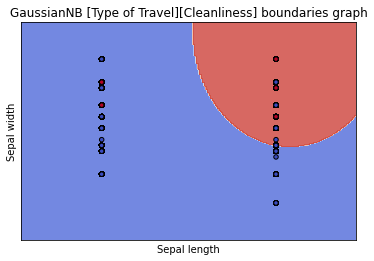

<Figure size 1440x720 with 0 Axes>

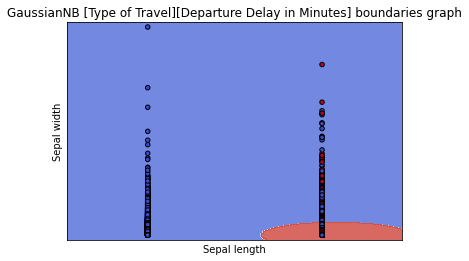

<Figure size 1440x720 with 0 Axes>

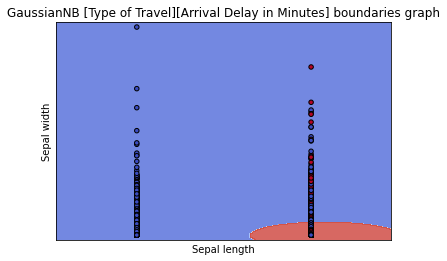

<Figure size 1440x720 with 0 Axes>

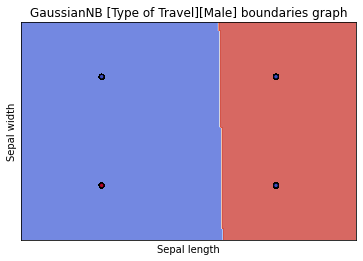

<Figure size 1440x720 with 0 Axes>

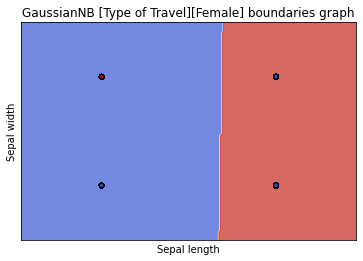

<Figure size 1440x720 with 0 Axes>

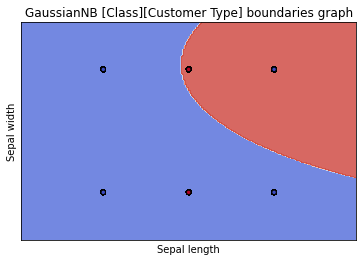

<Figure size 1440x720 with 0 Axes>

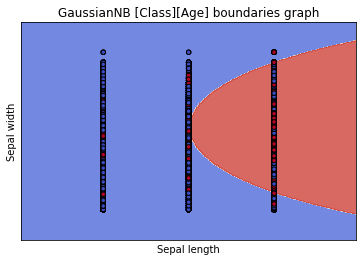

<Figure size 1440x720 with 0 Axes>

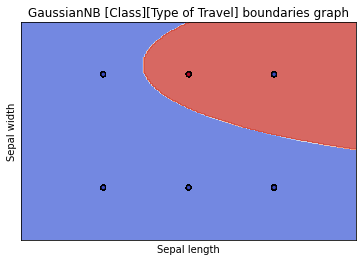

<Figure size 1440x720 with 0 Axes>

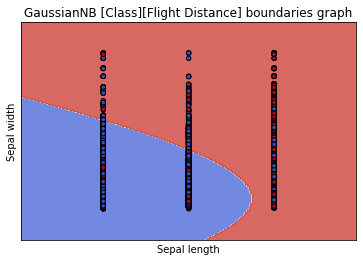

<Figure size 1440x720 with 0 Axes>

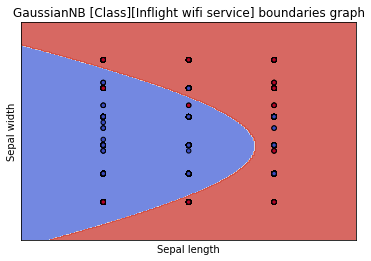

<Figure size 1440x720 with 0 Axes>

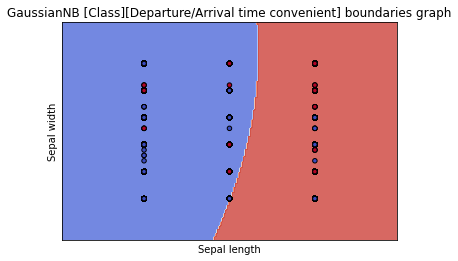

<Figure size 1440x720 with 0 Axes>

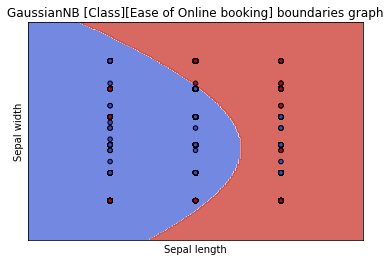

<Figure size 1440x720 with 0 Axes>

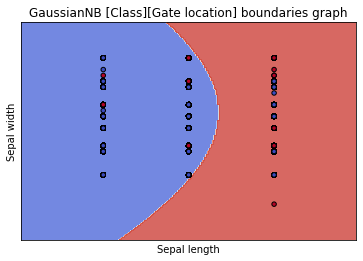

<Figure size 1440x720 with 0 Axes>

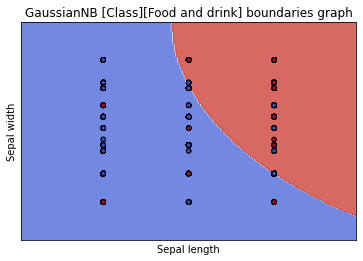

<Figure size 1440x720 with 0 Axes>

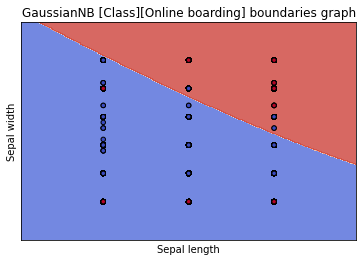

<Figure size 1440x720 with 0 Axes>

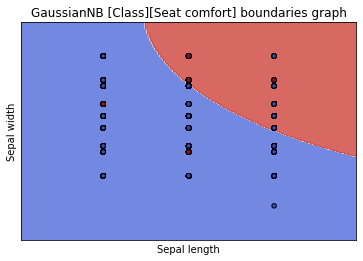

<Figure size 1440x720 with 0 Axes>

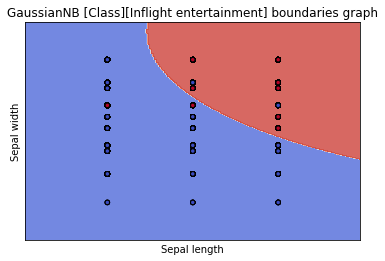

<Figure size 1440x720 with 0 Axes>

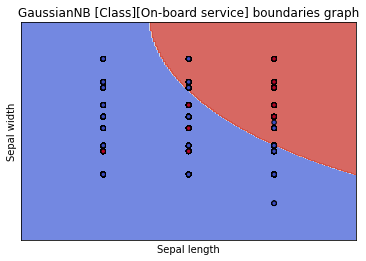

<Figure size 1440x720 with 0 Axes>

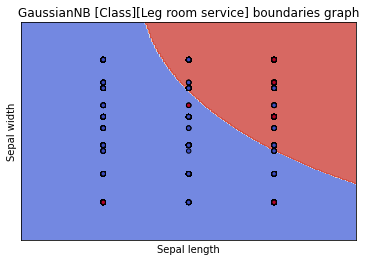

<Figure size 1440x720 with 0 Axes>

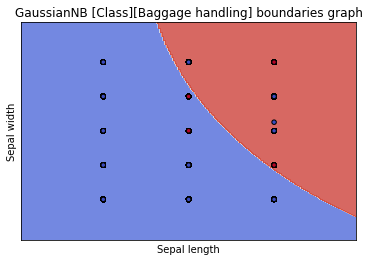

<Figure size 1440x720 with 0 Axes>

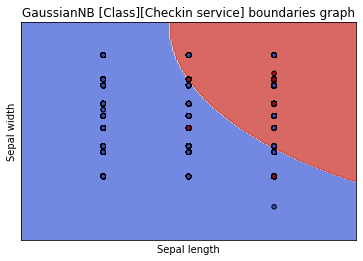

<Figure size 1440x720 with 0 Axes>

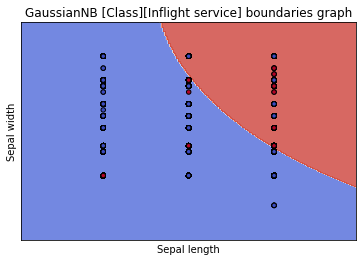

<Figure size 1440x720 with 0 Axes>

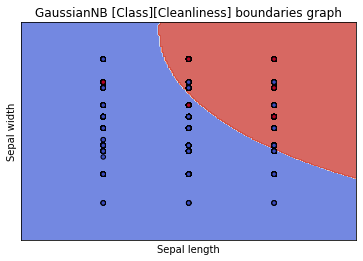

<Figure size 1440x720 with 0 Axes>

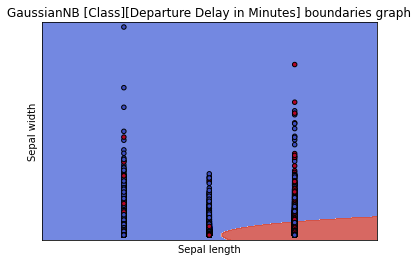

<Figure size 1440x720 with 0 Axes>

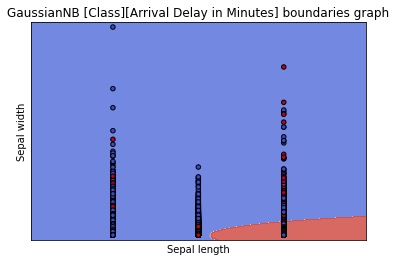

<Figure size 1440x720 with 0 Axes>

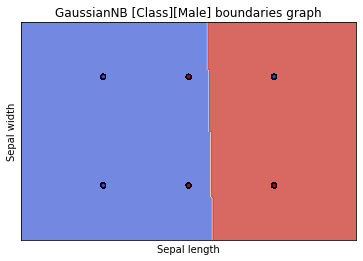

<Figure size 1440x720 with 0 Axes>

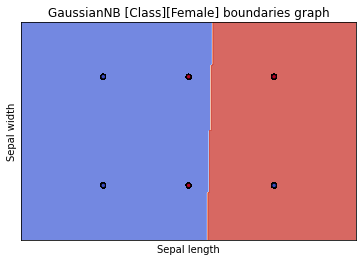

<Figure size 1440x720 with 0 Axes>

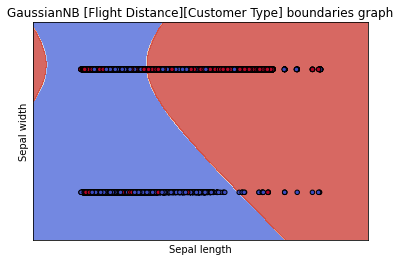

<Figure size 1440x720 with 0 Axes>

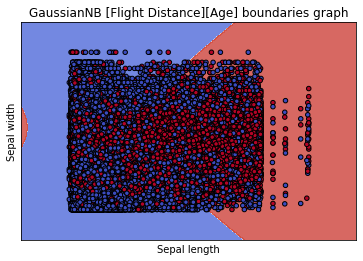

<Figure size 1440x720 with 0 Axes>

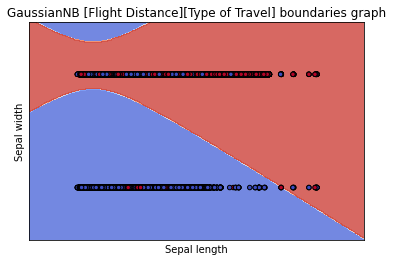

<Figure size 1440x720 with 0 Axes>

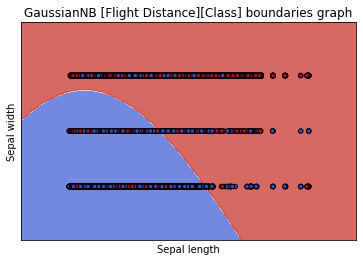

<Figure size 1440x720 with 0 Axes>

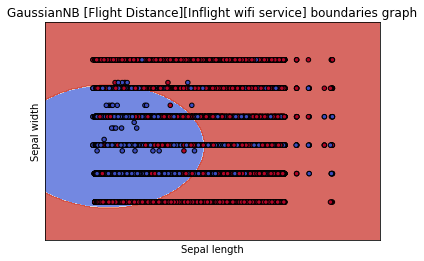

<Figure size 1440x720 with 0 Axes>

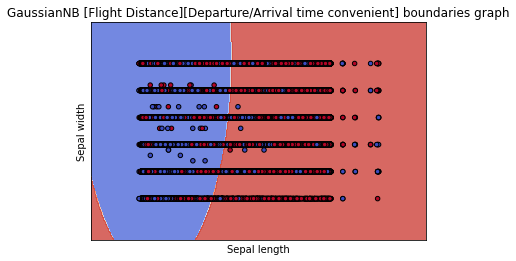

<Figure size 1440x720 with 0 Axes>

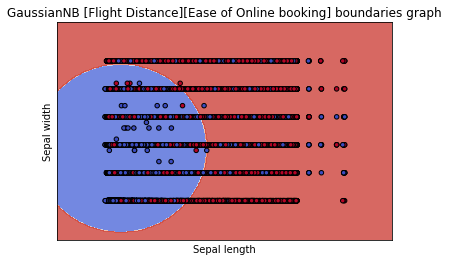

<Figure size 1440x720 with 0 Axes>

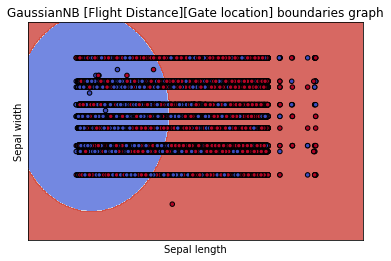

<Figure size 1440x720 with 0 Axes>

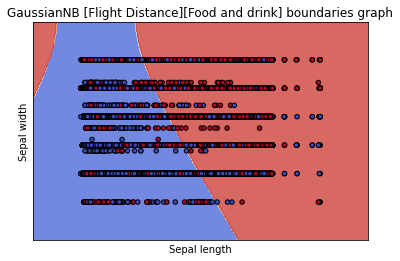

<Figure size 1440x720 with 0 Axes>

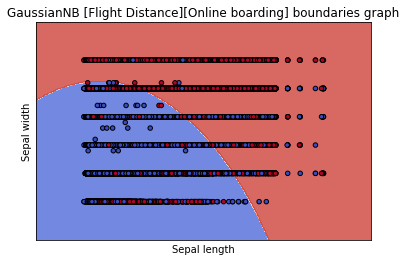

<Figure size 1440x720 with 0 Axes>

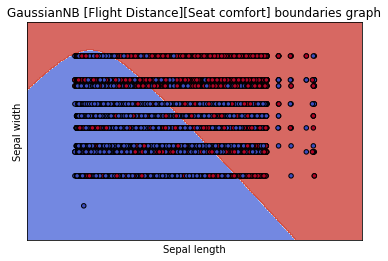

<Figure size 1440x720 with 0 Axes>

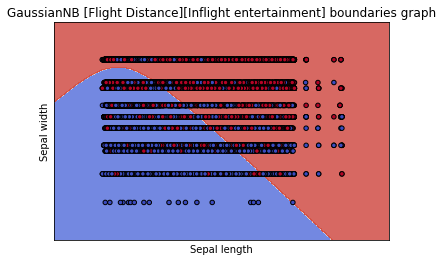

<Figure size 1440x720 with 0 Axes>

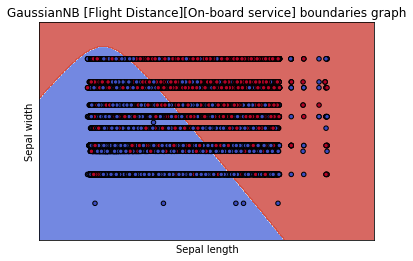

<Figure size 1440x720 with 0 Axes>

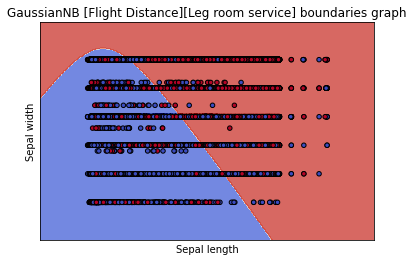

<Figure size 1440x720 with 0 Axes>

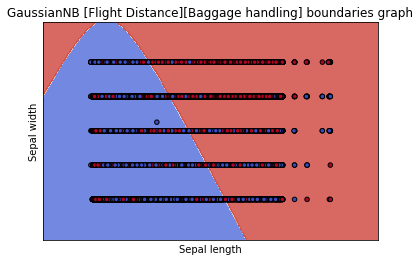

<Figure size 1440x720 with 0 Axes>

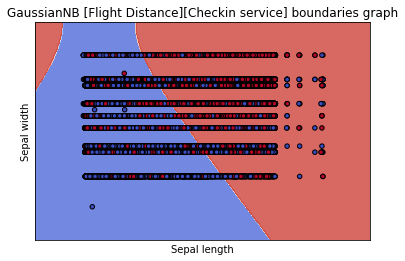

<Figure size 1440x720 with 0 Axes>

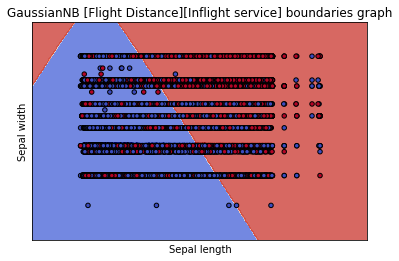

<Figure size 1440x720 with 0 Axes>

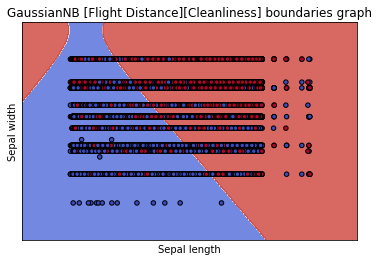

<Figure size 1440x720 with 0 Axes>

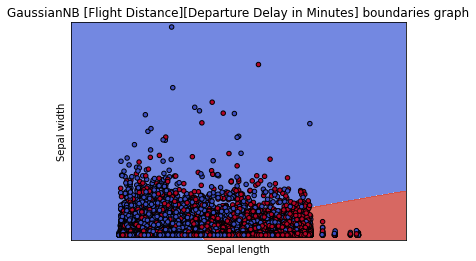

<Figure size 1440x720 with 0 Axes>

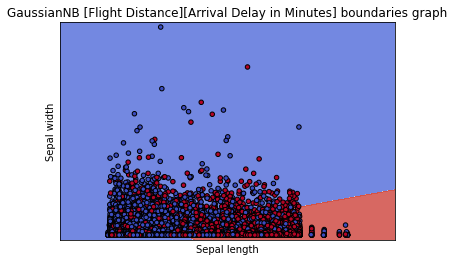

<Figure size 1440x720 with 0 Axes>

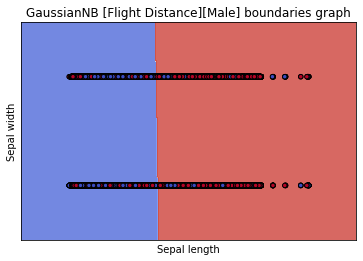

<Figure size 1440x720 with 0 Axes>

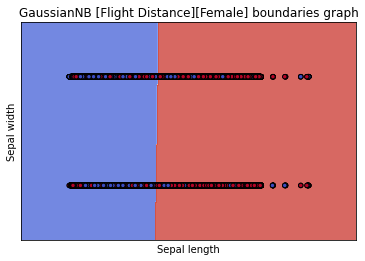

<Figure size 1440x720 with 0 Axes>

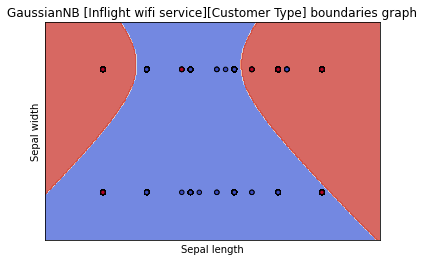

<Figure size 1440x720 with 0 Axes>

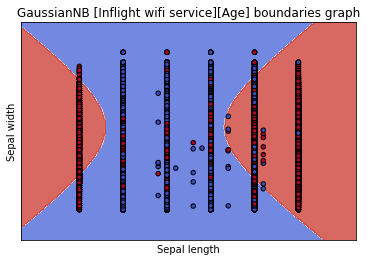

<Figure size 1440x720 with 0 Axes>

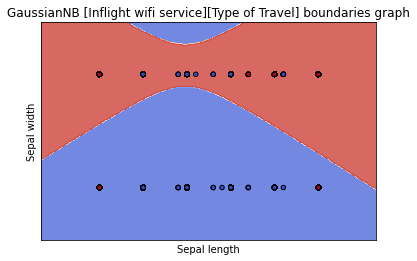

<Figure size 1440x720 with 0 Axes>

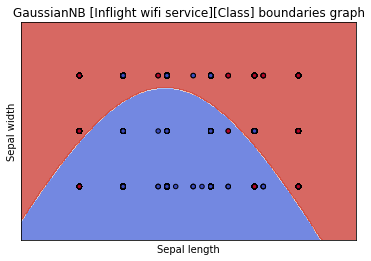

<Figure size 1440x720 with 0 Axes>

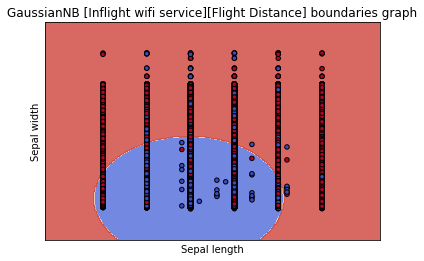

<Figure size 1440x720 with 0 Axes>

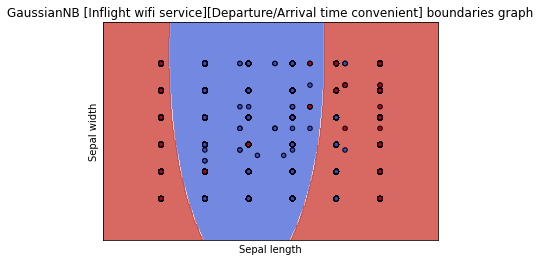

<Figure size 1440x720 with 0 Axes>

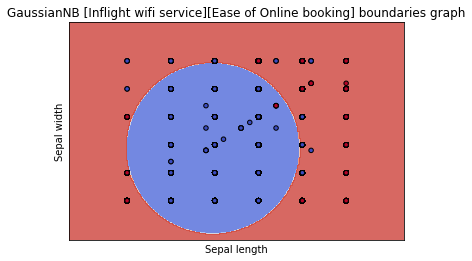

<Figure size 1440x720 with 0 Axes>

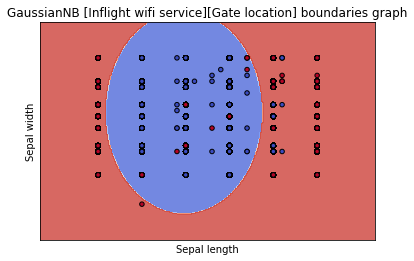

<Figure size 1440x720 with 0 Axes>

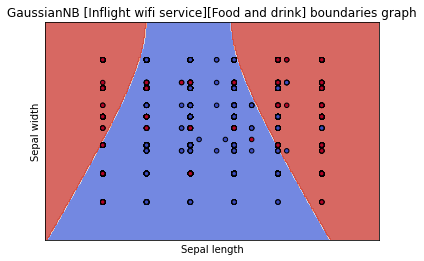

<Figure size 1440x720 with 0 Axes>

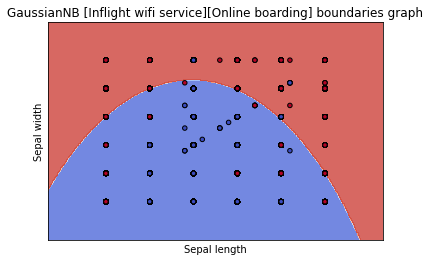

<Figure size 1440x720 with 0 Axes>

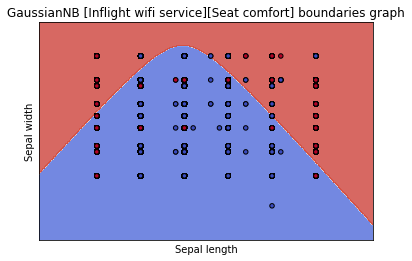

<Figure size 1440x720 with 0 Axes>

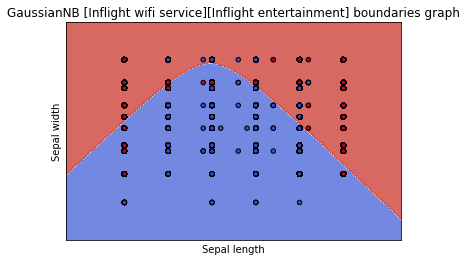

<Figure size 1440x720 with 0 Axes>

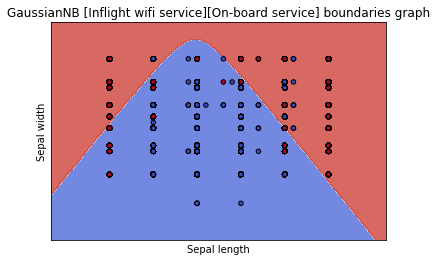

<Figure size 1440x720 with 0 Axes>

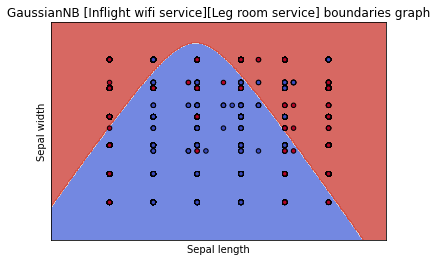

<Figure size 1440x720 with 0 Axes>

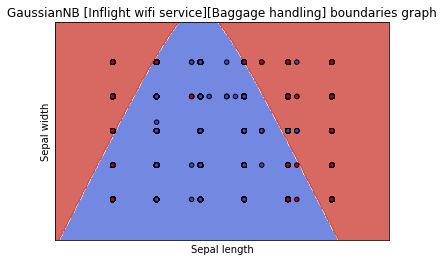

<Figure size 1440x720 with 0 Axes>

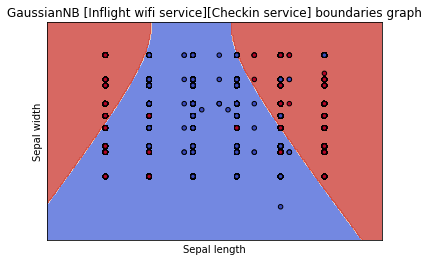

<Figure size 1440x720 with 0 Axes>

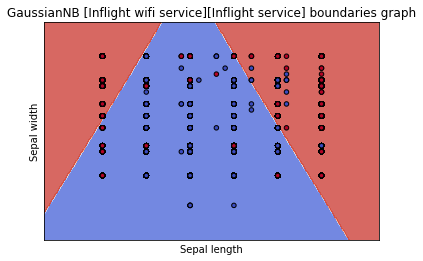

<Figure size 1440x720 with 0 Axes>

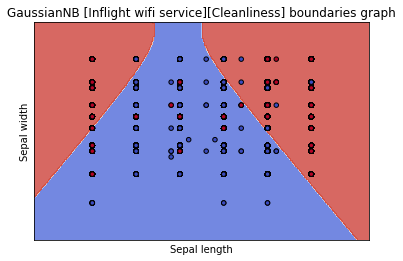

<Figure size 1440x720 with 0 Axes>

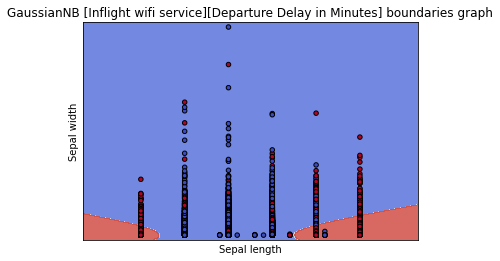

<Figure size 1440x720 with 0 Axes>

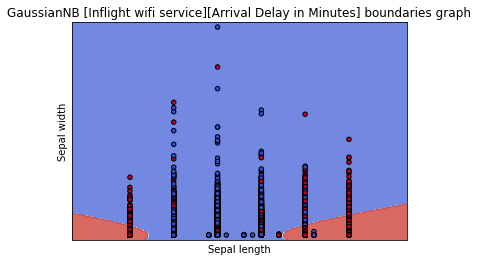

<Figure size 1440x720 with 0 Axes>

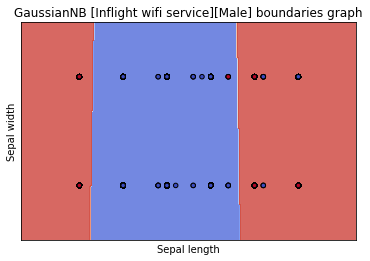

<Figure size 1440x720 with 0 Axes>

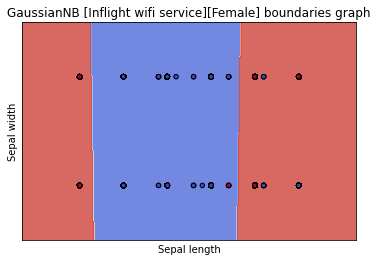

<Figure size 1440x720 with 0 Axes>

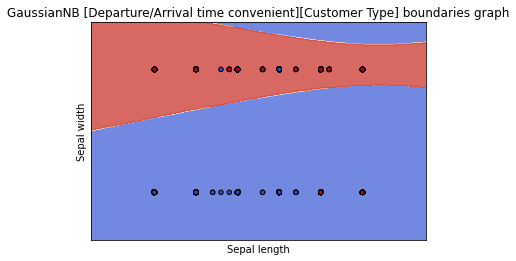

<Figure size 1440x720 with 0 Axes>

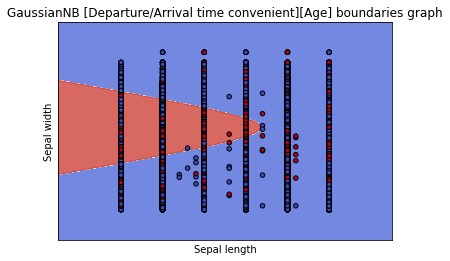

<Figure size 1440x720 with 0 Axes>

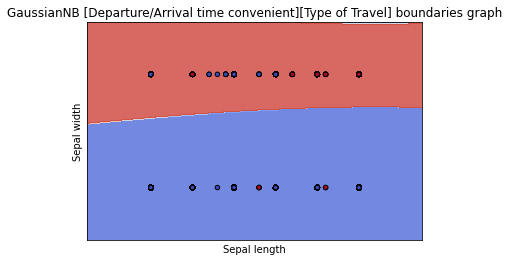

<Figure size 1440x720 with 0 Axes>

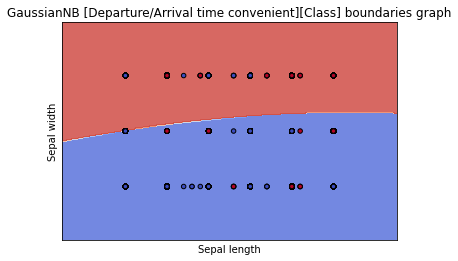

<Figure size 1440x720 with 0 Axes>

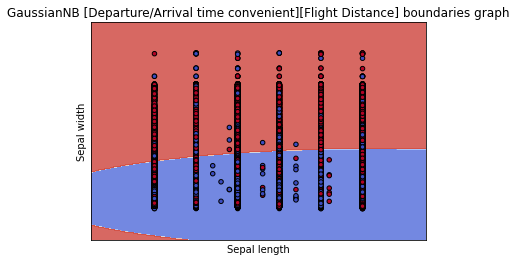

<Figure size 1440x720 with 0 Axes>

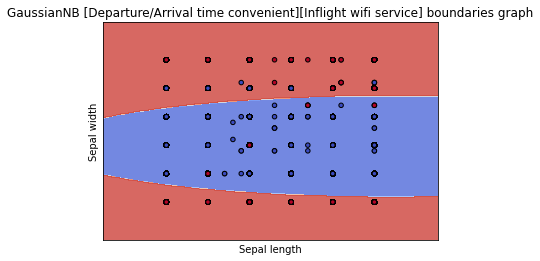

<Figure size 1440x720 with 0 Axes>

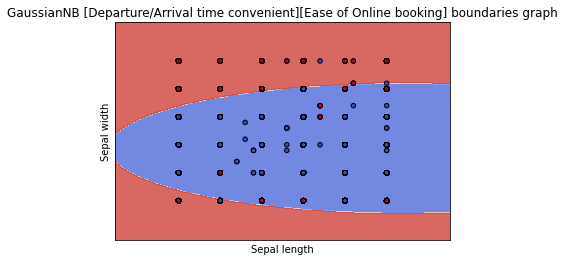

<Figure size 1440x720 with 0 Axes>

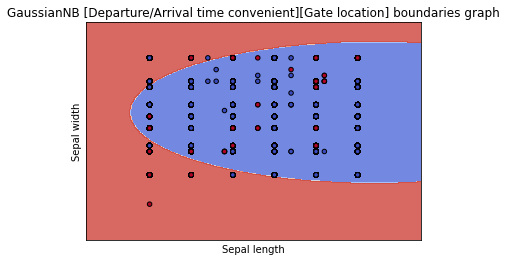

<Figure size 1440x720 with 0 Axes>

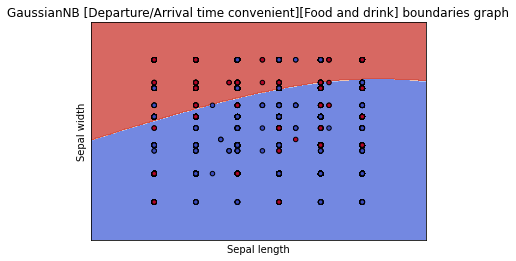

<Figure size 1440x720 with 0 Axes>

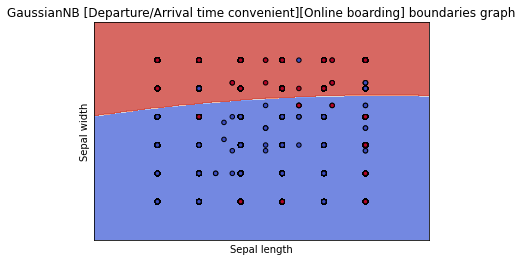

<Figure size 1440x720 with 0 Axes>

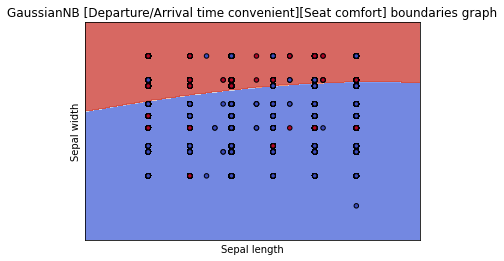

<Figure size 1440x720 with 0 Axes>

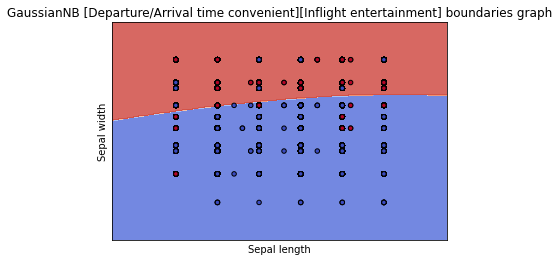

<Figure size 1440x720 with 0 Axes>

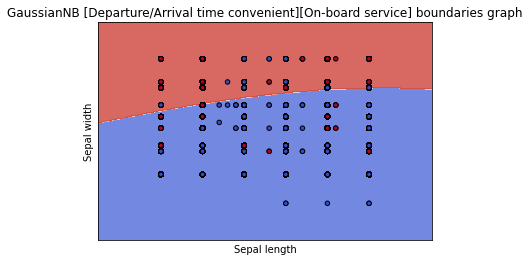

<Figure size 1440x720 with 0 Axes>

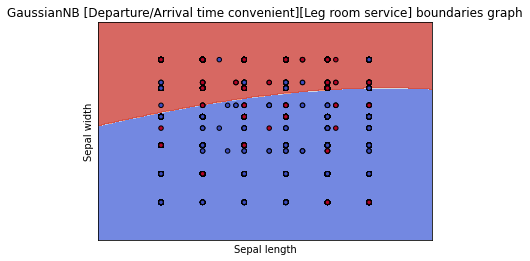

<Figure size 1440x720 with 0 Axes>

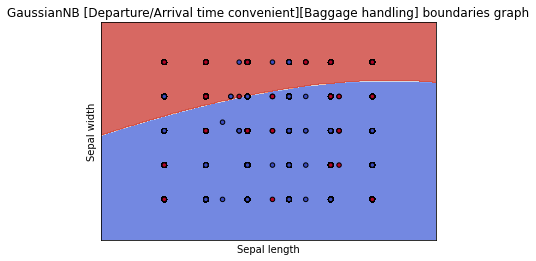

<Figure size 1440x720 with 0 Axes>

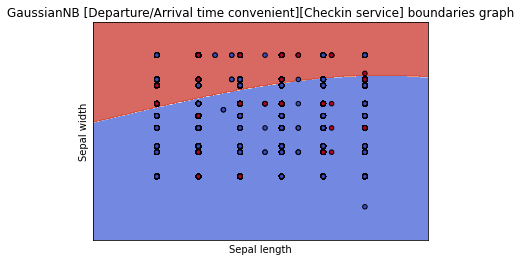

<Figure size 1440x720 with 0 Axes>

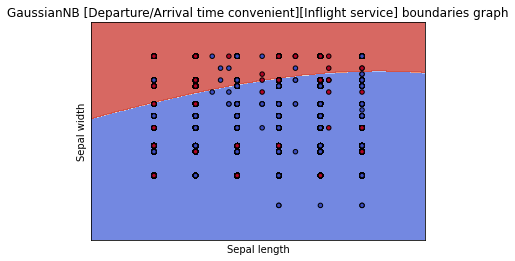

<Figure size 1440x720 with 0 Axes>

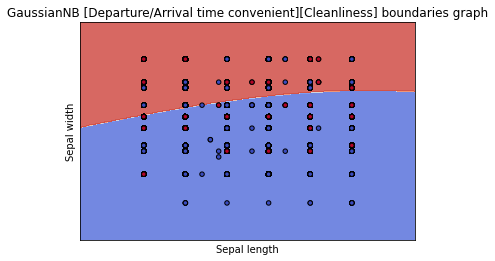

<Figure size 1440x720 with 0 Axes>

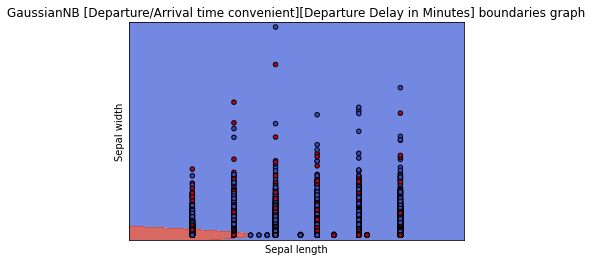

<Figure size 1440x720 with 0 Axes>

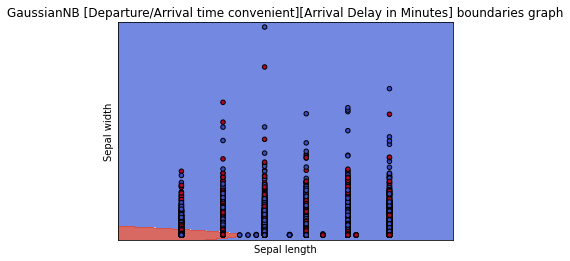

<Figure size 1440x720 with 0 Axes>

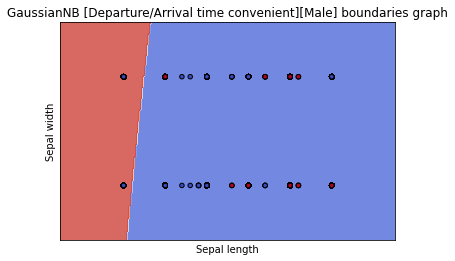

<Figure size 1440x720 with 0 Axes>

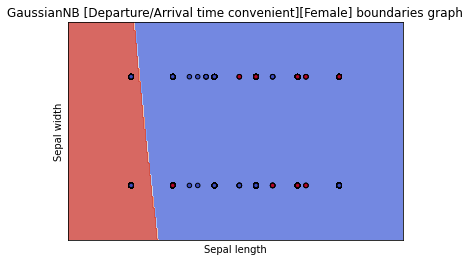

<Figure size 1440x720 with 0 Axes>

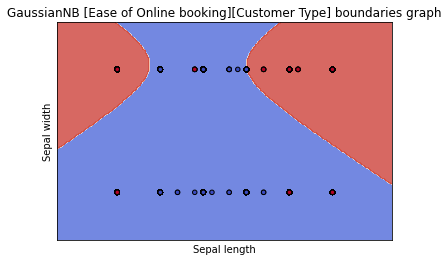

<Figure size 1440x720 with 0 Axes>

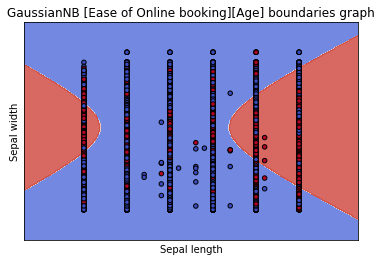

<Figure size 1440x720 with 0 Axes>

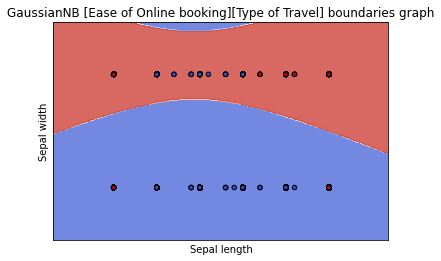

<Figure size 1440x720 with 0 Axes>

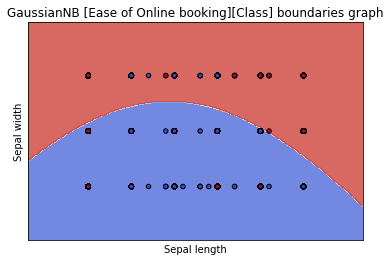

<Figure size 1440x720 with 0 Axes>

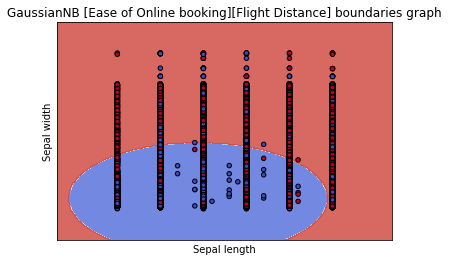

<Figure size 1440x720 with 0 Axes>

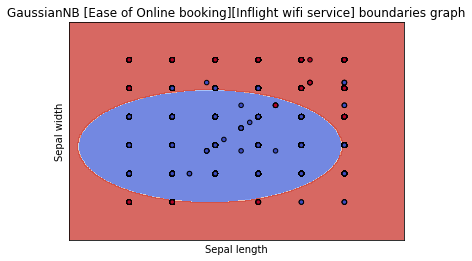

<Figure size 1440x720 with 0 Axes>

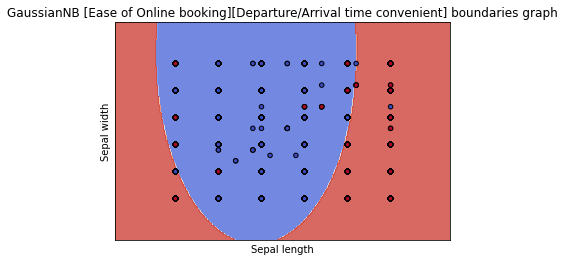

<Figure size 1440x720 with 0 Axes>

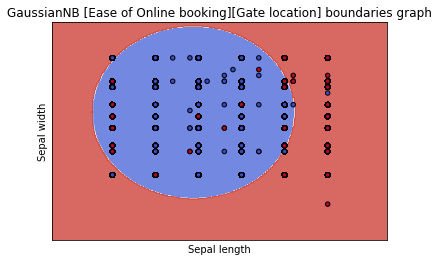

<Figure size 1440x720 with 0 Axes>

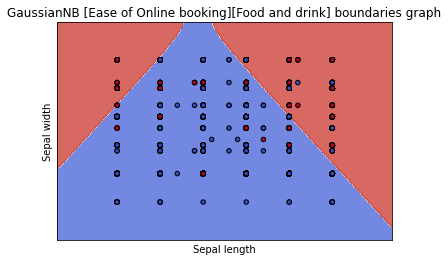

<Figure size 1440x720 with 0 Axes>

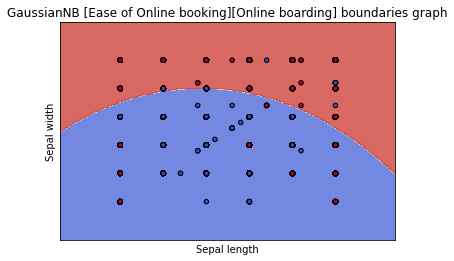

<Figure size 1440x720 with 0 Axes>

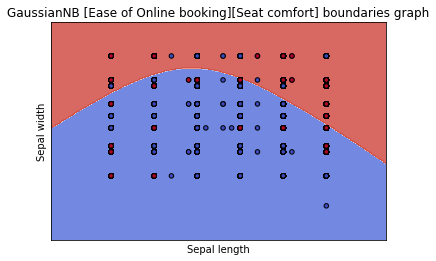

<Figure size 1440x720 with 0 Axes>

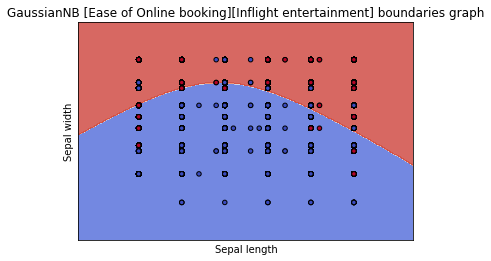

<Figure size 1440x720 with 0 Axes>

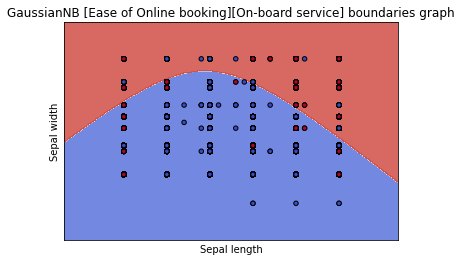

<Figure size 1440x720 with 0 Axes>

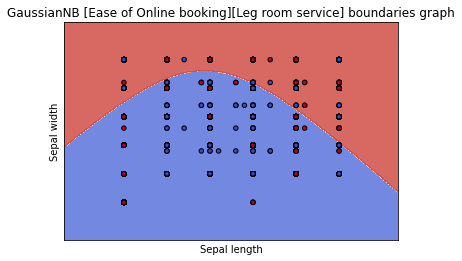

<Figure size 1440x720 with 0 Axes>

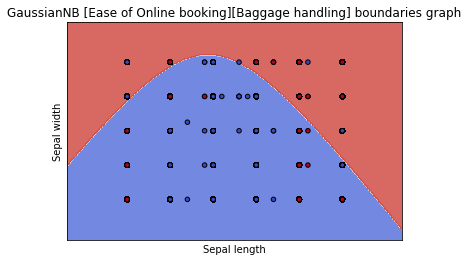

<Figure size 1440x720 with 0 Axes>

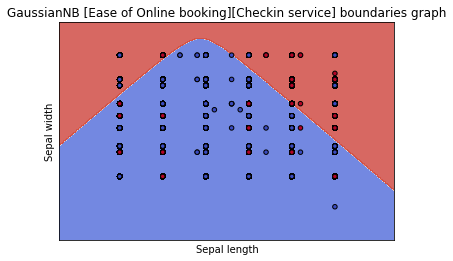

<Figure size 1440x720 with 0 Axes>

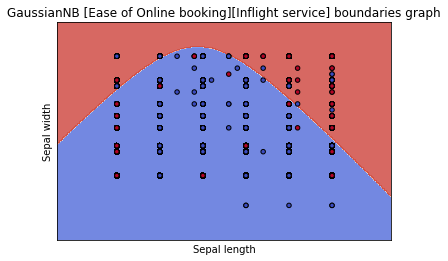

<Figure size 1440x720 with 0 Axes>

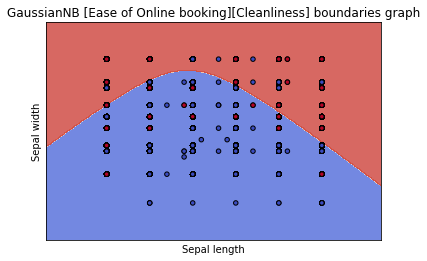

<Figure size 1440x720 with 0 Axes>

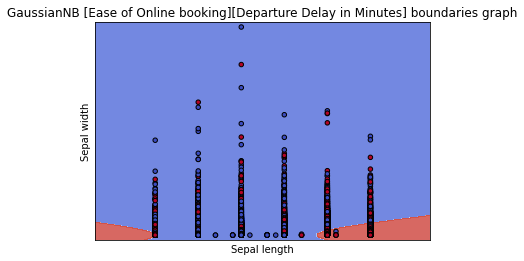

<Figure size 1440x720 with 0 Axes>

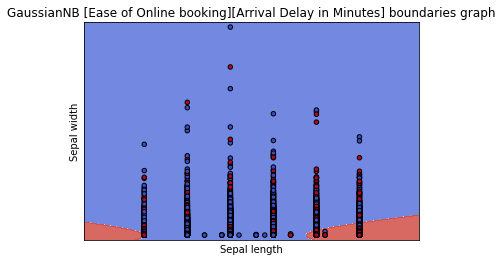

<Figure size 1440x720 with 0 Axes>

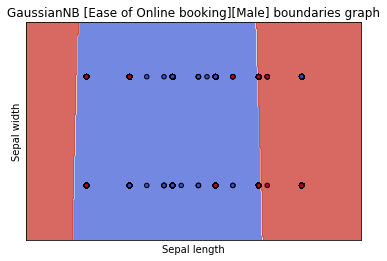

<Figure size 1440x720 with 0 Axes>

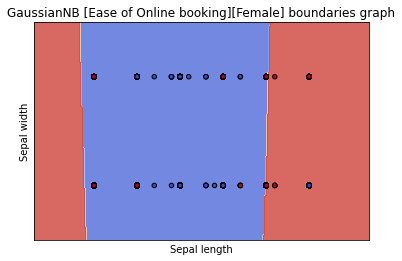

<Figure size 1440x720 with 0 Axes>

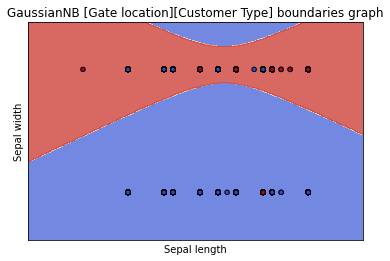

<Figure size 1440x720 with 0 Axes>

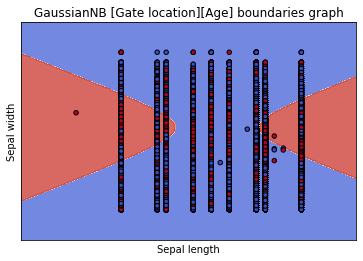

<Figure size 1440x720 with 0 Axes>

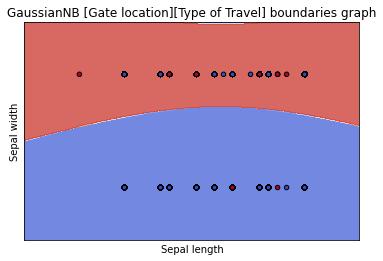

<Figure size 1440x720 with 0 Axes>

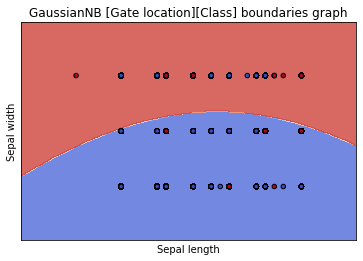

<Figure size 1440x720 with 0 Axes>

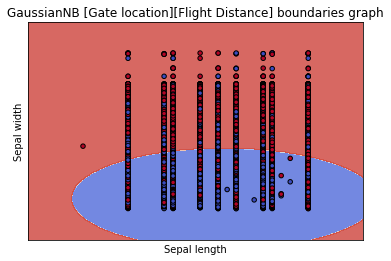

<Figure size 1440x720 with 0 Axes>

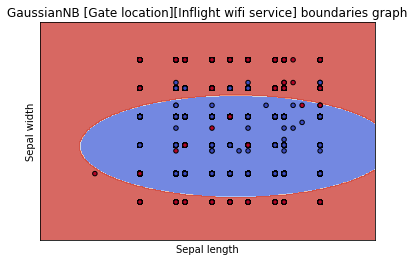

<Figure size 1440x720 with 0 Axes>

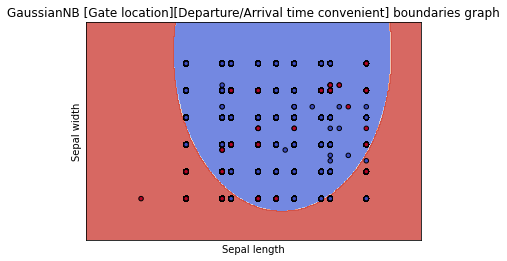

<Figure size 1440x720 with 0 Axes>

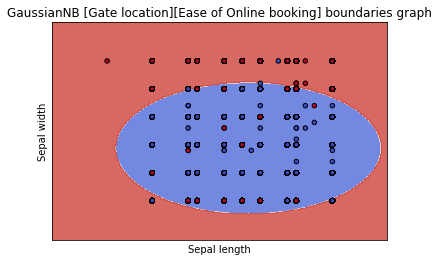

<Figure size 1440x720 with 0 Axes>

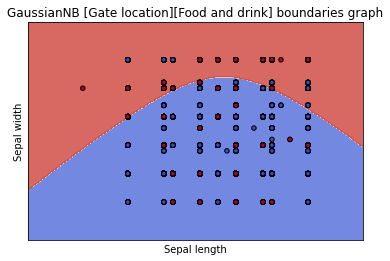

<Figure size 1440x720 with 0 Axes>

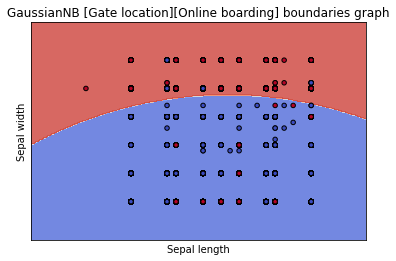

<Figure size 1440x720 with 0 Axes>

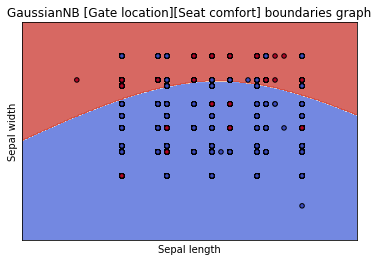

<Figure size 1440x720 with 0 Axes>

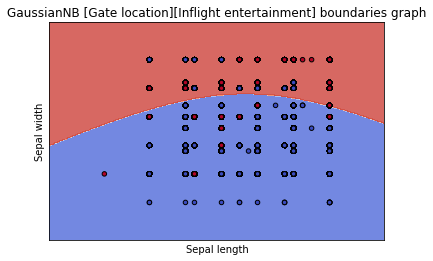

<Figure size 1440x720 with 0 Axes>

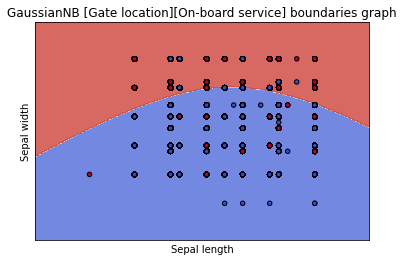

<Figure size 1440x720 with 0 Axes>

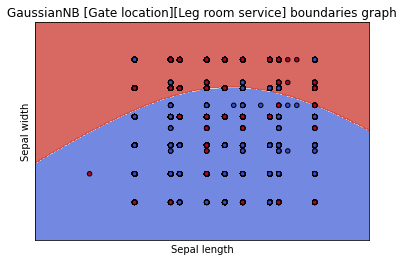

<Figure size 1440x720 with 0 Axes>

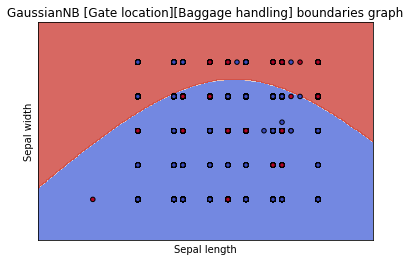

<Figure size 1440x720 with 0 Axes>

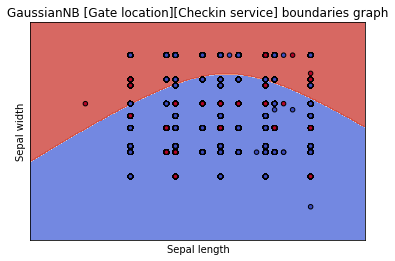

<Figure size 1440x720 with 0 Axes>

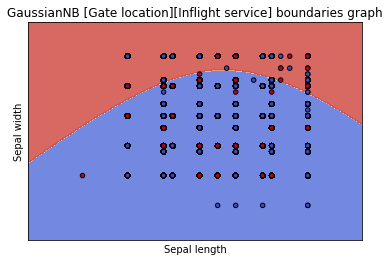

<Figure size 1440x720 with 0 Axes>

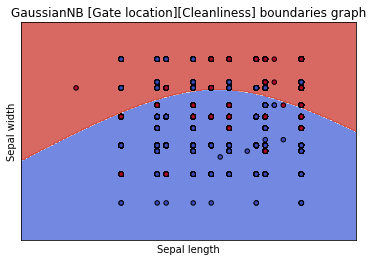

<Figure size 1440x720 with 0 Axes>

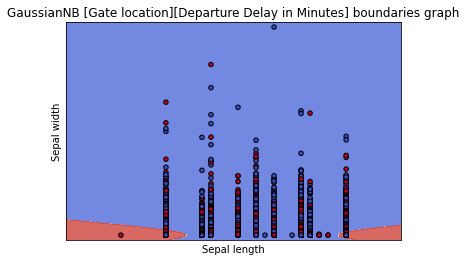

<Figure size 1440x720 with 0 Axes>

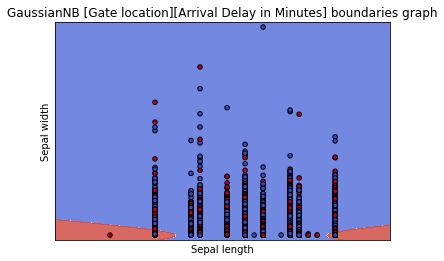

<Figure size 1440x720 with 0 Axes>

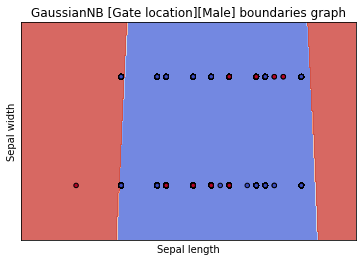

<Figure size 1440x720 with 0 Axes>

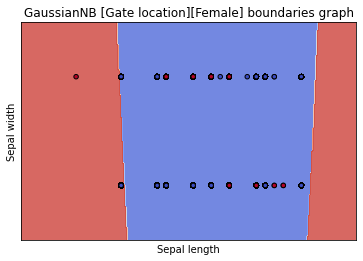

<Figure size 1440x720 with 0 Axes>

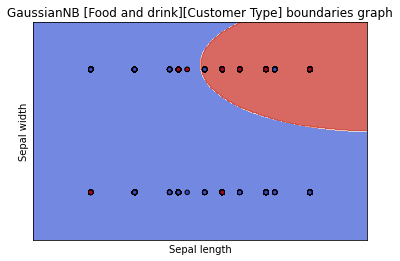

<Figure size 1440x720 with 0 Axes>

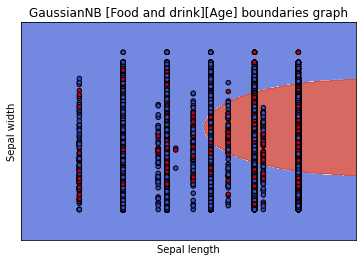

<Figure size 1440x720 with 0 Axes>

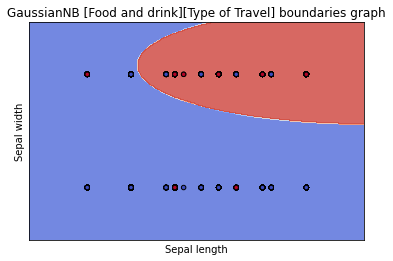

<Figure size 1440x720 with 0 Axes>

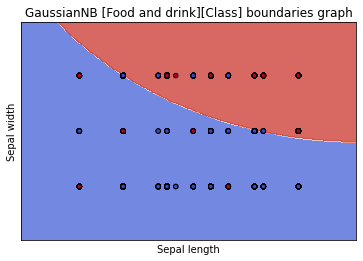

<Figure size 1440x720 with 0 Axes>

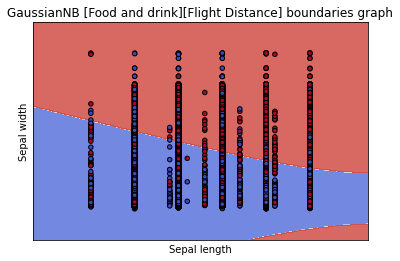

<Figure size 1440x720 with 0 Axes>

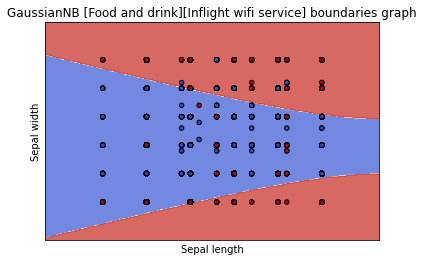

<Figure size 1440x720 with 0 Axes>

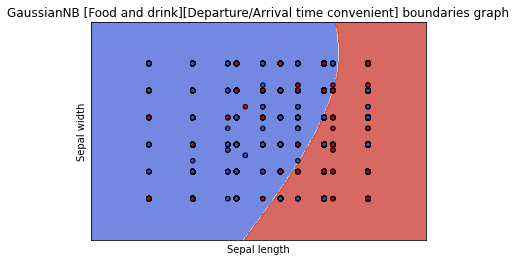

<Figure size 1440x720 with 0 Axes>

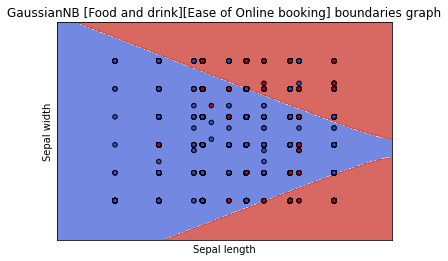

<Figure size 1440x720 with 0 Axes>

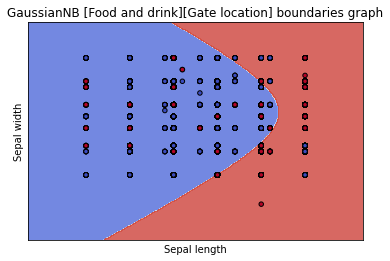

<Figure size 1440x720 with 0 Axes>

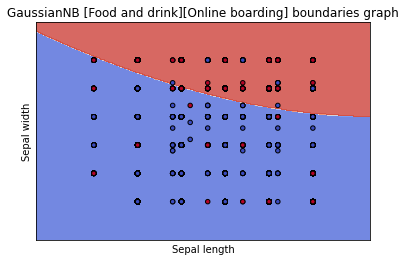

<Figure size 1440x720 with 0 Axes>

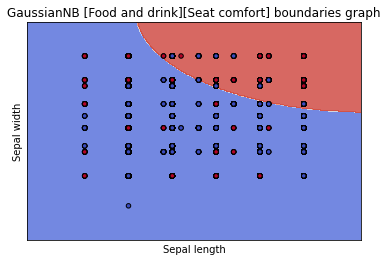

<Figure size 1440x720 with 0 Axes>

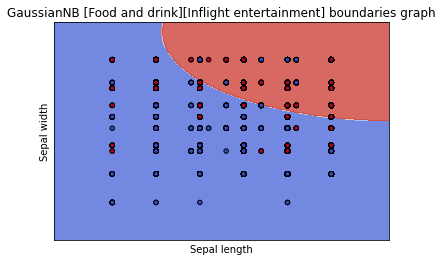

<Figure size 1440x720 with 0 Axes>

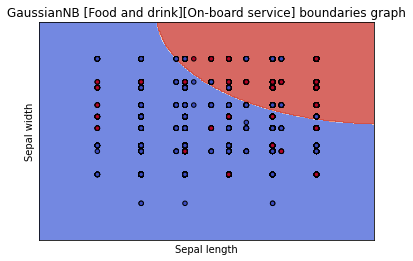

<Figure size 1440x720 with 0 Axes>

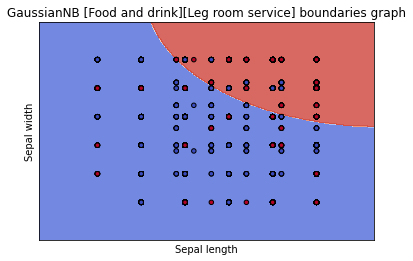

<Figure size 1440x720 with 0 Axes>

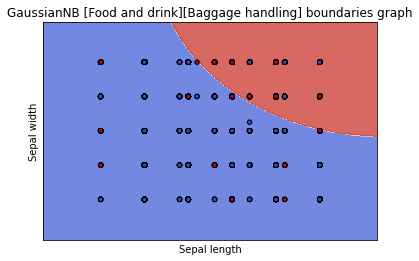

<Figure size 1440x720 with 0 Axes>

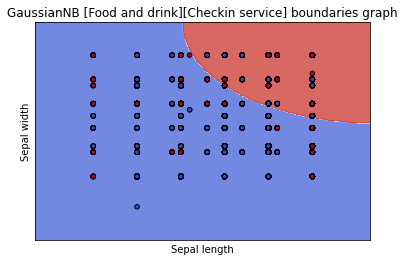

<Figure size 1440x720 with 0 Axes>

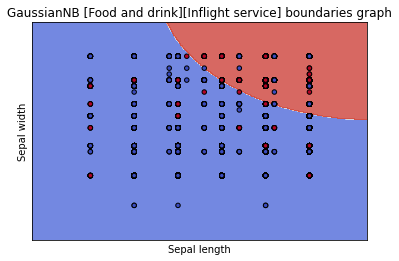

<Figure size 1440x720 with 0 Axes>

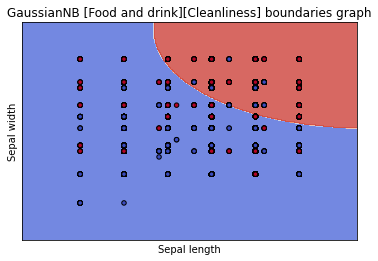

<Figure size 1440x720 with 0 Axes>

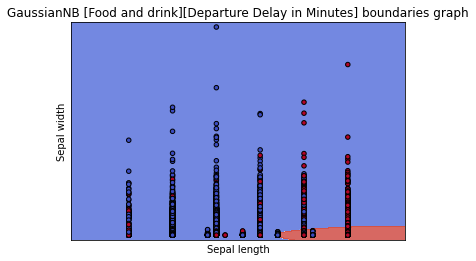

<Figure size 1440x720 with 0 Axes>

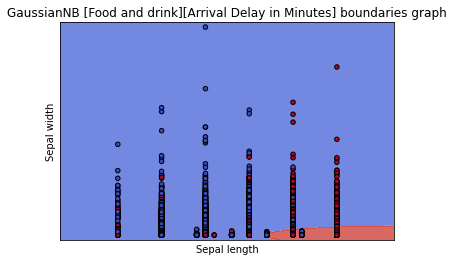

<Figure size 1440x720 with 0 Axes>

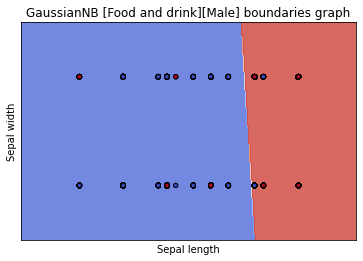

<Figure size 1440x720 with 0 Axes>

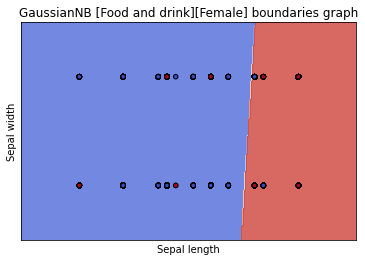

<Figure size 1440x720 with 0 Axes>

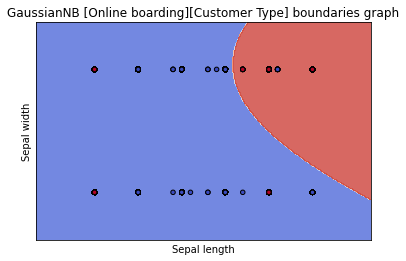

<Figure size 1440x720 with 0 Axes>

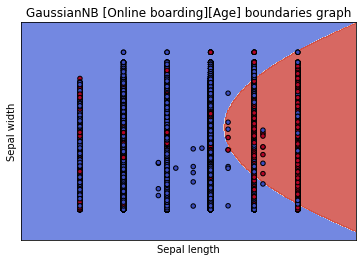

<Figure size 1440x720 with 0 Axes>

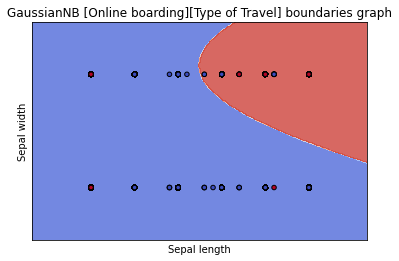

<Figure size 1440x720 with 0 Axes>

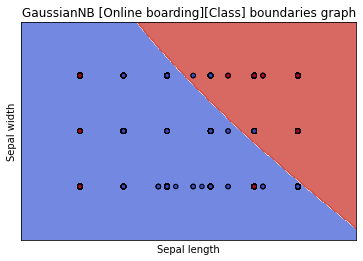

<Figure size 1440x720 with 0 Axes>

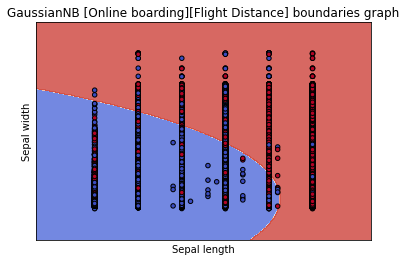

<Figure size 1440x720 with 0 Axes>

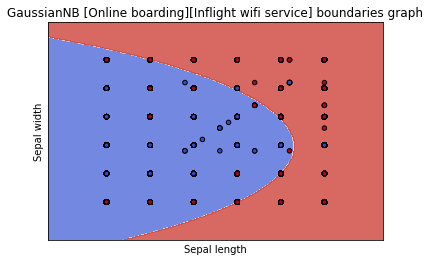

<Figure size 1440x720 with 0 Axes>

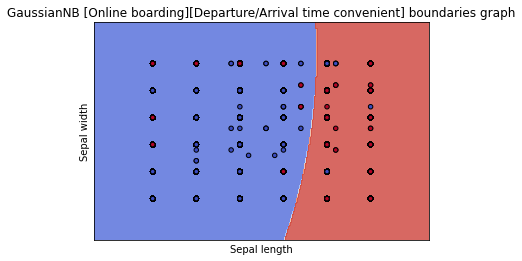

<Figure size 1440x720 with 0 Axes>

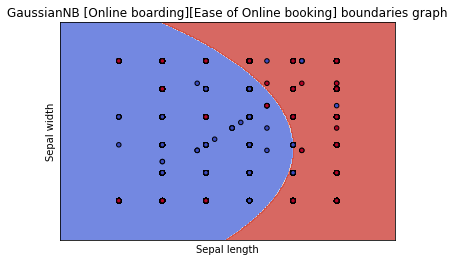

<Figure size 1440x720 with 0 Axes>

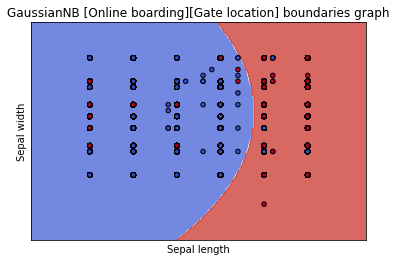

<Figure size 1440x720 with 0 Axes>

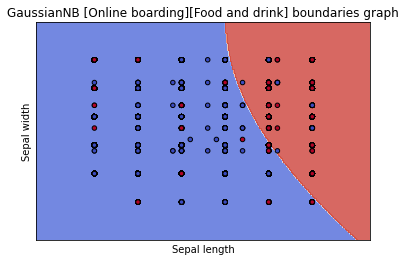

<Figure size 1440x720 with 0 Axes>

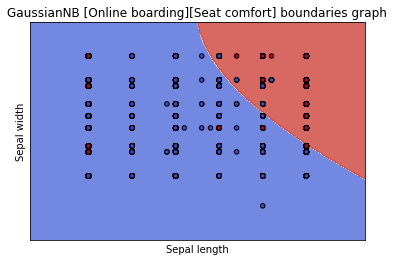

<Figure size 1440x720 with 0 Axes>

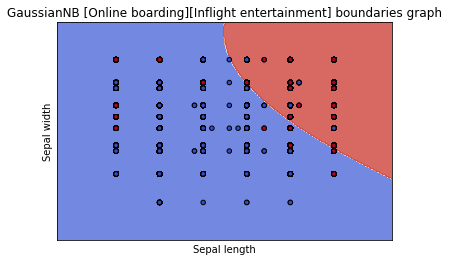

<Figure size 1440x720 with 0 Axes>

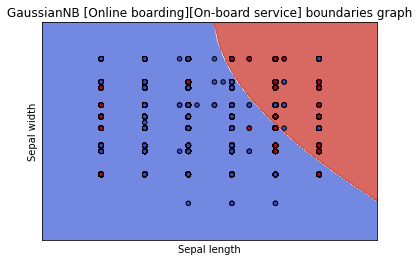

<Figure size 1440x720 with 0 Axes>

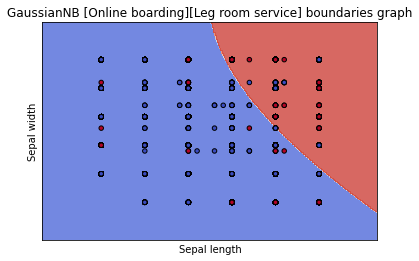

<Figure size 1440x720 with 0 Axes>

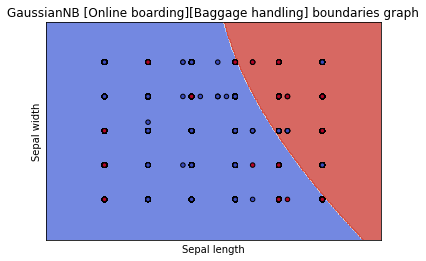

<Figure size 1440x720 with 0 Axes>

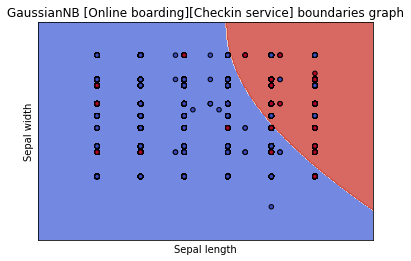

<Figure size 1440x720 with 0 Axes>

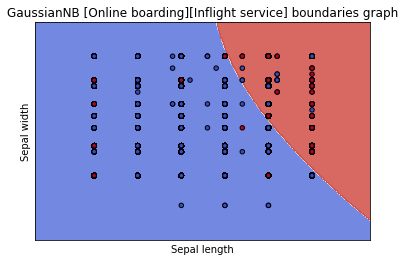

<Figure size 1440x720 with 0 Axes>

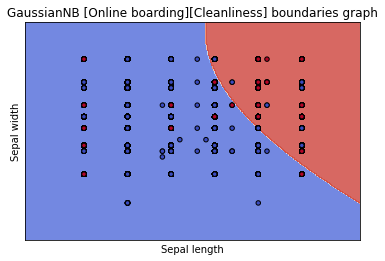

<Figure size 1440x720 with 0 Axes>

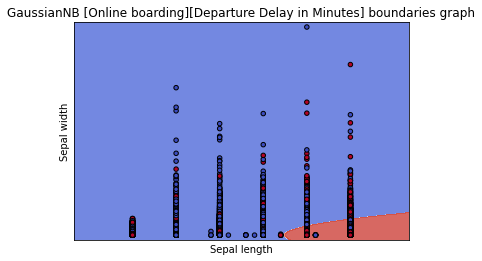

<Figure size 1440x720 with 0 Axes>

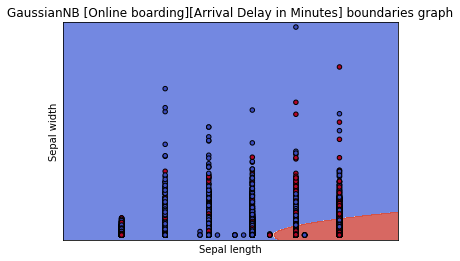

<Figure size 1440x720 with 0 Axes>

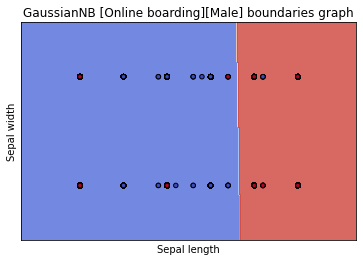

<Figure size 1440x720 with 0 Axes>

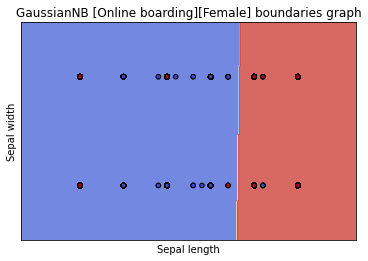

<Figure size 1440x720 with 0 Axes>

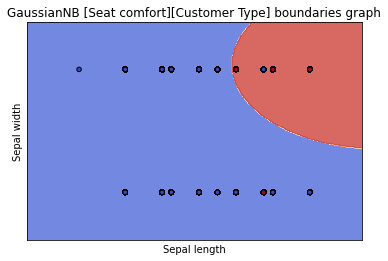

<Figure size 1440x720 with 0 Axes>

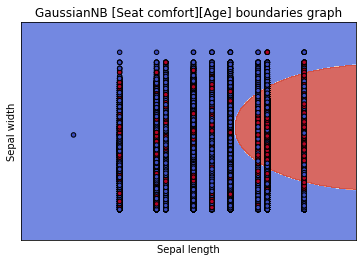

<Figure size 1440x720 with 0 Axes>

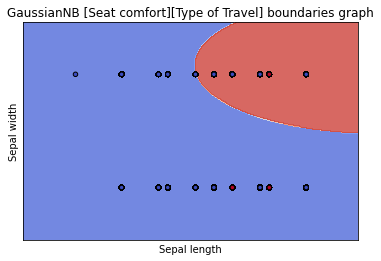

<Figure size 1440x720 with 0 Axes>

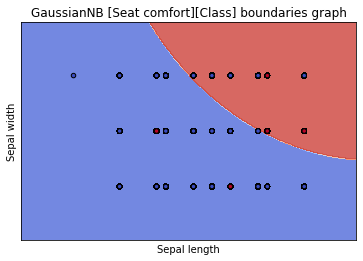

<Figure size 1440x720 with 0 Axes>

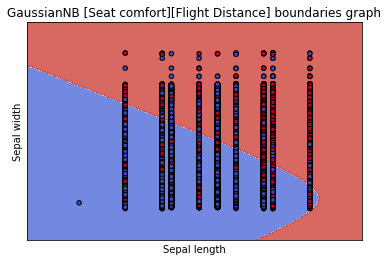

<Figure size 1440x720 with 0 Axes>

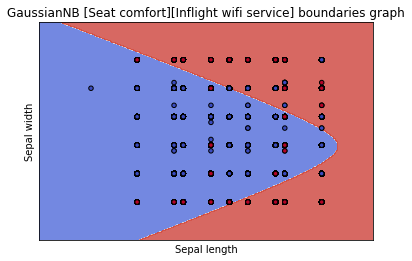

<Figure size 1440x720 with 0 Axes>

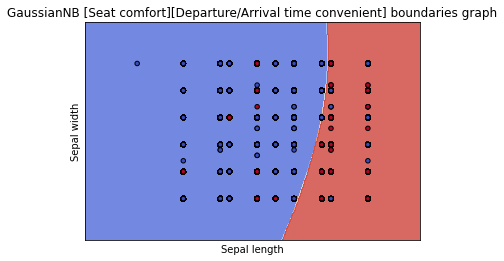

<Figure size 1440x720 with 0 Axes>

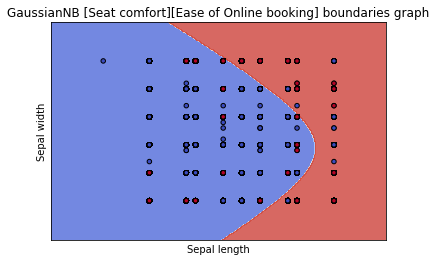

<Figure size 1440x720 with 0 Axes>

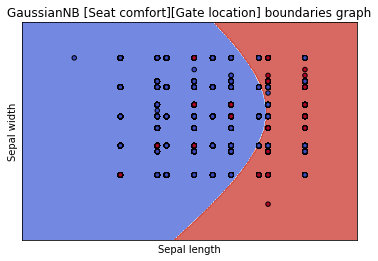

<Figure size 1440x720 with 0 Axes>

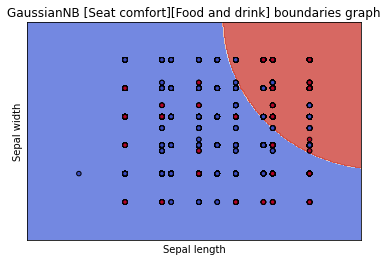

<Figure size 1440x720 with 0 Axes>

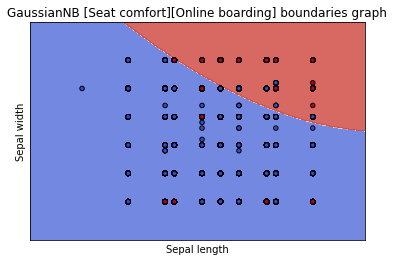

<Figure size 1440x720 with 0 Axes>

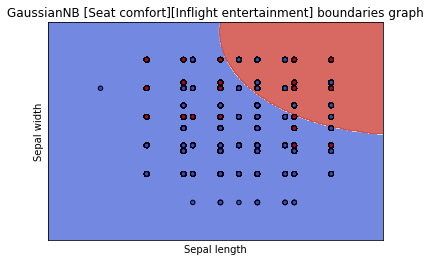

<Figure size 1440x720 with 0 Axes>

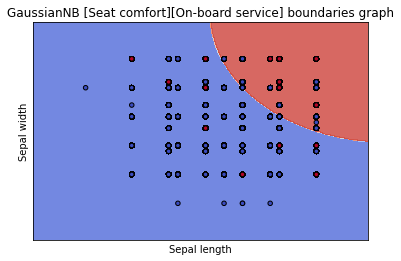

<Figure size 1440x720 with 0 Axes>

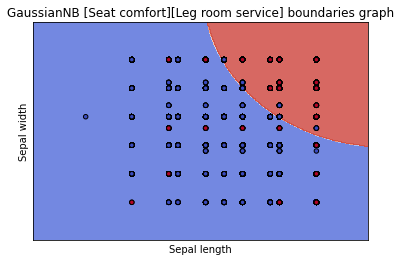

<Figure size 1440x720 with 0 Axes>

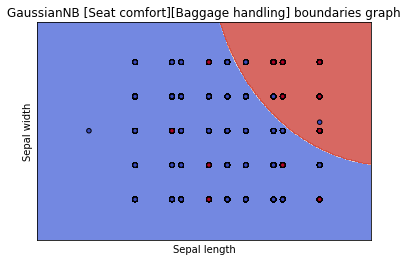

<Figure size 1440x720 with 0 Axes>

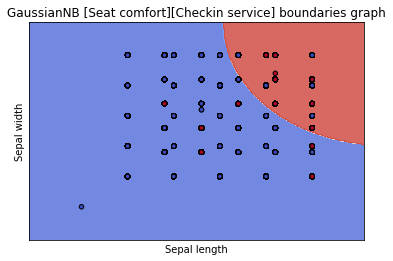

<Figure size 1440x720 with 0 Axes>

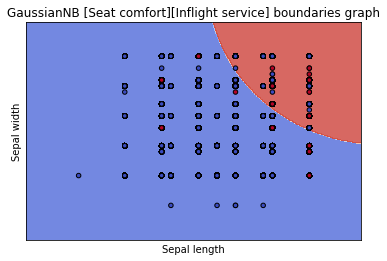

<Figure size 1440x720 with 0 Axes>

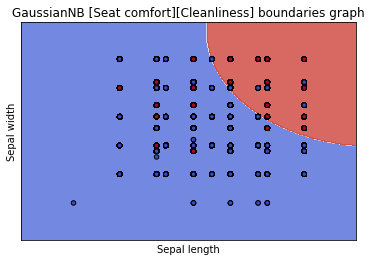

<Figure size 1440x720 with 0 Axes>

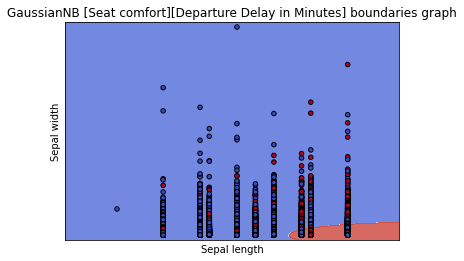

<Figure size 1440x720 with 0 Axes>

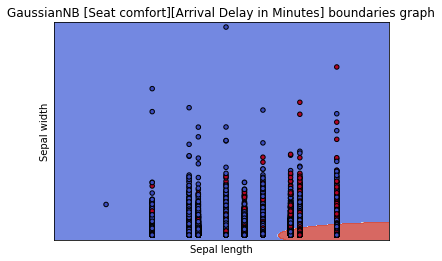

<Figure size 1440x720 with 0 Axes>

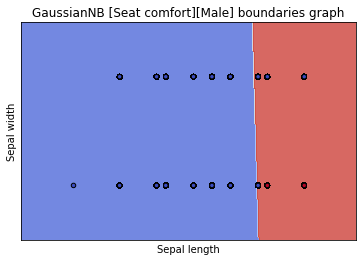

<Figure size 1440x720 with 0 Axes>

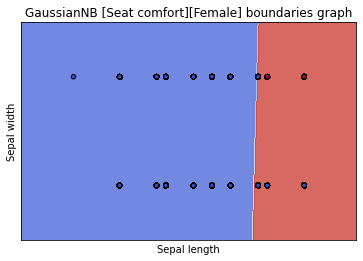

<Figure size 1440x720 with 0 Axes>

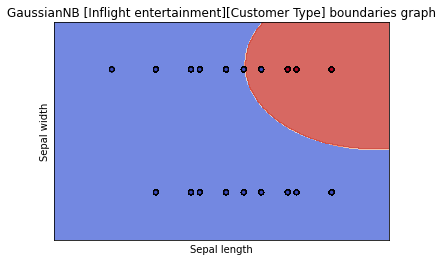

<Figure size 1440x720 with 0 Axes>

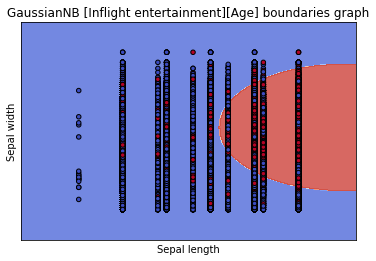

<Figure size 1440x720 with 0 Axes>

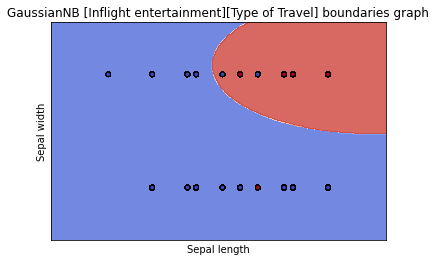

<Figure size 1440x720 with 0 Axes>

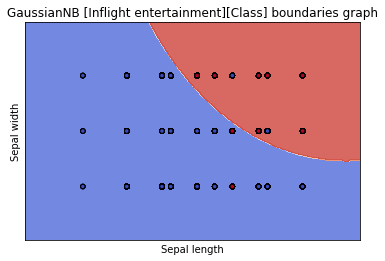

<Figure size 1440x720 with 0 Axes>

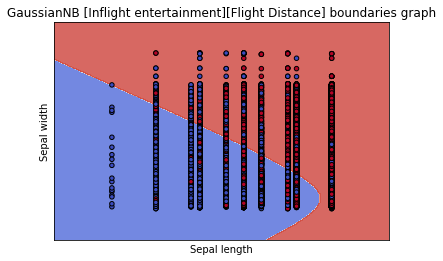

<Figure size 1440x720 with 0 Axes>

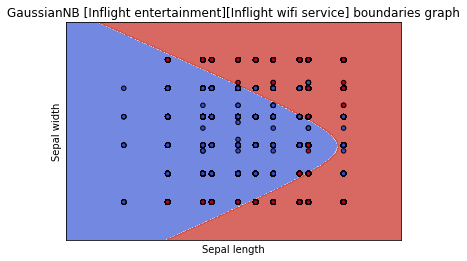

<Figure size 1440x720 with 0 Axes>

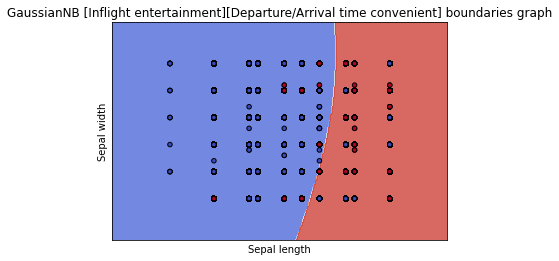

<Figure size 1440x720 with 0 Axes>

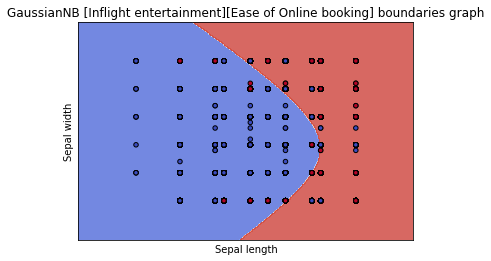

<Figure size 1440x720 with 0 Axes>

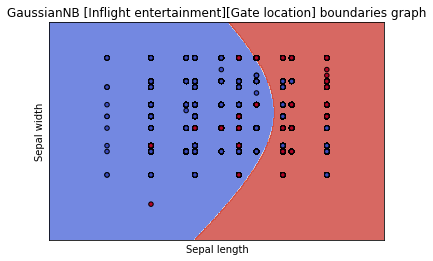

<Figure size 1440x720 with 0 Axes>

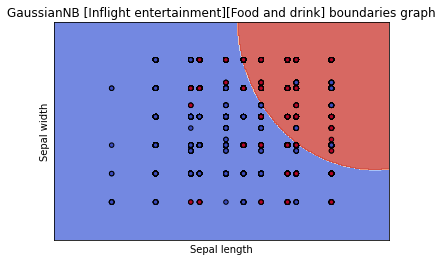

<Figure size 1440x720 with 0 Axes>

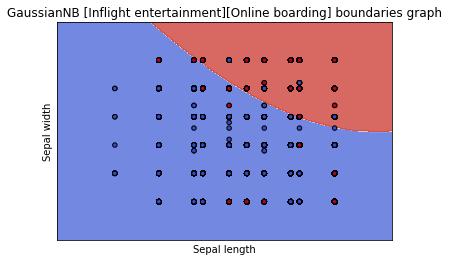

<Figure size 1440x720 with 0 Axes>

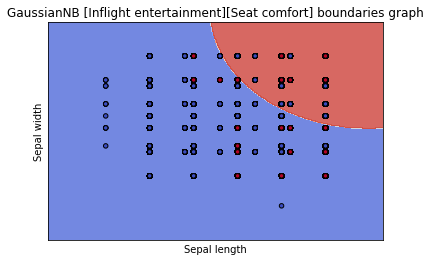

<Figure size 1440x720 with 0 Axes>

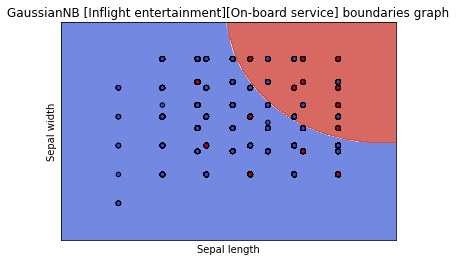

<Figure size 1440x720 with 0 Axes>

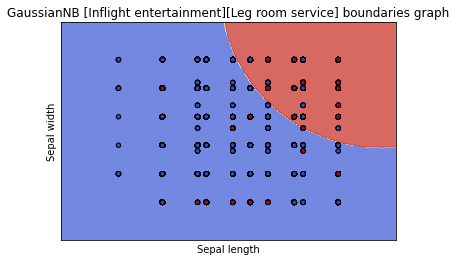

<Figure size 1440x720 with 0 Axes>

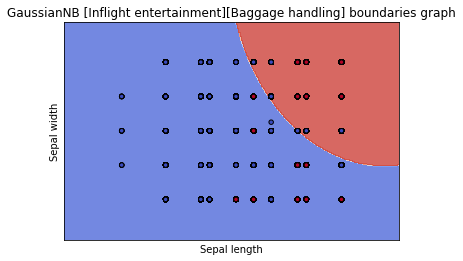

<Figure size 1440x720 with 0 Axes>

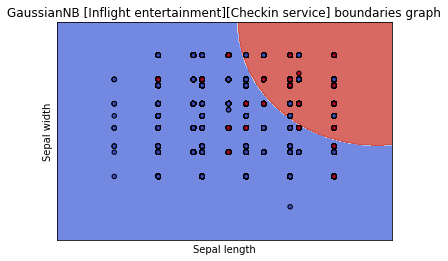

<Figure size 1440x720 with 0 Axes>

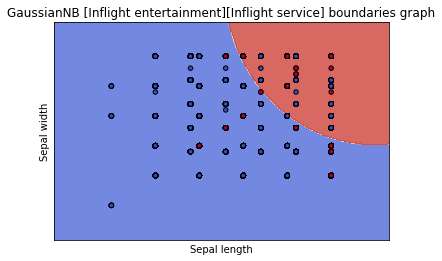

<Figure size 1440x720 with 0 Axes>

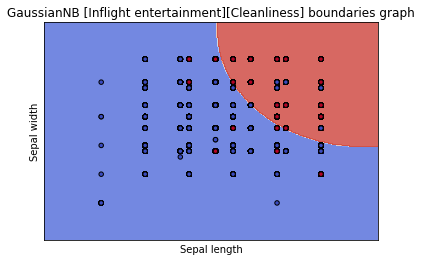

<Figure size 1440x720 with 0 Axes>

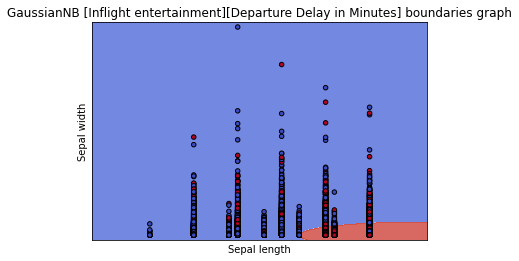

<Figure size 1440x720 with 0 Axes>

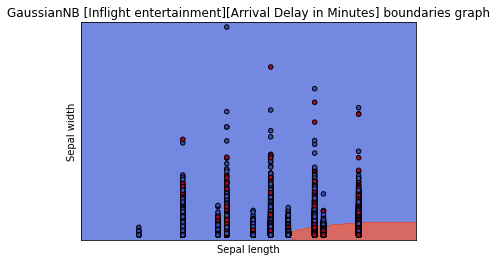

<Figure size 1440x720 with 0 Axes>

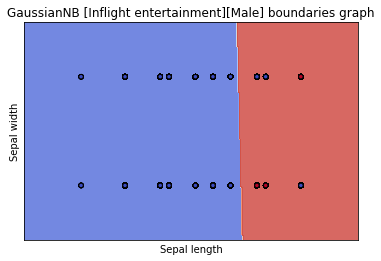

<Figure size 1440x720 with 0 Axes>

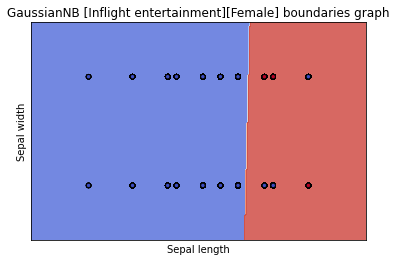

<Figure size 1440x720 with 0 Axes>

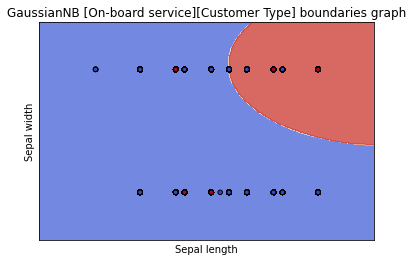

<Figure size 1440x720 with 0 Axes>

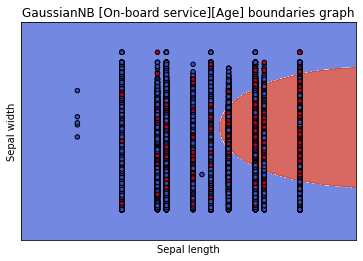

<Figure size 1440x720 with 0 Axes>

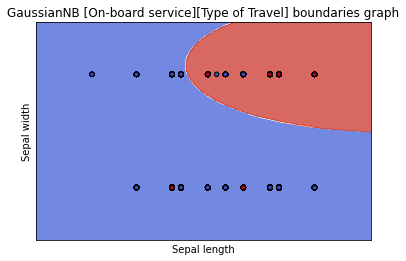

<Figure size 1440x720 with 0 Axes>

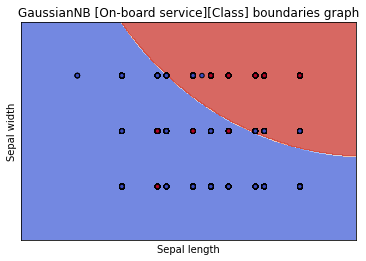

<Figure size 1440x720 with 0 Axes>

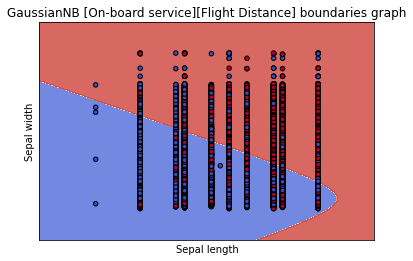

<Figure size 1440x720 with 0 Axes>

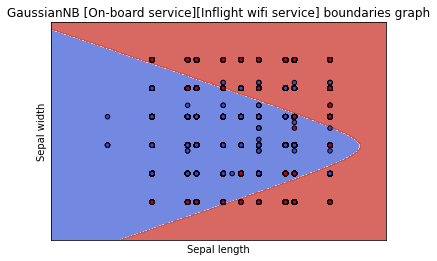

<Figure size 1440x720 with 0 Axes>

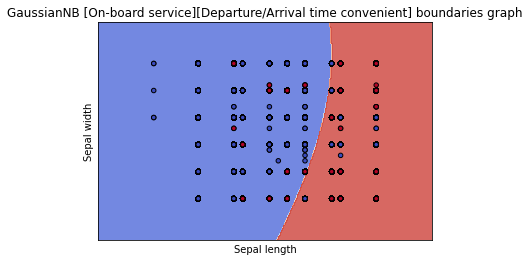

<Figure size 1440x720 with 0 Axes>

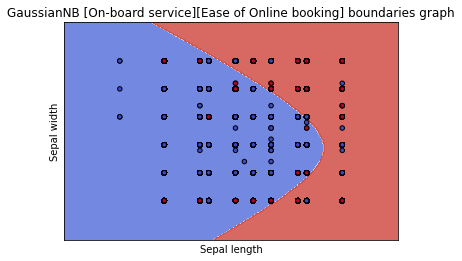

<Figure size 1440x720 with 0 Axes>

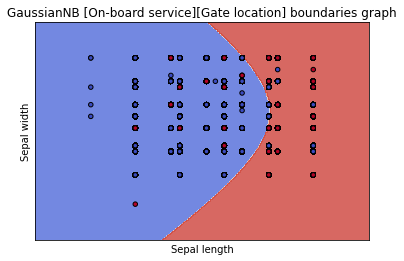

<Figure size 1440x720 with 0 Axes>

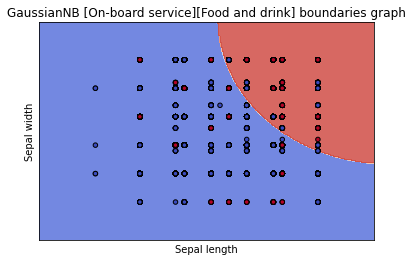

<Figure size 1440x720 with 0 Axes>

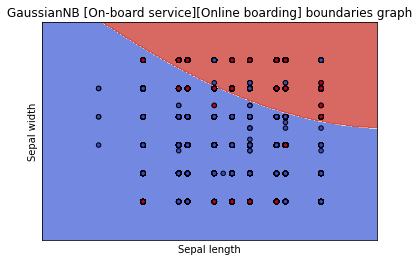

<Figure size 1440x720 with 0 Axes>

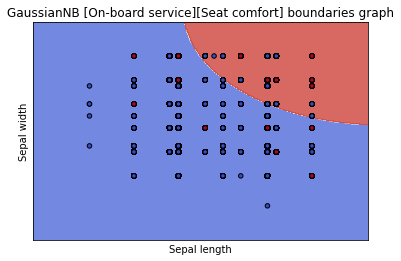

<Figure size 1440x720 with 0 Axes>

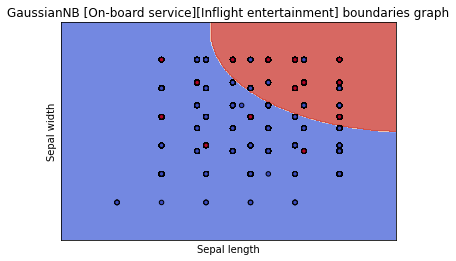

<Figure size 1440x720 with 0 Axes>

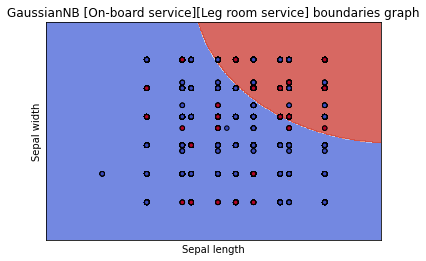

<Figure size 1440x720 with 0 Axes>

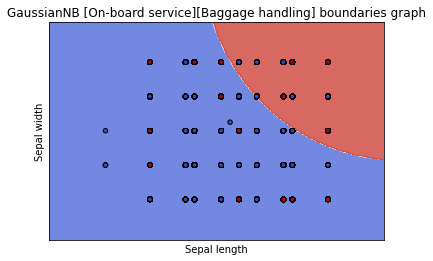

<Figure size 1440x720 with 0 Axes>

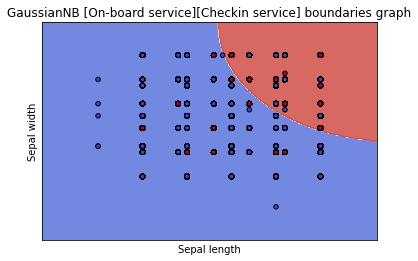

<Figure size 1440x720 with 0 Axes>

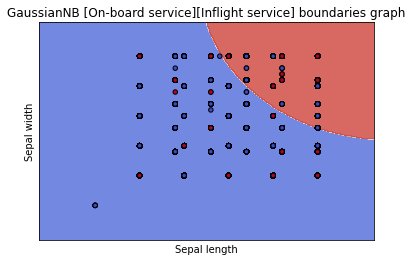

<Figure size 1440x720 with 0 Axes>

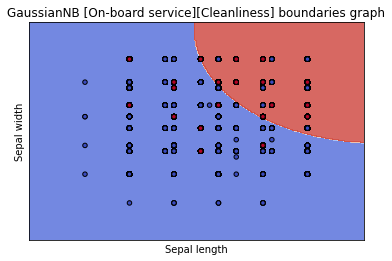

<Figure size 1440x720 with 0 Axes>

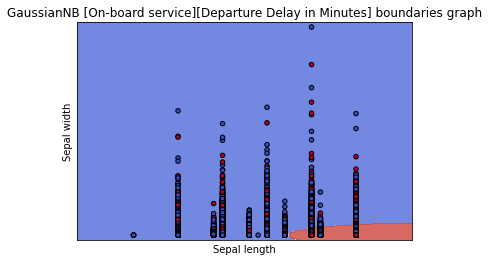

<Figure size 1440x720 with 0 Axes>

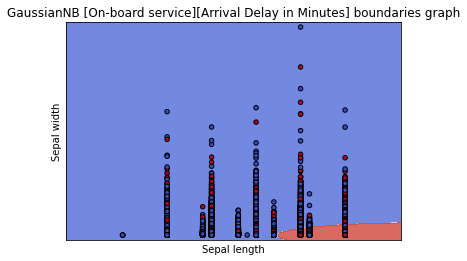

<Figure size 1440x720 with 0 Axes>

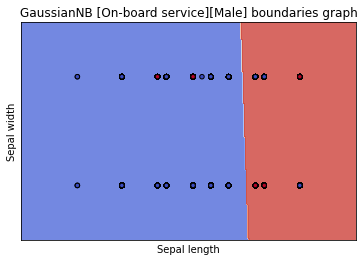

<Figure size 1440x720 with 0 Axes>

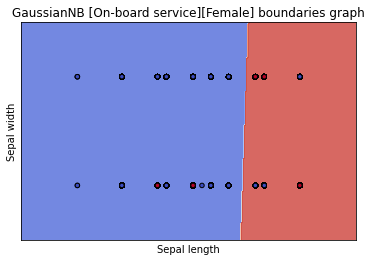

<Figure size 1440x720 with 0 Axes>

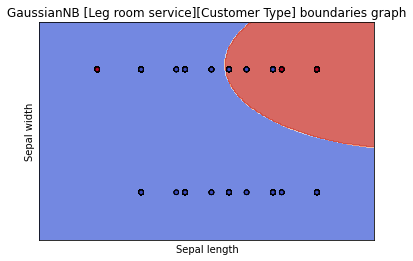

<Figure size 1440x720 with 0 Axes>

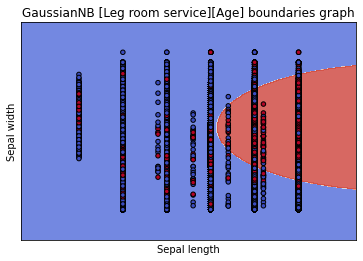

<Figure size 1440x720 with 0 Axes>

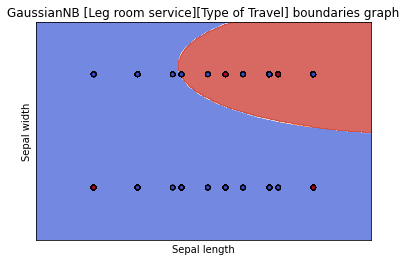

<Figure size 1440x720 with 0 Axes>

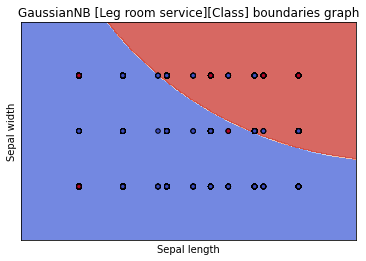

<Figure size 1440x720 with 0 Axes>

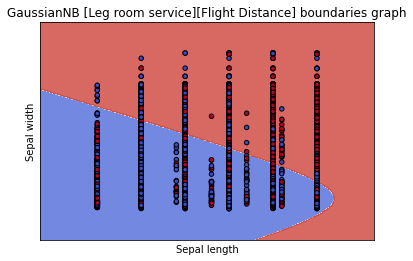

<Figure size 1440x720 with 0 Axes>

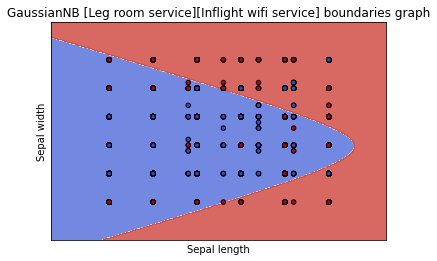

<Figure size 1440x720 with 0 Axes>

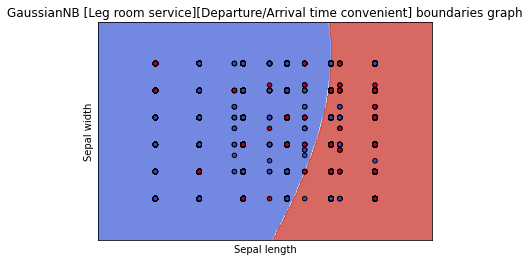

<Figure size 1440x720 with 0 Axes>

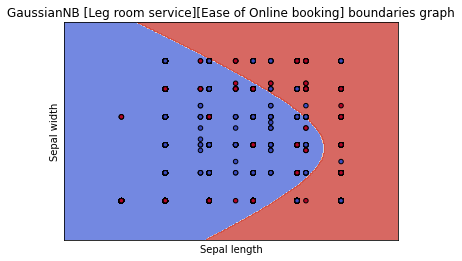

<Figure size 1440x720 with 0 Axes>

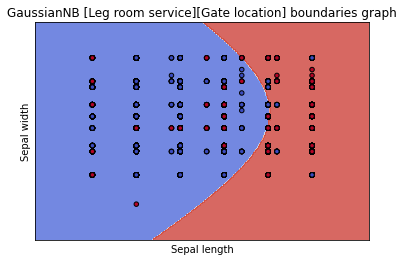

<Figure size 1440x720 with 0 Axes>

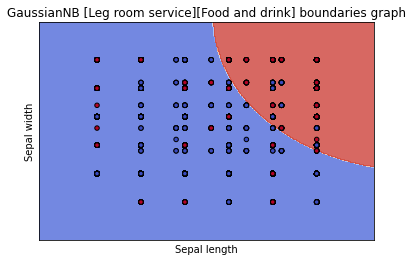

<Figure size 1440x720 with 0 Axes>

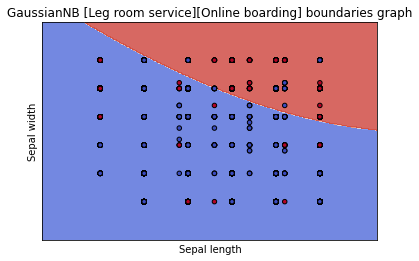

<Figure size 1440x720 with 0 Axes>

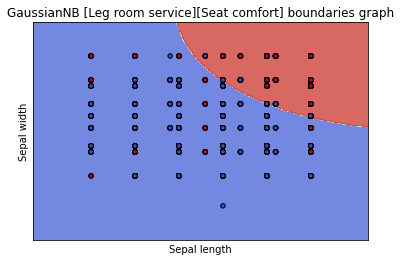

<Figure size 1440x720 with 0 Axes>

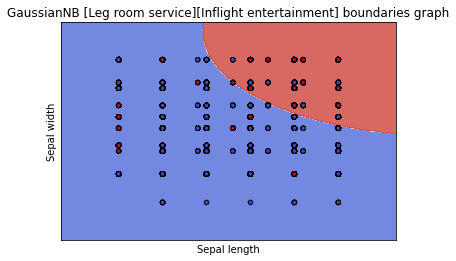

<Figure size 1440x720 with 0 Axes>

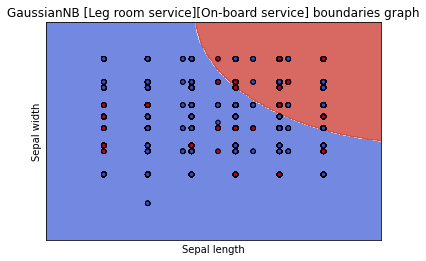

<Figure size 1440x720 with 0 Axes>

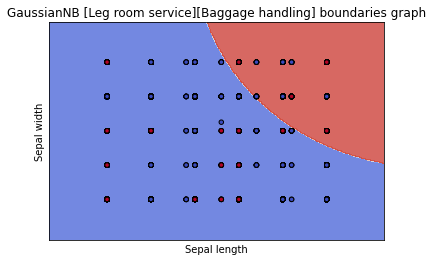

<Figure size 1440x720 with 0 Axes>

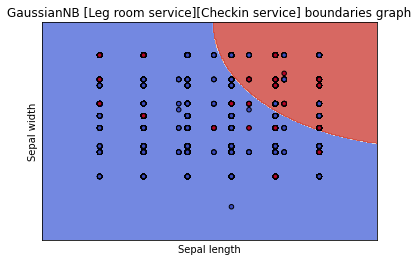

<Figure size 1440x720 with 0 Axes>

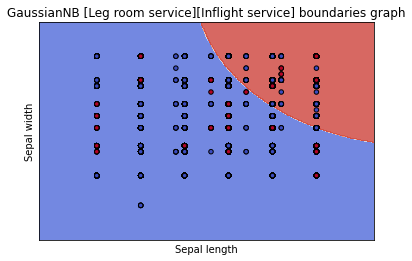

<Figure size 1440x720 with 0 Axes>

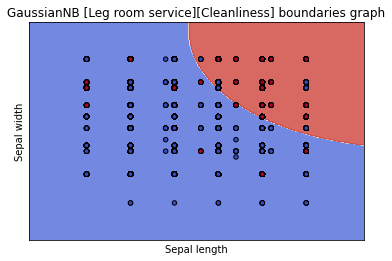

<Figure size 1440x720 with 0 Axes>

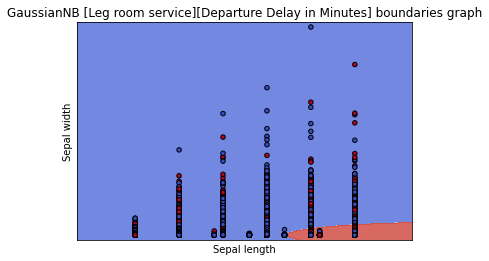

<Figure size 1440x720 with 0 Axes>

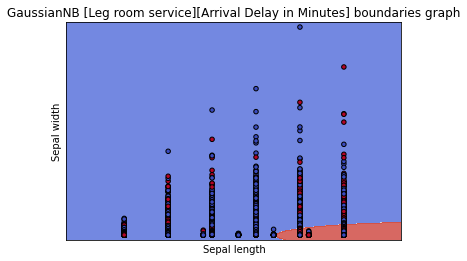

<Figure size 1440x720 with 0 Axes>

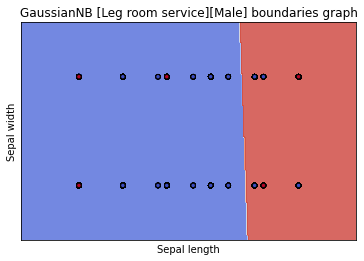

<Figure size 1440x720 with 0 Axes>

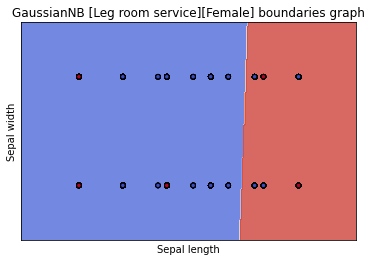

<Figure size 1440x720 with 0 Axes>

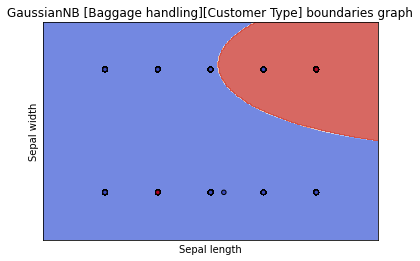

<Figure size 1440x720 with 0 Axes>

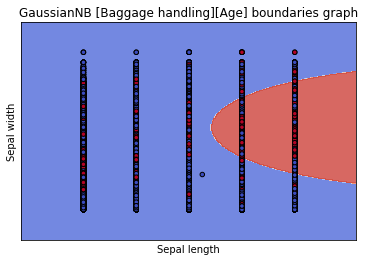

<Figure size 1440x720 with 0 Axes>

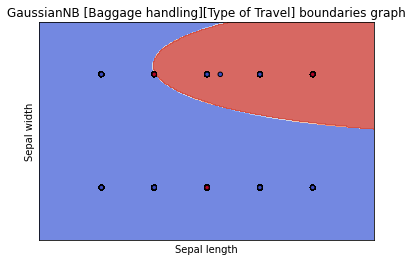

<Figure size 1440x720 with 0 Axes>

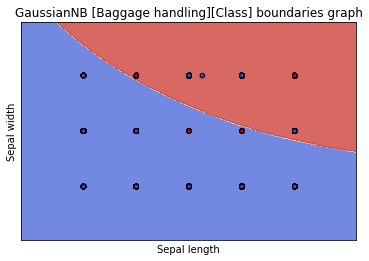

<Figure size 1440x720 with 0 Axes>

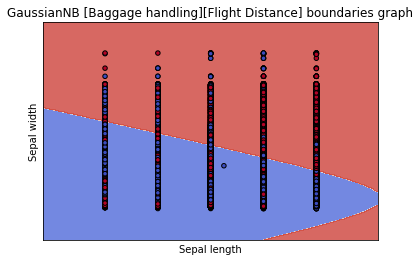

<Figure size 1440x720 with 0 Axes>

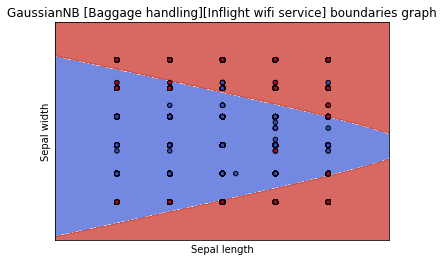

<Figure size 1440x720 with 0 Axes>

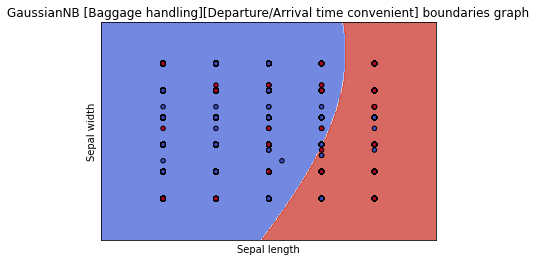

<Figure size 1440x720 with 0 Axes>

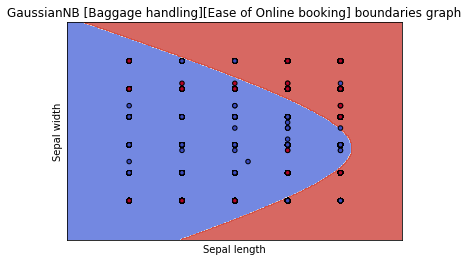

<Figure size 1440x720 with 0 Axes>

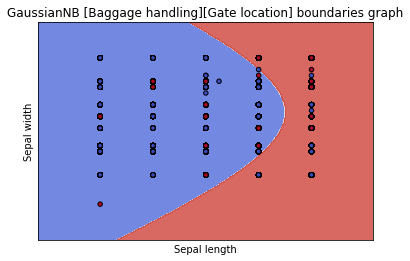

<Figure size 1440x720 with 0 Axes>

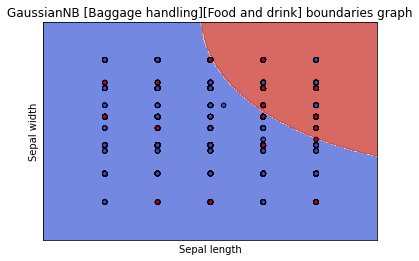

<Figure size 1440x720 with 0 Axes>

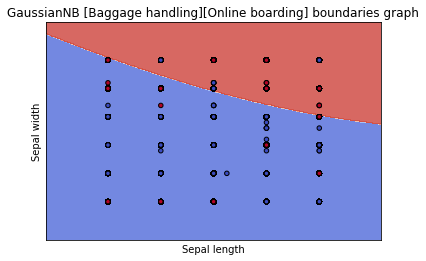

<Figure size 1440x720 with 0 Axes>

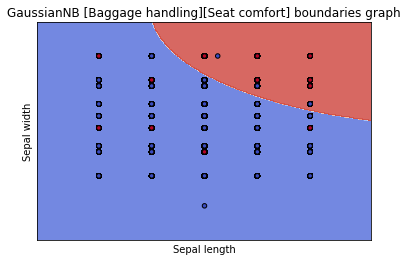

<Figure size 1440x720 with 0 Axes>

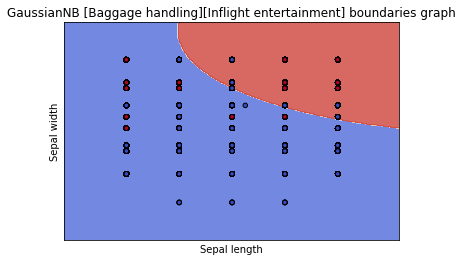

<Figure size 1440x720 with 0 Axes>

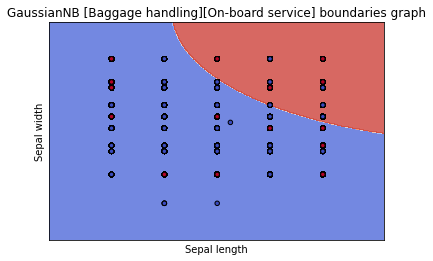

<Figure size 1440x720 with 0 Axes>

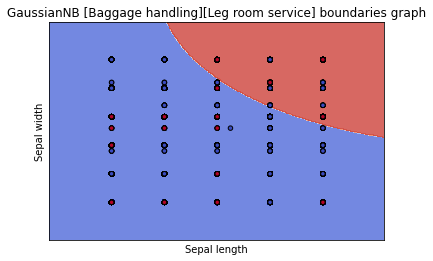

<Figure size 1440x720 with 0 Axes>

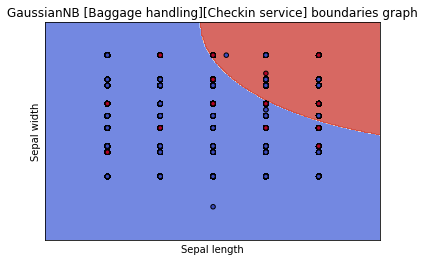

<Figure size 1440x720 with 0 Axes>

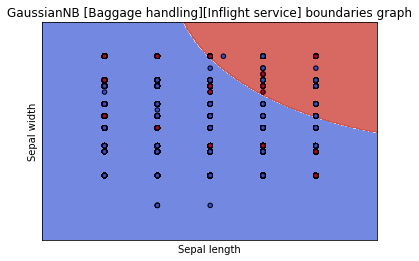

<Figure size 1440x720 with 0 Axes>

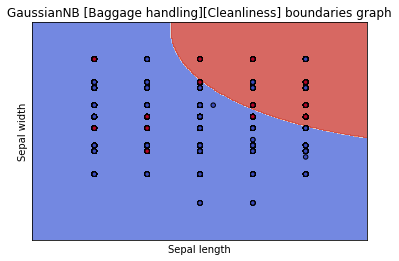

<Figure size 1440x720 with 0 Axes>

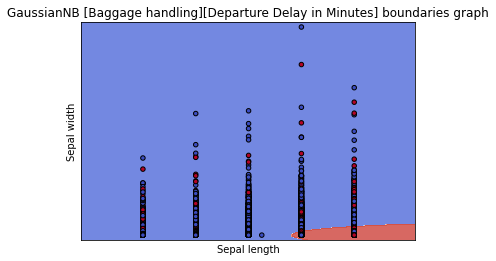

<Figure size 1440x720 with 0 Axes>

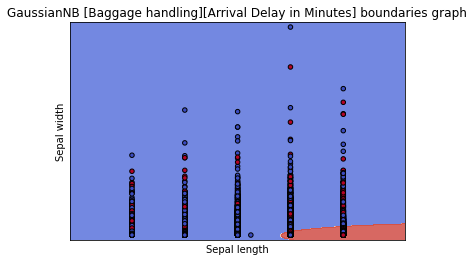

<Figure size 1440x720 with 0 Axes>

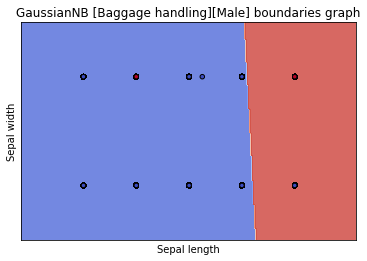

<Figure size 1440x720 with 0 Axes>

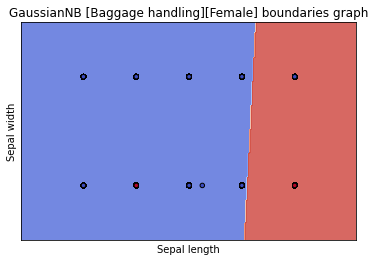

<Figure size 1440x720 with 0 Axes>

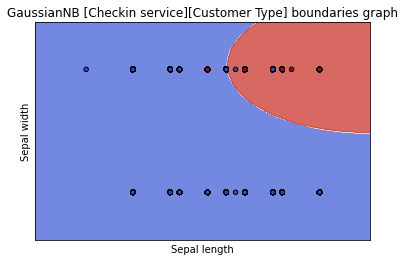

<Figure size 1440x720 with 0 Axes>

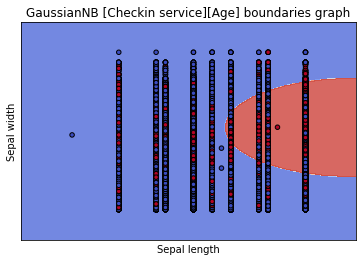

<Figure size 1440x720 with 0 Axes>

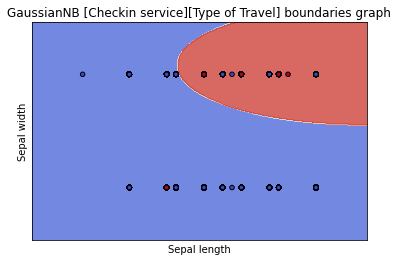

<Figure size 1440x720 with 0 Axes>

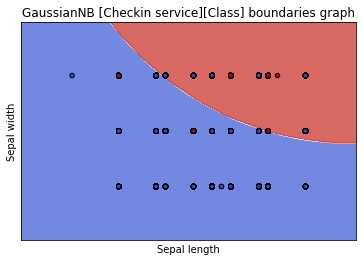

<Figure size 1440x720 with 0 Axes>

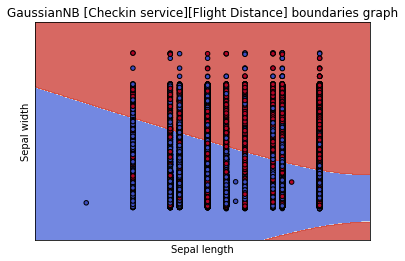

<Figure size 1440x720 with 0 Axes>

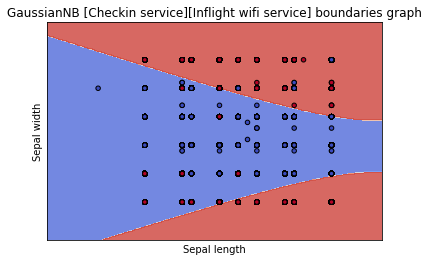

<Figure size 1440x720 with 0 Axes>

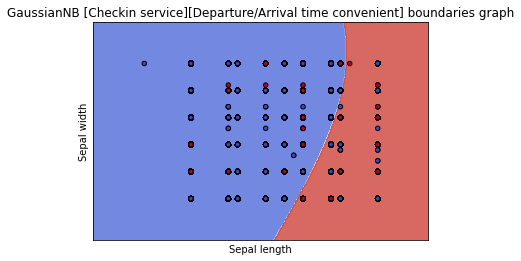

<Figure size 1440x720 with 0 Axes>

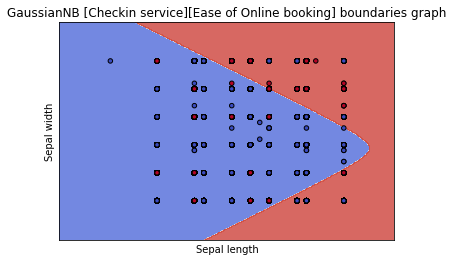

<Figure size 1440x720 with 0 Axes>

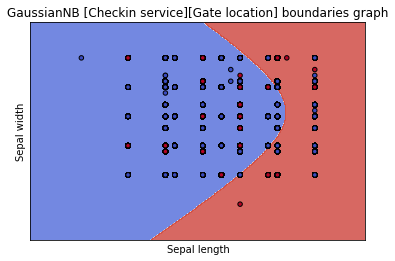

<Figure size 1440x720 with 0 Axes>

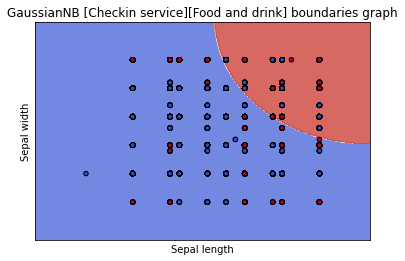

<Figure size 1440x720 with 0 Axes>

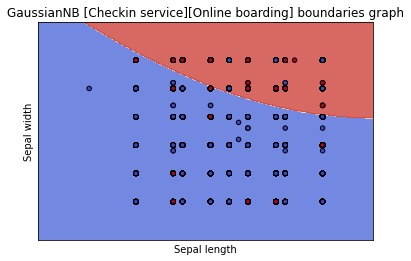

<Figure size 1440x720 with 0 Axes>

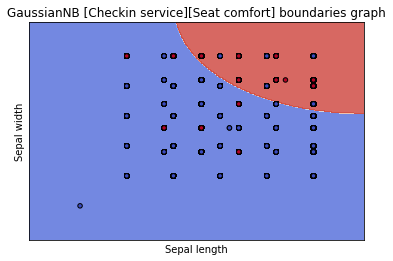

<Figure size 1440x720 with 0 Axes>

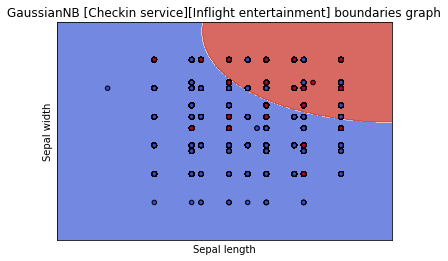

<Figure size 1440x720 with 0 Axes>

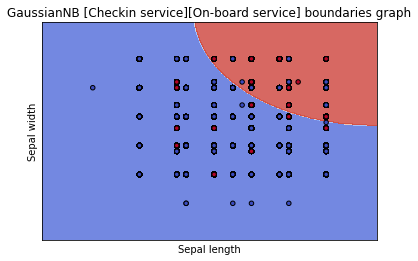

<Figure size 1440x720 with 0 Axes>

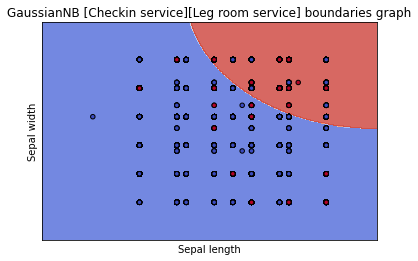

<Figure size 1440x720 with 0 Axes>

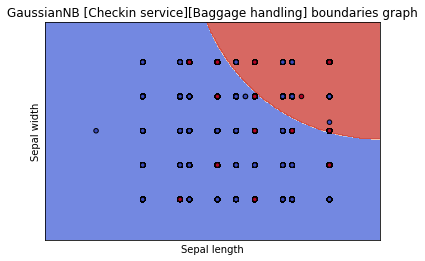

<Figure size 1440x720 with 0 Axes>

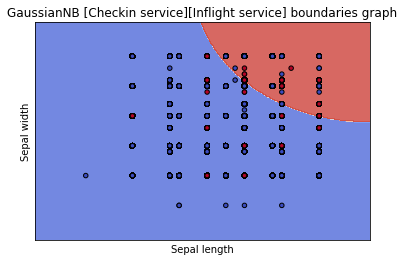

<Figure size 1440x720 with 0 Axes>

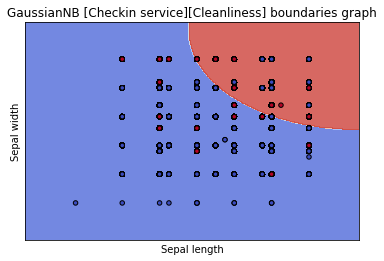

<Figure size 1440x720 with 0 Axes>

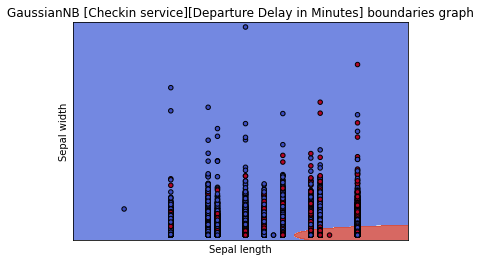

<Figure size 1440x720 with 0 Axes>

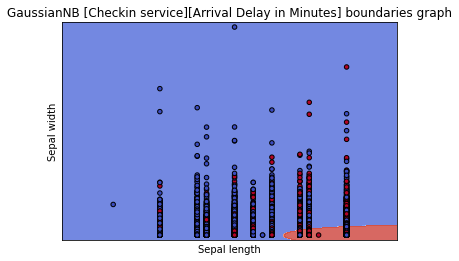

<Figure size 1440x720 with 0 Axes>

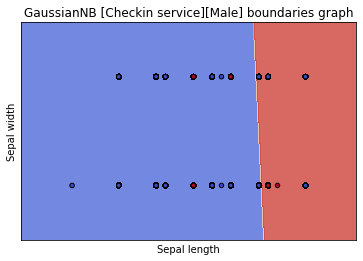

<Figure size 1440x720 with 0 Axes>

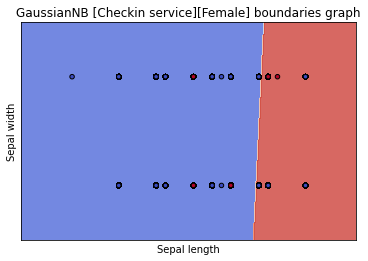

<Figure size 1440x720 with 0 Axes>

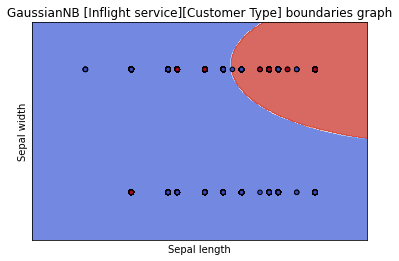

<Figure size 1440x720 with 0 Axes>

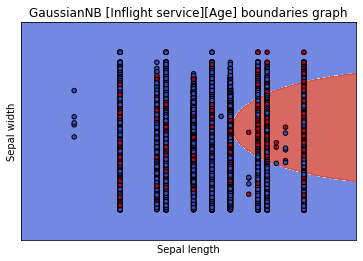

<Figure size 1440x720 with 0 Axes>

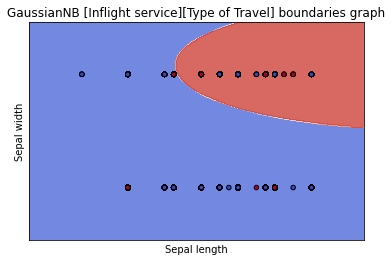

<Figure size 1440x720 with 0 Axes>

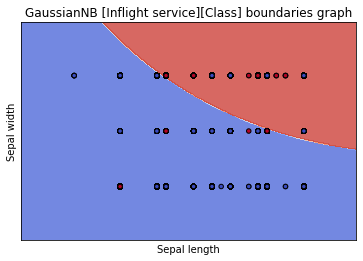

<Figure size 1440x720 with 0 Axes>

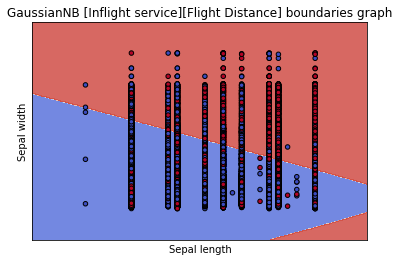

<Figure size 1440x720 with 0 Axes>

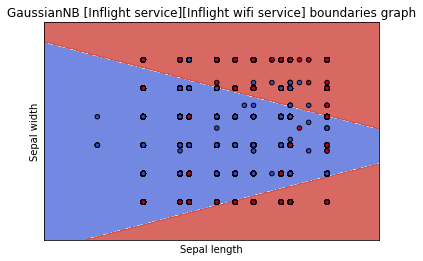

<Figure size 1440x720 with 0 Axes>

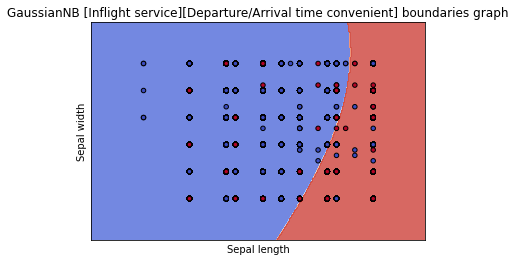

<Figure size 1440x720 with 0 Axes>

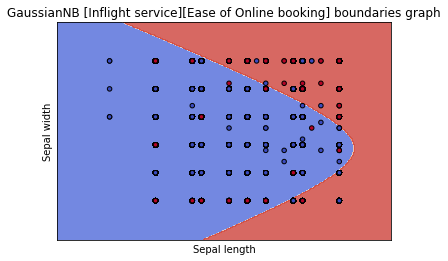

<Figure size 1440x720 with 0 Axes>

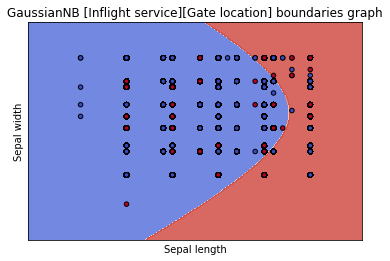

<Figure size 1440x720 with 0 Axes>

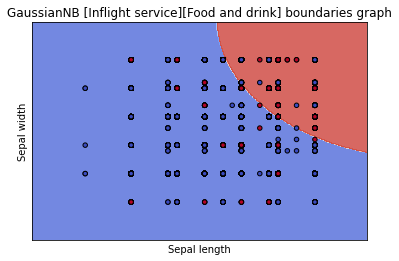

<Figure size 1440x720 with 0 Axes>

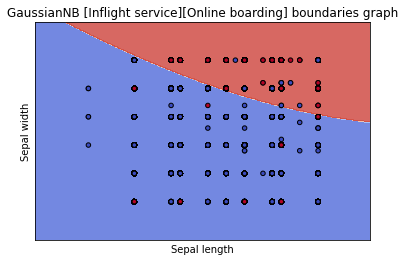

<Figure size 1440x720 with 0 Axes>

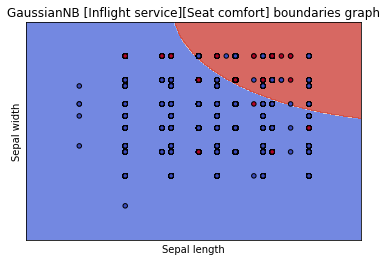

<Figure size 1440x720 with 0 Axes>

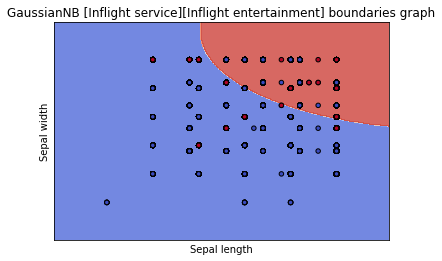

<Figure size 1440x720 with 0 Axes>

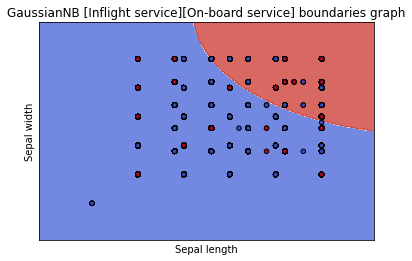

<Figure size 1440x720 with 0 Axes>

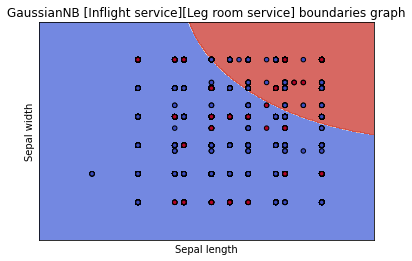

<Figure size 1440x720 with 0 Axes>

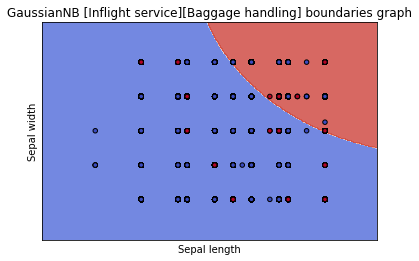

<Figure size 1440x720 with 0 Axes>

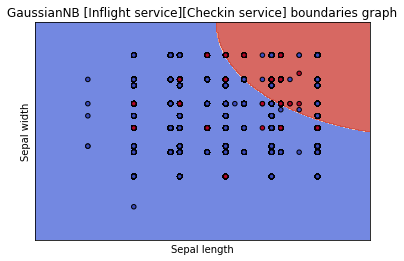

<Figure size 1440x720 with 0 Axes>

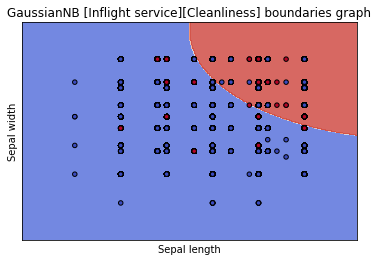

<Figure size 1440x720 with 0 Axes>

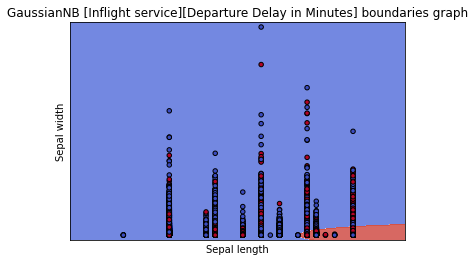

<Figure size 1440x720 with 0 Axes>

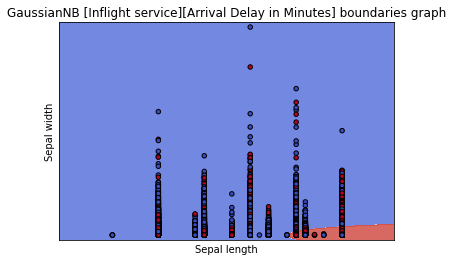

<Figure size 1440x720 with 0 Axes>

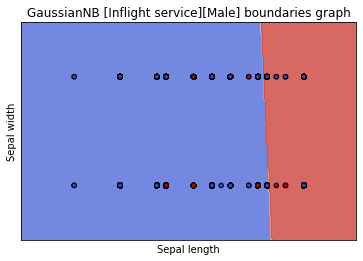

<Figure size 1440x720 with 0 Axes>

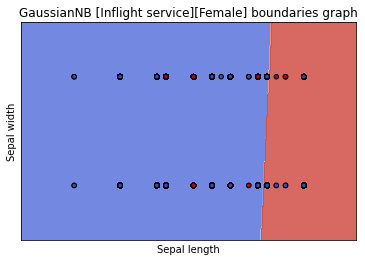

<Figure size 1440x720 with 0 Axes>

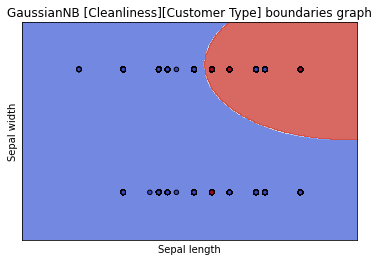

<Figure size 1440x720 with 0 Axes>

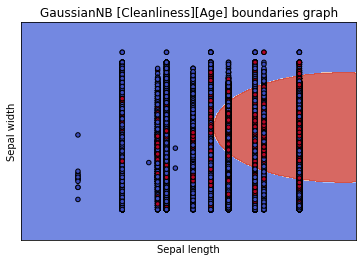

<Figure size 1440x720 with 0 Axes>

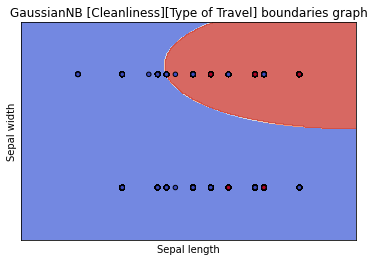

<Figure size 1440x720 with 0 Axes>

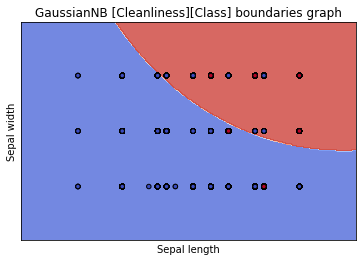

<Figure size 1440x720 with 0 Axes>

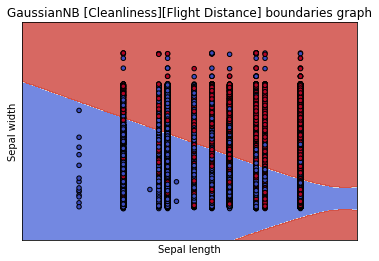

<Figure size 1440x720 with 0 Axes>

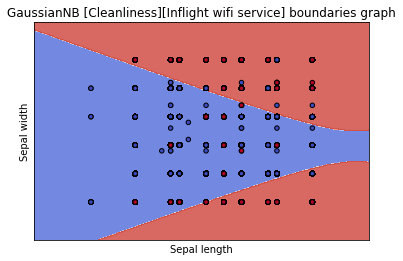

<Figure size 1440x720 with 0 Axes>

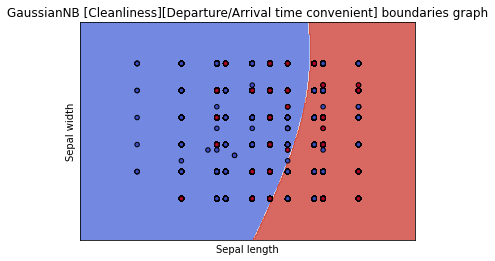

<Figure size 1440x720 with 0 Axes>

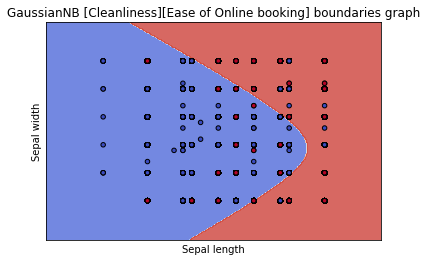

<Figure size 1440x720 with 0 Axes>

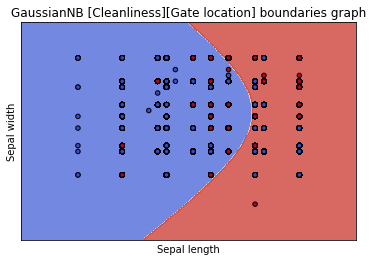

<Figure size 1440x720 with 0 Axes>

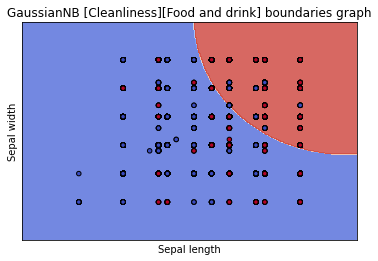

<Figure size 1440x720 with 0 Axes>

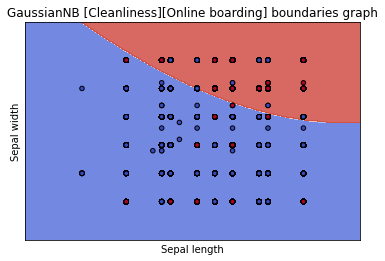

<Figure size 1440x720 with 0 Axes>

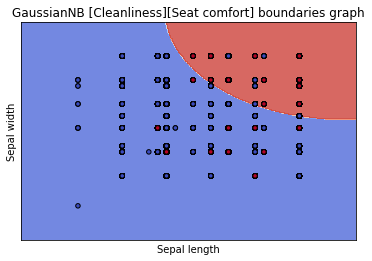

<Figure size 1440x720 with 0 Axes>

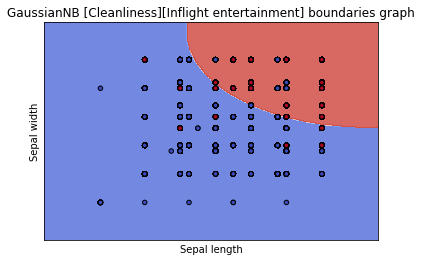

<Figure size 1440x720 with 0 Axes>

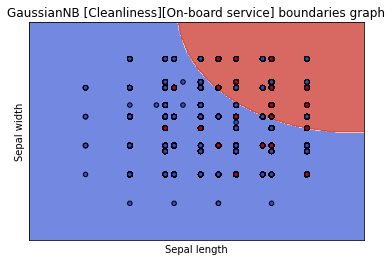

<Figure size 1440x720 with 0 Axes>

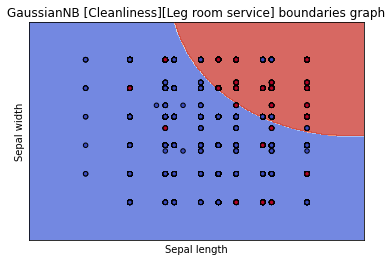

<Figure size 1440x720 with 0 Axes>

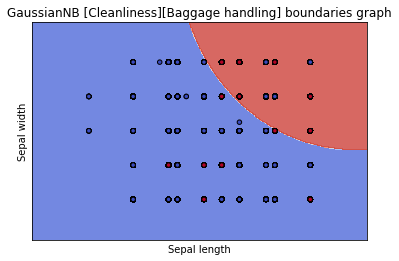

<Figure size 1440x720 with 0 Axes>

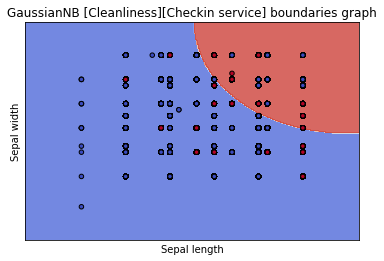

<Figure size 1440x720 with 0 Axes>

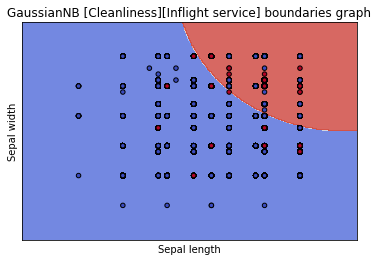

<Figure size 1440x720 with 0 Axes>

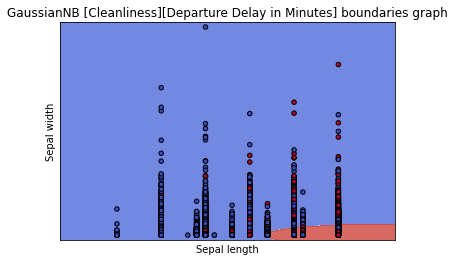

<Figure size 1440x720 with 0 Axes>

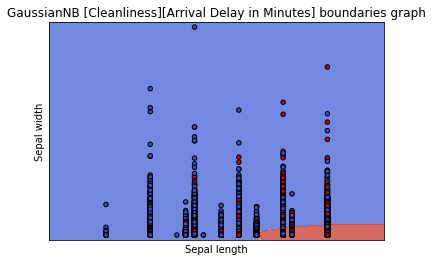

<Figure size 1440x720 with 0 Axes>

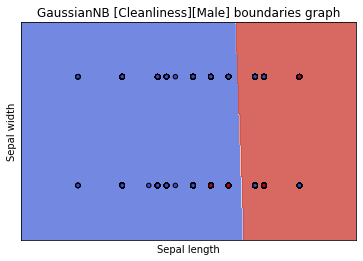

<Figure size 1440x720 with 0 Axes>

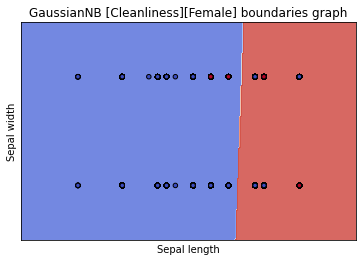

<Figure size 1440x720 with 0 Axes>

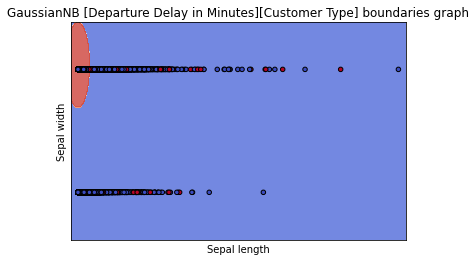

<Figure size 1440x720 with 0 Axes>

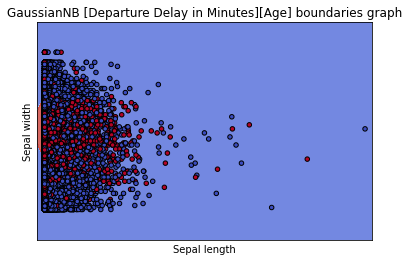

<Figure size 1440x720 with 0 Axes>

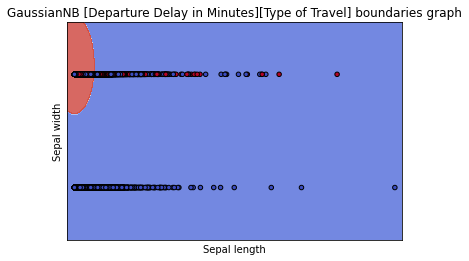

<Figure size 1440x720 with 0 Axes>

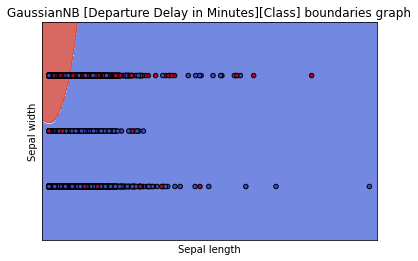

<Figure size 1440x720 with 0 Axes>

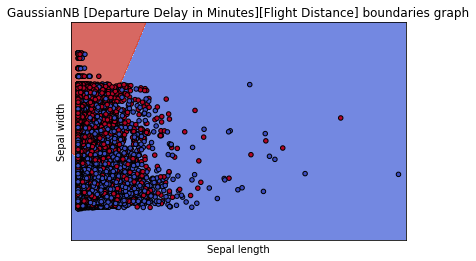

<Figure size 1440x720 with 0 Axes>

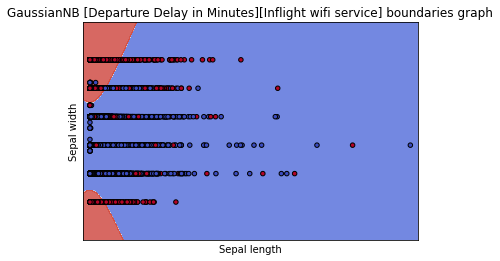

<Figure size 1440x720 with 0 Axes>

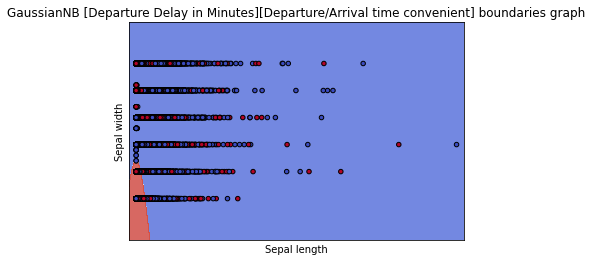

<Figure size 1440x720 with 0 Axes>

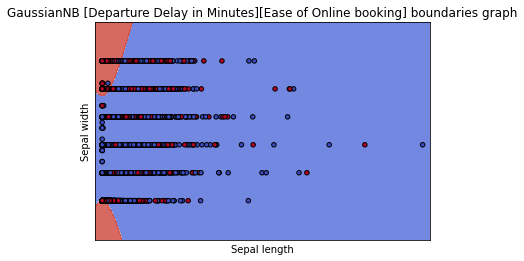

<Figure size 1440x720 with 0 Axes>

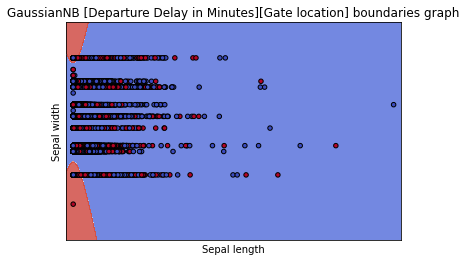

<Figure size 1440x720 with 0 Axes>

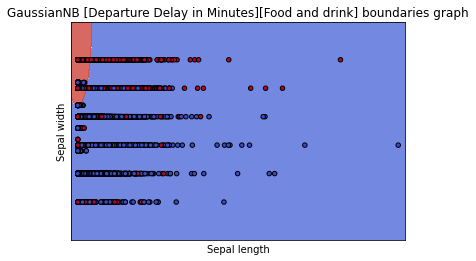

<Figure size 1440x720 with 0 Axes>

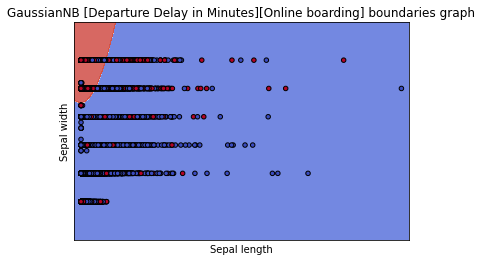

<Figure size 1440x720 with 0 Axes>

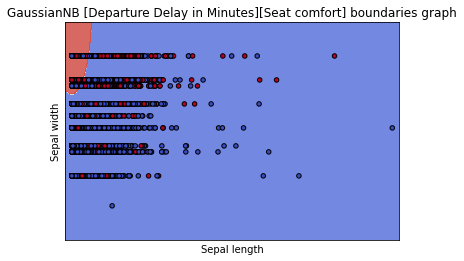

<Figure size 1440x720 with 0 Axes>

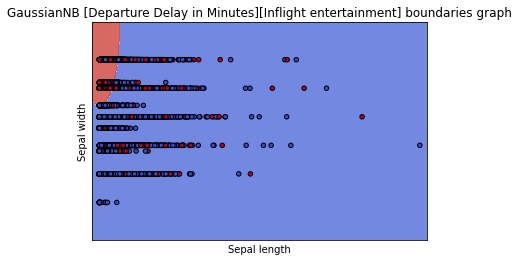

<Figure size 1440x720 with 0 Axes>

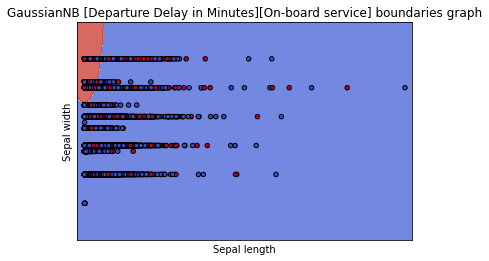

<Figure size 1440x720 with 0 Axes>

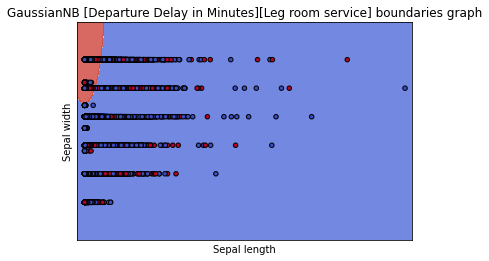

<Figure size 1440x720 with 0 Axes>

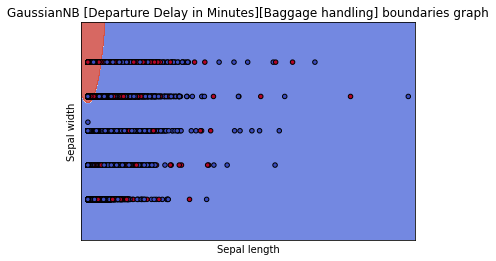

<Figure size 1440x720 with 0 Axes>

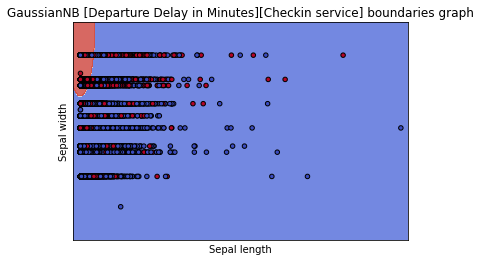

<Figure size 1440x720 with 0 Axes>

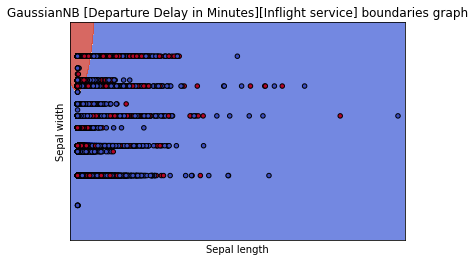

<Figure size 1440x720 with 0 Axes>

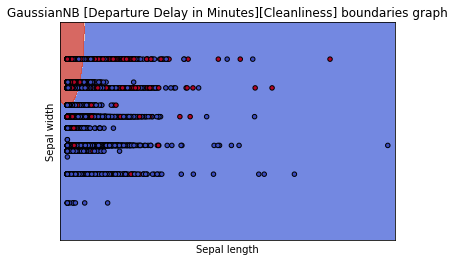

<Figure size 1440x720 with 0 Axes>

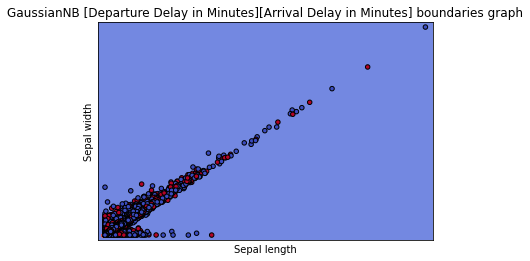

<Figure size 1440x720 with 0 Axes>

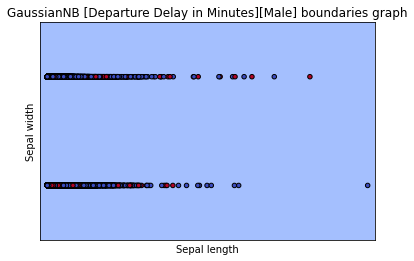

<Figure size 1440x720 with 0 Axes>

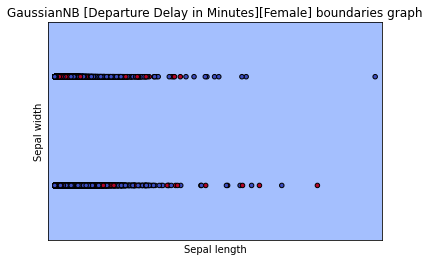

<Figure size 1440x720 with 0 Axes>

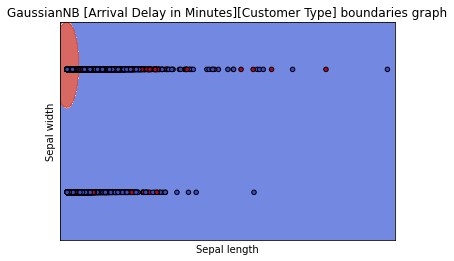

<Figure size 1440x720 with 0 Axes>

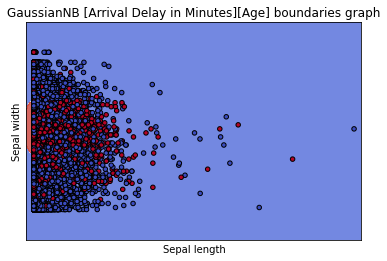

<Figure size 1440x720 with 0 Axes>

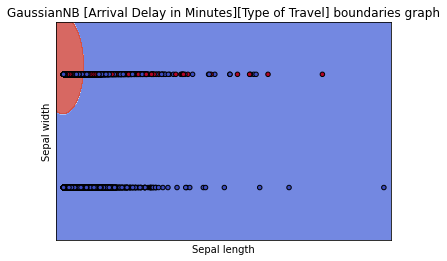

<Figure size 1440x720 with 0 Axes>

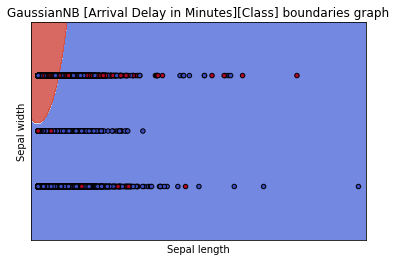

<Figure size 1440x720 with 0 Axes>

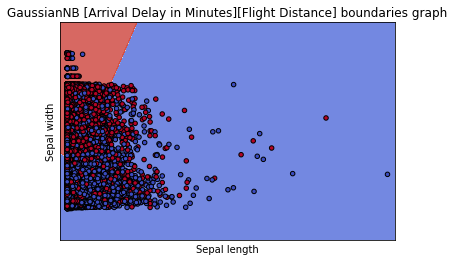

<Figure size 1440x720 with 0 Axes>

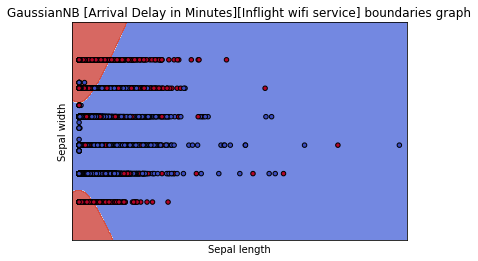

<Figure size 1440x720 with 0 Axes>

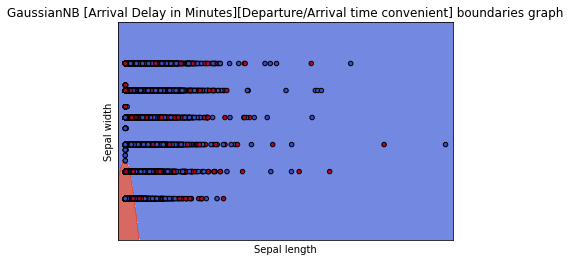

<Figure size 1440x720 with 0 Axes>

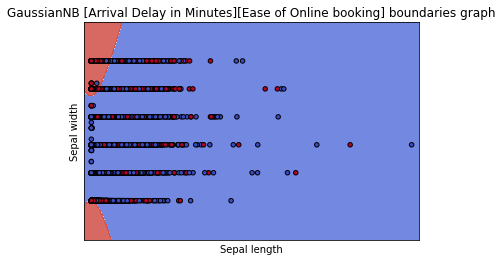

<Figure size 1440x720 with 0 Axes>

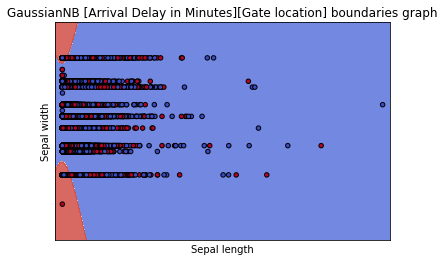

<Figure size 1440x720 with 0 Axes>

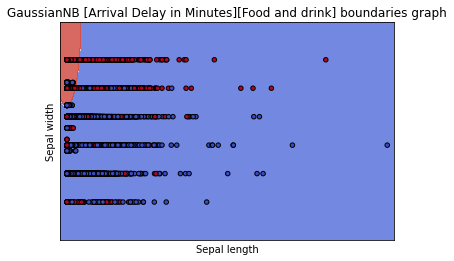

<Figure size 1440x720 with 0 Axes>

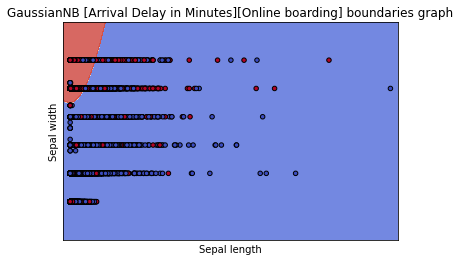

<Figure size 1440x720 with 0 Axes>

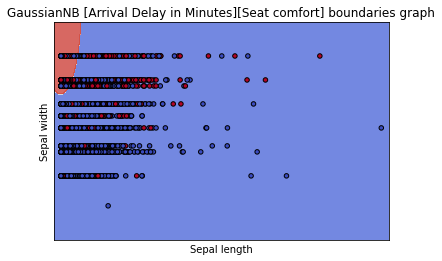

<Figure size 1440x720 with 0 Axes>

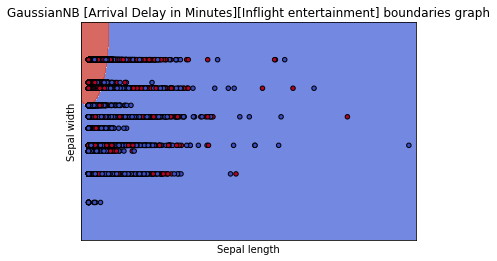

<Figure size 1440x720 with 0 Axes>

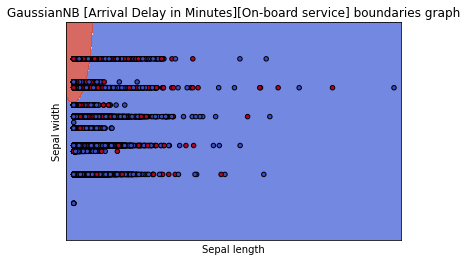

<Figure size 1440x720 with 0 Axes>

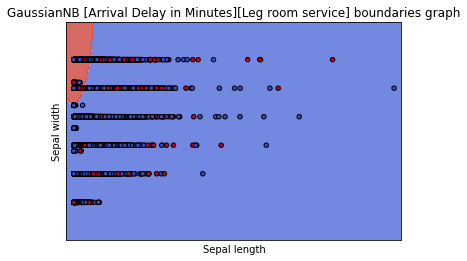

<Figure size 1440x720 with 0 Axes>

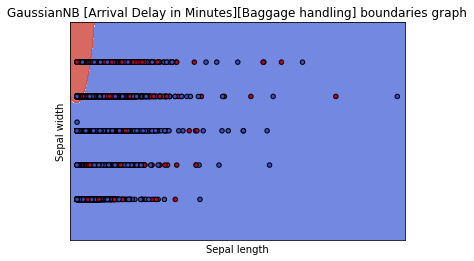

<Figure size 1440x720 with 0 Axes>

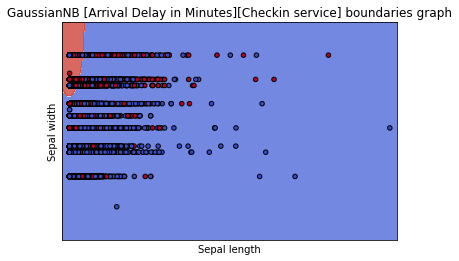

<Figure size 1440x720 with 0 Axes>

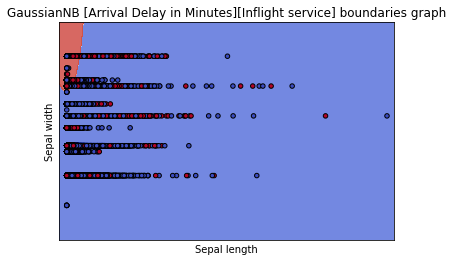

<Figure size 1440x720 with 0 Axes>

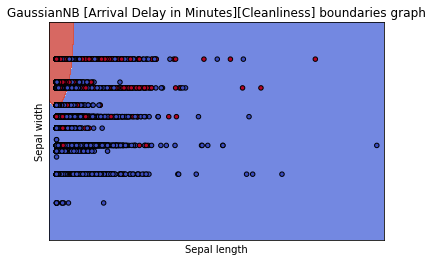

<Figure size 1440x720 with 0 Axes>

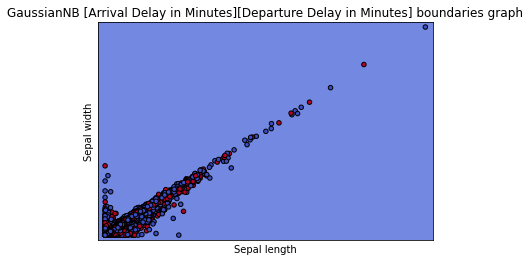

<Figure size 1440x720 with 0 Axes>

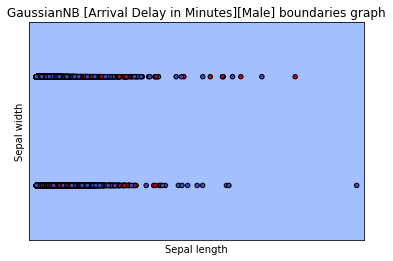

<Figure size 1440x720 with 0 Axes>

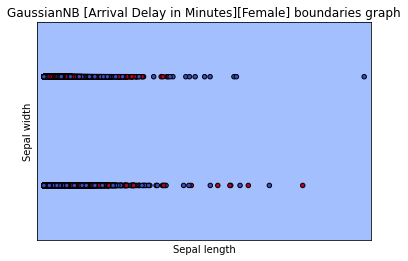

<Figure size 1440x720 with 0 Axes>

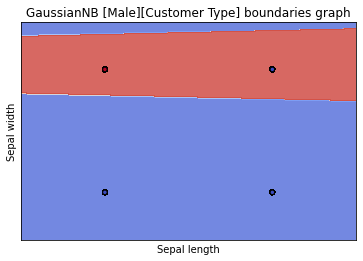

<Figure size 1440x720 with 0 Axes>

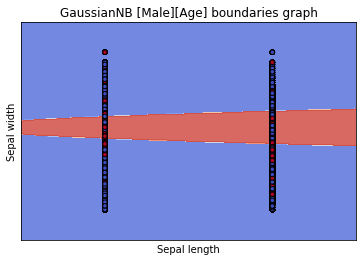

<Figure size 1440x720 with 0 Axes>

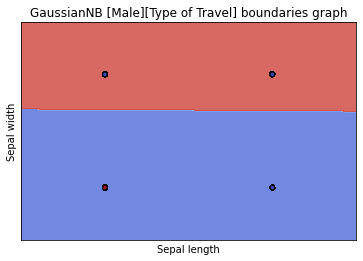

<Figure size 1440x720 with 0 Axes>

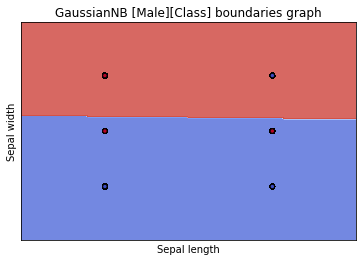

<Figure size 1440x720 with 0 Axes>

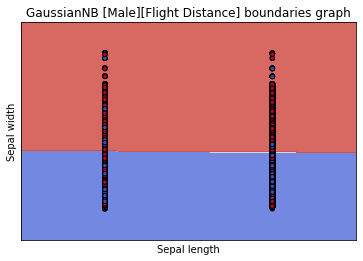

<Figure size 1440x720 with 0 Axes>

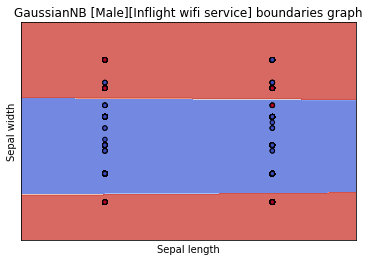

<Figure size 1440x720 with 0 Axes>

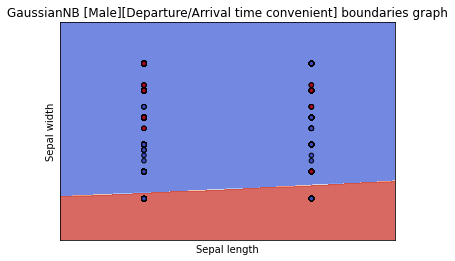

<Figure size 1440x720 with 0 Axes>

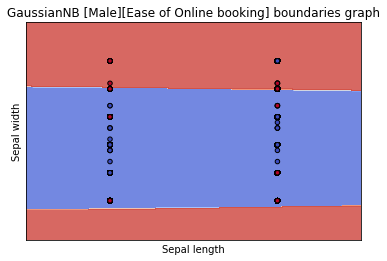

<Figure size 1440x720 with 0 Axes>

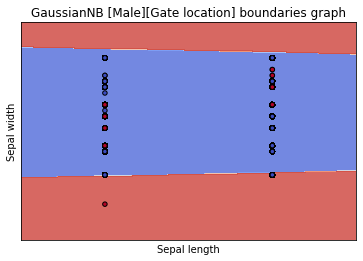

<Figure size 1440x720 with 0 Axes>

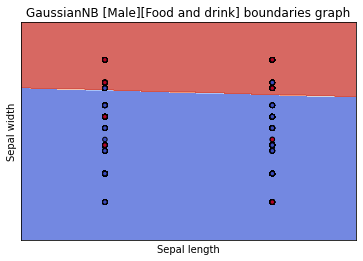

<Figure size 1440x720 with 0 Axes>

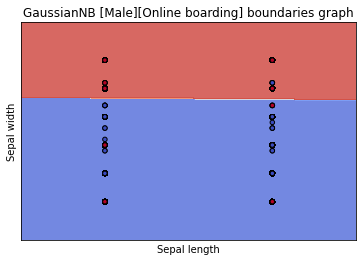

<Figure size 1440x720 with 0 Axes>

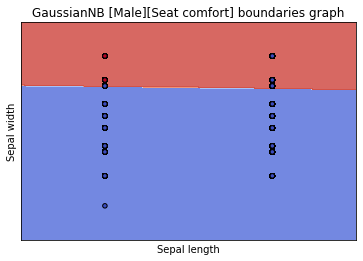

<Figure size 1440x720 with 0 Axes>

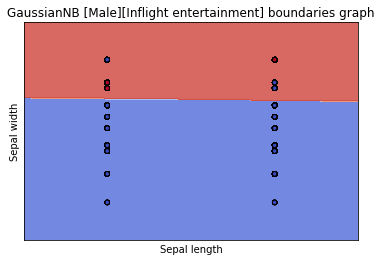

<Figure size 1440x720 with 0 Axes>

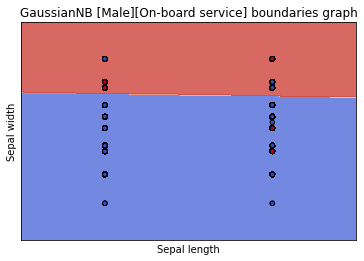

<Figure size 1440x720 with 0 Axes>

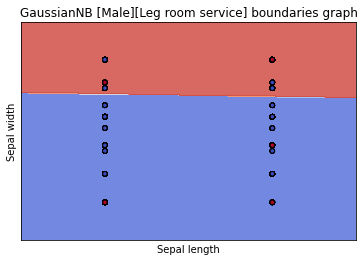

<Figure size 1440x720 with 0 Axes>

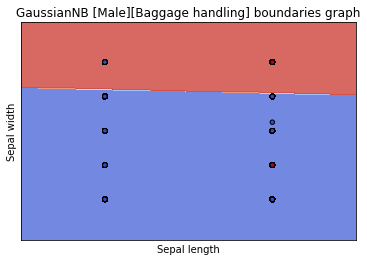

<Figure size 1440x720 with 0 Axes>

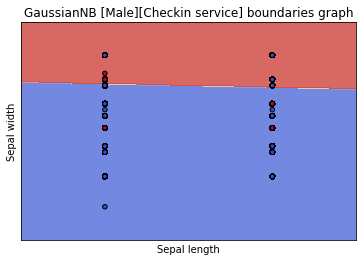

<Figure size 1440x720 with 0 Axes>

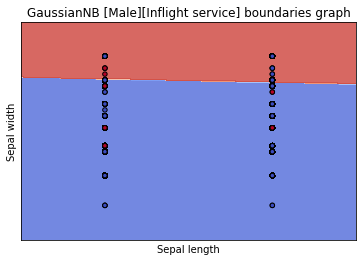

<Figure size 1440x720 with 0 Axes>

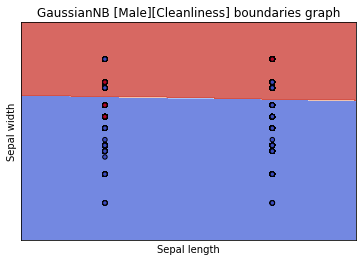

<Figure size 1440x720 with 0 Axes>

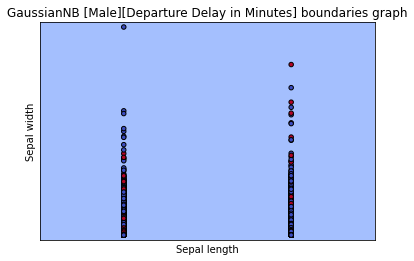

<Figure size 1440x720 with 0 Axes>

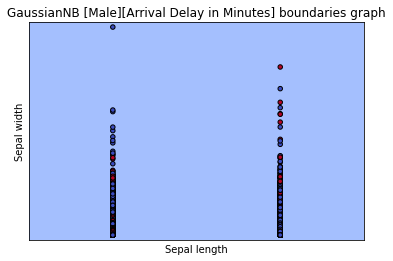

<Figure size 1440x720 with 0 Axes>

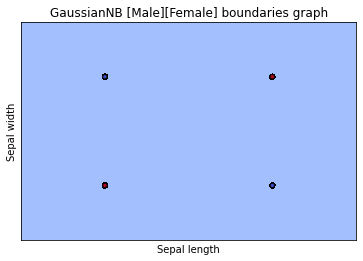

<Figure size 1440x720 with 0 Axes>

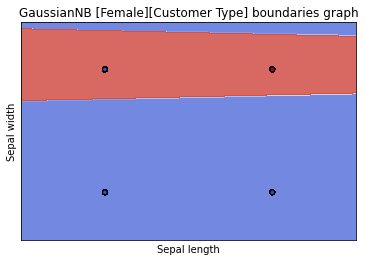

<Figure size 1440x720 with 0 Axes>

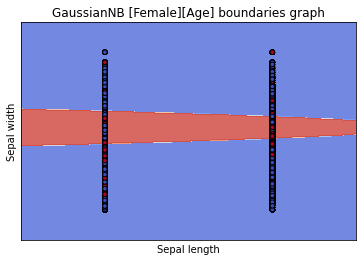

<Figure size 1440x720 with 0 Axes>

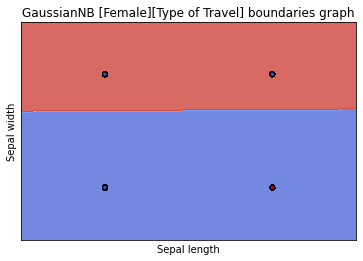

<Figure size 1440x720 with 0 Axes>

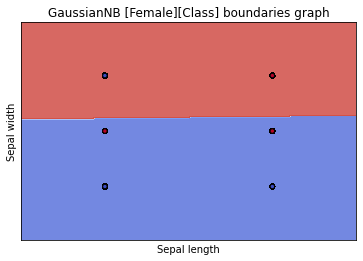

<Figure size 1440x720 with 0 Axes>

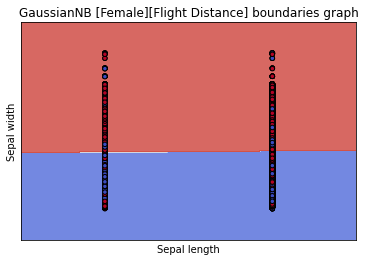

<Figure size 1440x720 with 0 Axes>

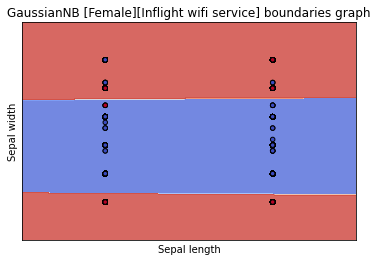

<Figure size 1440x720 with 0 Axes>

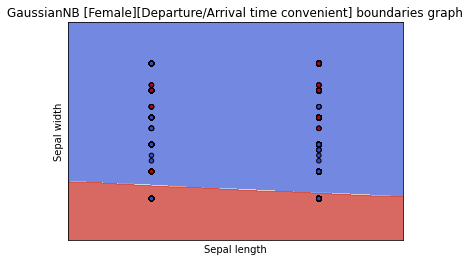

<Figure size 1440x720 with 0 Axes>

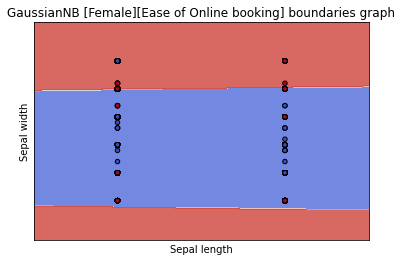

<Figure size 1440x720 with 0 Axes>

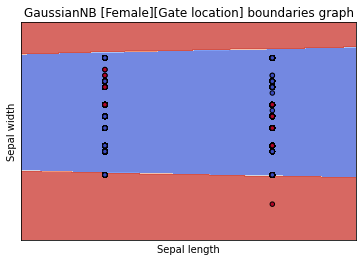

<Figure size 1440x720 with 0 Axes>

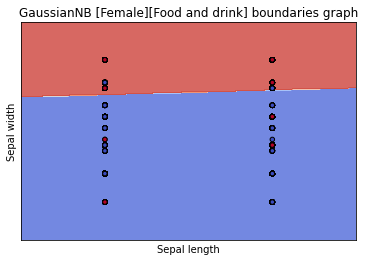

<Figure size 1440x720 with 0 Axes>

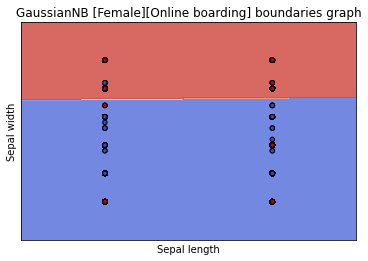

<Figure size 1440x720 with 0 Axes>

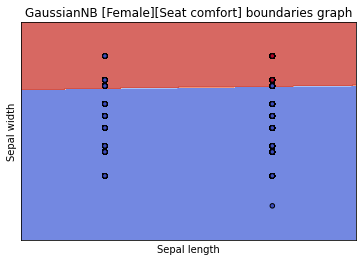

<Figure size 1440x720 with 0 Axes>

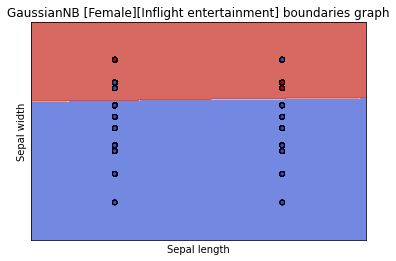

<Figure size 1440x720 with 0 Axes>

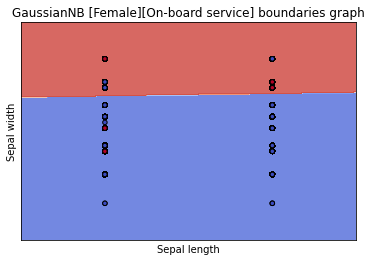

<Figure size 1440x720 with 0 Axes>

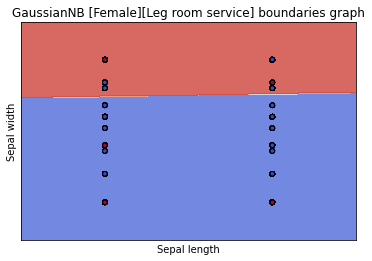

<Figure size 1440x720 with 0 Axes>

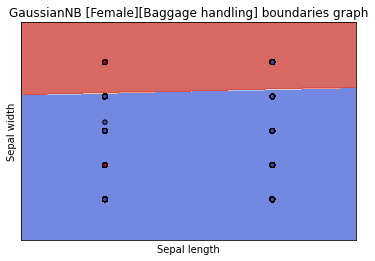

<Figure size 1440x720 with 0 Axes>

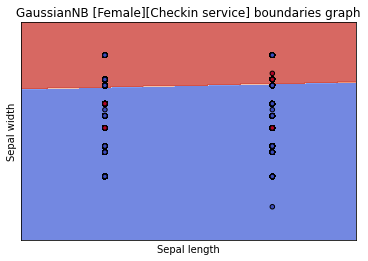

<Figure size 1440x720 with 0 Axes>

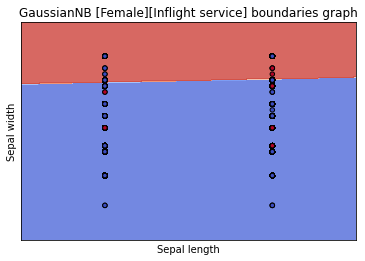

<Figure size 1440x720 with 0 Axes>

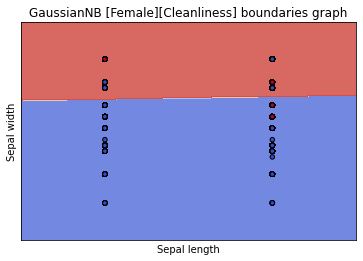

<Figure size 1440x720 with 0 Axes>

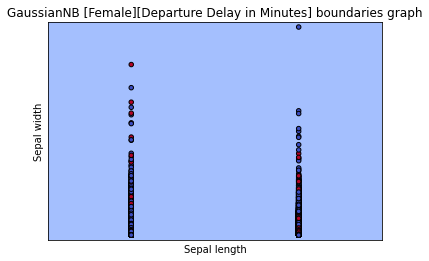

<Figure size 1440x720 with 0 Axes>

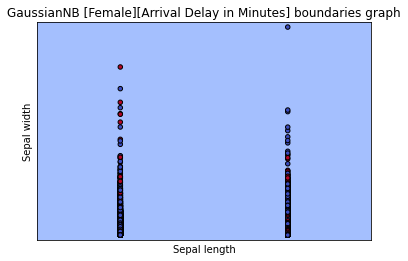

<Figure size 1440x720 with 0 Axes>

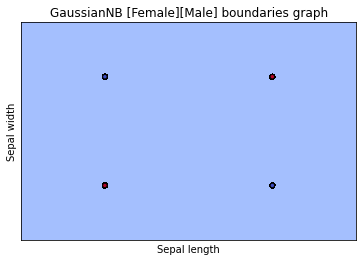

In [171]:
y = sp.dataset_y()
x = sp.dataset_X()
clf = GaussianNB()
for feature1 in x.columns:
    for feature2 in x.columns:
        if feature1 != feature2:
            X = np.array(x[[feature1,feature2]].copy())
            title = str(clf)[:-2] + ' [' + feature1 + ']' + '[' + feature2 + ']' + ' boundaries graph'
            plot_decision_boundaries(*calc_decision_boundaries(X, y, clf), title)

### Hyperparameters optimization 

In [299]:
def cross_validation(dataset, chunk = 10):
    shuffeled_data = np.array(dataset)
    np.random.shuffle(shuffeled_data)
    chunked_data = np.array_split(shuffeled_data, chunk)
    return np.array(chunked_data)

In [300]:
# testing k-fold cross val
counter = 0
i = 1
train_data = np.array(sp.train_data())
indexes = [x for x in range(len(train_data))]
while(counter < 5):
    if len(train_data)%i == 0:
        validation_sets = cross_validation(indexes, i)
        print(validation_sets.shape)
        tmp = []
        for x in validation_sets:
            tmp.append(train_data[x[1]][0])          
        print(tmp)
        counter += 1
    i += 1

(1, 103904)
[0.4723351424606127]
(2, 51952)
[0.4723351424606127, -2.1171244963382723]
(4, 25976)
[-2.1171244963382723, 0.4723351424606127, 0.4723351424606127, -2.1171244963382723]
(8, 12988)
[-2.1171244963382723, -2.1171244963382723, -2.1171244963382723, 0.4723351424606127, 0.4723351424606127, 0.4723351424606127, 0.4723351424606127, 0.4723351424606127]
(16, 6494)
[-2.1171244963382723, 0.4723351424606127, -2.1171244963382723, 0.4723351424606127, -2.1171244963382723, -2.1171244963382723, 0.4723351424606127, 0.4723351424606127, 0.4723351424606127, 0.4723351424606127, 0.4723351424606127, 0.4723351424606127, 0.4723351424606127, -2.1171244963382723, 0.4723351424606127, 0.4723351424606127]


In [305]:
sp.train_data()

,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,...,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,Male,Female,satisfaction
79576,-2.117124,-1.081744,0.667217,-1.071681,-0.423046,0.203344,-0.694024,-0.541737,-0.082838,-0.908889,...,1.252571,0.311247,1.321725,-1.452699,-1.043356,-0.374402,-0.380357,1.019072,-1.019025,0
92871,-2.117124,-0.815464,0.667217,-1.071681,-0.133568,-0.550310,-0.694024,-0.541737,0.245475,-0.908889,...,-0.269538,1.160189,1.321725,1.148858,-1.043356,0.771209,1.283588,1.019072,-1.019025,0
89659,0.472335,0.116517,0.667217,1.010115,-0.629098,0.203344,-0.037754,0.173020,-0.082838,1.352458,...,0.491517,0.311247,-1.614233,0.281672,0.517445,-0.067043,-0.075301,1.019072,-1.019025,1
599,-2.117124,-1.015174,0.667217,-1.071681,-0.941695,1.710650,-2.006563,0.887777,-0.903620,-1.662672,...,0.491517,1.160189,1.321725,1.148858,-1.823757,-0.374402,-0.324892,-0.981277,0.981322,1
23588,0.472335,0.049947,0.667217,1.010115,-0.838166,0.203344,-0.037754,0.887777,-0.082838,1.352458,...,1.252571,1.160189,1.321725,1.148858,0.517445,1.972704,1.810504,1.019072,-1.019025,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3743,0.472335,0.915358,-1.498750,-1.071681,-1.045223,-0.550310,0.618515,-1.971252,-1.724402,1.352458,...,-0.269538,0.311247,0.404238,1.148858,1.297846,-0.374402,-0.297160,1.019072,-1.019025,0
26831,0.472335,2.047049,0.667217,-1.071681,-0.881387,1.710650,1.274785,1.602534,1.558726,-1.662672,...,1.252571,1.160189,0.404238,1.148858,1.297846,-0.374402,-0.380357,-0.981277,0.981322,1
31591,0.472335,-0.682324,0.667217,1.010115,1.324879,0.956997,0.618515,0.887777,0.737944,0.598676,...,-1.030593,1.160189,-0.513249,1.148858,0.517445,-0.318518,-0.380357,1.019072,-1.019025,1
94864,-2.117124,0.316227,0.667217,-1.071681,-0.875356,-2.057616,-0.037754,-1.971252,-0.411151,-0.908889,...,1.252571,-2.235580,-0.146254,1.148858,-1.043356,-0.374402,-0.380357,-0.981277,0.981322,1


In [310]:
np.array(sp.train_data())[:,:-1]

array([[-2.1171245 , -1.08174403,  0.66721744, ..., -0.38035725,
         1.01907236, -1.01902527],
       [-2.1171245 , -0.81546375,  0.66721744, ...,  1.28358825,
         1.01907236, -1.01902527],
       [ 0.47233514,  0.11651724,  0.66721744, ..., -0.07530057,
         1.01907236, -1.01902527],
       ...,
       [ 0.47233514, -0.68232361,  0.66721744, ..., -0.38035725,
         1.01907236, -1.01902527],
       [-2.1171245 ,  0.31622745,  0.66721744, ..., -0.38035725,
        -0.98127703,  0.98132238],
       [ 0.47233514, -0.81546375,  0.66721744, ..., -0.38035725,
         1.01907236, -1.01902527]])

In [311]:
np.array(sp.train_data())[:, -1:]

array([[0.],
       [0.],
       [1.],
       ...,
       [1.],
       [1.],
       [1.]])

In [329]:
# clfs avg efficiency with k-fold cross val 
k = 10
train_data = np.array(sp.train_data())
indexes = [x for x in range(len(train_data))]
effiency = 0
clf_conf = {} 
summary = []
avg_stats = []
for key in classifier_list:
    if key == 'Naive Gaussian':
        validation_sets = cross_validation(indexes, k)
        summary = []
        avg_stats = []
        for i in range(len(validation_sets)):
#             train_indexes = [validation_sets[j] for j in range(len(validation_sets)) if j!= i]
            train_indexes = np.concatenate(np.delete(np.copy(validation_sets), i, 0), 0)
            test_indexes = validation_sets[i]
#             print(train_data)
            train = np.take(train_data, train_indexes, axis = 0)
            test = np.take(train_data, test_indexes, axis = 0)
#             print(len(train))
#             print(len(test))
            train_x = train[:,:-1].copy()
            train_y = train[:, -1:].copy()
        
            test_x = test[:,:-1].copy()
            test_y = test[:, -1:].copy()
        
            
            clf_conf[key] = run_classifier(classifier_list, key, train_x, train_y.ravel(), test_x, test_y.ravel())
            stats = calc_classifier_stats(clf_conf, key)
            summary.append(stats)
#             draw_confusion_matrix(classifier_list, key, test_x, test_y.ravel())
            print(stats)
    
        accu = 0
        f1 = 0
        for x in summary:
            accu+=x[1]
            f1+=x[2]
        tmp = {'clf':key, 'accu': accu/k, 'f1':f1/k}
        avg_stats.append(tmp)
            

<ipython-input-299-d75f188f55d4>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(chunked_data)


[INFO] Classifier: Naive Gaussian
['Naive Gaussian', 0.8566066788567029, 0.8535341592776227]
[INFO] Classifier: Naive Gaussian
['Naive Gaussian', 0.8570878644981234, 0.8531479720165038]
[INFO] Classifier: Naive Gaussian
['Naive Gaussian', 0.8636319892214417, 0.8597627069520911]
[INFO] Classifier: Naive Gaussian
['Naive Gaussian', 0.8644018862477144, 0.8612997228584314]
[INFO] Classifier: Naive Gaussian
['Naive Gaussian', 0.8691049085659288, 0.8662422130654845]
[INFO] Classifier: Naive Gaussian
['Naive Gaussian', 0.8628488931665063, 0.8593576312089071]
[INFO] Classifier: Naive Gaussian
['Naive Gaussian', 0.8666025024061598, 0.8634528283623935]
[INFO] Classifier: Naive Gaussian
['Naive Gaussian', 0.8641000962463907, 0.8610474472085281]
[INFO] Classifier: Naive Gaussian
['Naive Gaussian', 0.8630413859480269, 0.8602477401890856]
[INFO] Classifier: Naive Gaussian
['Naive Gaussian', 0.8600577478344562, 0.856455146606536]


In [330]:
 avg_stats

[{'clf': 'Naive Gaussian',
  'accu': 0.8627483952991453,
  'f1': 0.8594547567745583}]

In [163]:
from sklearn import svm, datasets
def plot_decision_boundaries_SVM():
    # import some data to play with
#     iris = datasets.load_iris()
    # Take the first two features. We could avoid this by using a two-dim dataset
#     X = iris.data[:, :2]
#     y = iris.target

    X = np.array(sp.dataset_X().iloc[:, 0:2].copy())
    y = sp.dataset_y()

    # we create an instance of SVM and fit out data. We do not scale our
    # data since we want to plot the support vectors
    C = 1.0  # SVM regularization parameter
    models = (svm.SVC(kernel='linear', C=C),
              svm.LinearSVC(C=C, max_iter=10000),
              svm.SVC(kernel='rbf', gamma=0.7, C=C),
              svm.SVC(kernel='poly', degree=3, gamma='auto', C=C))
    models = (clf.fit(X, y) for clf in models)

    # title for the plots
    titles = ('SVC with linear kernel',
              'LinearSVC (linear kernel)',
              'SVC with RBF kernel',
              'SVC with polynomial (degree 3) kernel')

    # Set-up 2x2 grid for plotting.
    fig, sub = plt.subplots(2, 2)
    plt.subplots_adjust(wspace=0.4, hspace=0.4)

    X0, X1 = X[:, 0], X[:, 1]
    xx, yy = make_meshgrid(X0, X1)

    for clf, title, ax in zip(models, titles, sub.flatten()):
        plot_contours(ax, clf, xx, yy,
                      cmap=plt.cm.coolwarm, alpha=0.8)
        ax.scatter(X0, X1, c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xlabel('Sepal length')
        ax.set_ylabel('Sepal width')
        ax.set_xticks(())
        ax.set_yticks(())
        ax.set_title(title)

    plt.show()

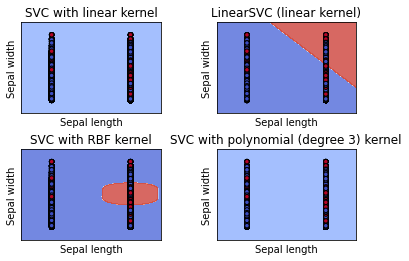

In [42]:
plot_decision_boundaries()